# Importing Libraries

In [1]:
import pandas as pd
import numpy as np
import warnings
import seaborn as sns
import matplotlib
import matplotlib.pyplot as plt
import sys
!conda install --yes --prefix {sys.prefix} plotly
import plotly.express as px
%matplotlib inline
from scipy.stats import mannwhitneyu
pd.options.display.float_format = "{:,.2f}".format
import re

from sklearn.preprocessing import MinMaxScaler,StandardScaler
from sklearn import preprocessing

from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier,GradientBoostingClassifier
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score,confusion_matrix,ConfusionMatrixDisplay,classification_report


from numpy import unique
from numpy import where
import matplotlib as mpl

from sklearn.linear_model import LogisticRegression
from sklearn.metrics import accuracy_score


from mpl_toolkits.mplot3d import Axes3D
from sklearn import datasets
from sklearn.decomposition import PCA
np.random.seed(5)

warnings.filterwarnings('ignore')

Solving environment: ...working... done

## Package Plan ##

  environment location: C:\ProgramData\Anaconda3

  added / updated specs:
    - plotly


The following NEW packages will be INSTALLED:

  ruamel.yaml        pkgs/main/win-64::ruamel.yaml-0.16.12-py39h2bbff1b_3 None
  ruamel.yaml.clib   pkgs/main/win-64::ruamel.yaml.clib-0.2.6-py39h2bbff1b_1 None

The following packages will be UPDATED:

  conda                               22.9.0-py39haa95532_0 --> 22.11.0-py39haa95532_1 None


Preparing transaction: ...working... done
Verifying transaction: ...working... failed



EnvironmentNotWritableError: The current user does not have write permissions to the target environment.
  environment location: C:\ProgramData\Anaconda3




# Google Playstore Apps Dataset- Preprocessing

In [2]:
#Reading Data using Pandas Library
#Method read_csv is used to read the CSV file which is our dataset file format
googleplaystore = pd.read_csv("googleplaystore.csv")
#Now it will display the data as dataframe
googleplaystore
#We are now dropping the duplicates from the attribute "App" in the dataframe
google_apps = googleplaystore.drop_duplicates(subset='App')
#Display's count of apps in the dataset
print('Total number of apps in the dataset = ', google_apps['App'].value_counts().sum())
#Displays modified dataset
google_apps

Total number of apps in the dataset =  9660


,App,Category,Rating,Reviews,Size,Installs,Type,Price,Content Rating,Genres,Last Updated,Current Ver,Android Ver
0,Photo Editor & Candy Camera & Grid & ScrapBook,ART_AND_DESIGN,4.10,159,19M,"10,000+",Free,0,Everyone,Art & Design,"January 7, 2018",1.0.0,4.0.3 and up
1,Coloring book moana,ART_AND_DESIGN,3.90,967,14M,"500,000+",Free,0,Everyone,Art & Design;Pretend Play,"January 15, 2018",2.0.0,4.0.3 and up
2,"U Launcher Lite – FREE Live Cool Themes, Hide ...",ART_AND_DESIGN,4.70,87510,8.7M,"5,000,000+",Free,0,Everyone,Art & Design,"August 1, 2018",1.2.4,4.0.3 and up
3,Sketch - Draw & Paint,ART_AND_DESIGN,4.50,215644,25M,"50,000,000+",Free,0,Teen,Art & Design,"June 8, 2018",Varies with device,4.2 and up
4,Pixel Draw - Number Art Coloring Book,ART_AND_DESIGN,4.30,967,2.8M,"100,000+",Free,0,Everyone,Art & Design;Creativity,"June 20, 2018",1.1,4.4 and up
...,...,...,...,...,...,...,...,...,...,...,...,...,...
10836,Sya9a Maroc - FR,FAMILY,4.50,38,53M,"5,000+",Free,0,Everyone,Education,"July 25, 2017",1.48,4.1 and up
10837,Fr. Mike Schmitz Audio Teachings,FAMILY,5.00,4,3.6M,100+,Free,0,Everyone,Education,"July 6, 2018",1.0,4.1 and up
10838,Parkinson Exercices FR,MEDICAL,NaN,3,9.5M,"1,000+",Free,0,Everyone,Medical,"January 20, 2017",1.0,2.2 and up
10839,The SCP Foundation DB fr nn5n,BOOKS_AND_REFERENCE,4.50,114,Varies with device,"1,000+",Free,0,Mature 17+,Books & Reference,"January 19, 2015",Varies with device,Varies with device


In [3]:
#using info() we are displaying attribute data-type
print(google_apps.info())

<class 'pandas.core.frame.DataFrame'>
Int64Index: 9660 entries, 0 to 10840
Data columns (total 13 columns):
 #   Column          Non-Null Count  Dtype  
---  ------          --------------  -----  
 0   App             9660 non-null   object 
 1   Category        9660 non-null   object 
 2   Rating          8197 non-null   float64
 3   Reviews         9660 non-null   object 
 4   Size            9660 non-null   object 
 5   Installs        9660 non-null   object 
 6   Type            9659 non-null   object 
 7   Price           9660 non-null   object 
 8   Content Rating  9659 non-null   object 
 9   Genres          9660 non-null   object 
 10  Last Updated    9660 non-null   object 
 11  Current Ver     9652 non-null   object 
 12  Android Ver     9657 non-null   object 
dtypes: float64(1), object(12)
memory usage: 1.0+ MB
None


In [4]:
#We are taking sum of nulls from each attribute
google_apps.isnull().sum()

App                  0
Category             0
Rating            1463
Reviews              0
Size                 0
Installs             0
Type                 1
Price                0
Content Rating       1
Genres               0
Last Updated         0
Current Ver          8
Android Ver          3
dtype: int64

In [5]:
# we have created a function to display dtypes, 
# number of null values in a attribute, and unique count of attributes when ever we call this function
def printinfo():
    temp = pd.DataFrame(index=google_apps.columns)
    temp['data_type'] = google_apps.dtypes
    temp['null_count'] = google_apps.isnull().sum()
    temp['unique_count'] = google_apps.nunique()
    return temp

In [6]:
# finding if there are any null values in the Rating column.
google_apps['Rating'].isnull().values.any()

True

In [7]:
# finding if there are any null values in the Type column.
google_apps['Type'].isnull().values.any()

True

In [8]:
# Replace the missing values with "FREE" in "Type" attribute
google_apps['Type'].fillna("Free",inplace = True)

In [9]:
#Again checking for nulls sum in all attribute
google_apps.isnull().sum()

App                  0
Category             0
Rating            1463
Reviews              0
Size                 0
Installs             0
Type                 0
Price                0
Content Rating       1
Genres               0
Last Updated         0
Current Ver          8
Android Ver          3
dtype: int64

In [10]:
# Checking if there is any null values in content rating
google_apps[google_apps['Content Rating'].isnull()]

,App,Category,Rating,Reviews,Size,Installs,Type,Price,Content Rating,Genres,Last Updated,Current Ver,Android Ver
10472,Life Made WI-Fi Touchscreen Photo Frame,1.9,19.00,3.0M,"1,000+",Free,0,Everyone,NaN,"February 11, 2018",1.0.19,4.0 and up,NaN


In [11]:
# For one of the rows, all of the current column values are being swapped out for those from the previous column. 
# This row should therefore be removed from our dataframe.
google_apps.dropna(subset = ['Content Rating'],inplace=True,how='any')
printinfo()

,data_type,null_count,unique_count
App,object,0,9659
Category,object,0,33
Rating,float64,1463,39
Reviews,object,0,5330
Size,object,0,461
Installs,object,0,21
Type,object,0,2
Price,object,0,92
Content Rating,object,0,6
Genres,object,0,118


In [12]:
# Use the Mode to fill in the Rating Column's missing values with the help of "fillna()" method
modevalue_rating = google_apps['Rating'].fillna(google_apps['Rating'].mode()[0],inplace=True)
modevalue_rating
# changing the data type of "Reviews" as float
google_apps['Reviews'] = google_apps['Reviews'].astype('float')
# Checking number of null values in a attribute, and unique count of attributes when ever we call this function
printinfo()

,data_type,null_count,unique_count
App,object,0,9659
Category,object,0,33
Rating,float64,0,39
Reviews,float64,0,5330
Size,object,0,461
Installs,object,0,21
Type,object,0,2
Price,object,0,92
Content Rating,object,0,6
Genres,object,0,118


In [13]:
# Data Processing
# Changing "size" column data type from object to Integer
# Eliminating the `+` Symbol and replacing them with ''
google_apps['Size'] = google_apps['Size'].astype(str).str.replace('+','')
google_apps['Size']


0                       19M
1                       14M
2                      8.7M
3                       25M
4                      2.8M
                ...        
10836                   53M
10837                  3.6M
10838                  9.5M
10839    Varies with device
10840                   19M
Name: Size, Length: 9659, dtype: object

In [14]:
#Eliminating the `,` Symbol and replacing them with ''
google_apps['Size'] = google_apps['Size'].astype(str).str.replace(',','')
google_apps['Size']

0                       19M
1                       14M
2                      8.7M
3                       25M
4                      2.8M
                ...        
10836                   53M
10837                  3.6M
10838                  9.5M
10839    Varies with device
10840                   19M
Name: Size, Length: 9659, dtype: object

In [15]:
#Replacing the 'M' with e^6.
google_apps['Size'] = google_apps['Size'].astype(str).str.replace('M','e+6')
google_apps['Size']

0                     19e+6
1                     14e+6
2                    8.7e+6
3                     25e+6
4                    2.8e+6
                ...        
10836                 53e+6
10837                3.6e+6
10838                9.5e+6
10839    Varies with device
10840                 19e+6
Name: Size, Length: 9659, dtype: object

In [16]:
#Replacing the `k` with e^3.
google_apps['Size']= google_apps['Size'].astype(str).str.replace('k', 'e+3')
google_apps['Size']

0                     19e+6
1                     14e+6
2                    8.7e+6
3                     25e+6
4                    2.8e+6
                ...        
10836                 53e+6
10837                3.6e+6
10838                9.5e+6
10839    Varies with device
10840                 19e+6
Name: Size, Length: 9659, dtype: object

In [17]:
#Replacing the `Varies with device` value with *Nan*.
google_apps['Size'] = google_apps.Size.replace('Varies with device', np.NaN)
google_apps['Size']

0         19e+6
1         14e+6
2        8.7e+6
3         25e+6
4        2.8e+6
          ...  
10836     53e+6
10837    3.6e+6
10838    9.5e+6
10839       NaN
10840     19e+6
Name: Size, Length: 9659, dtype: object

In [18]:
#Using "to_numeric" converting to Numeric type.
google_apps['Size'] = pd.to_numeric(google_apps['Size'])
google_apps['Size']

0       19,000,000.00
1       14,000,000.00
2        8,700,000.00
3       25,000,000.00
4        2,800,000.00
             ...     
10836   53,000,000.00
10837    3,600,000.00
10838    9,500,000.00
10839             NaN
10840   19,000,000.00
Name: Size, Length: 9659, dtype: float64

In [19]:
#eliminating the rows of Size column which is having "NaN"
google_apps.dropna(subset = ['Size'], inplace=True)
# Checking number of null values in a attribute, and unique count of attributes when ever we call this function
printinfo()

,data_type,null_count,unique_count
App,object,0,8432
Category,object,0,33
Rating,float64,0,39
Reviews,float64,0,4304
Size,float64,0,459
Installs,object,0,20
Type,object,0,2
Price,object,0,87
Content Rating,object,0,6
Genres,object,0,115


In [20]:
# Eliminating the `+` Symbol and replacing them with ''
google_apps['Installs'] = google_apps['Installs'].astype(str).str.replace('+','')

In [21]:
# Eliminating the `,` Symbol and replacing them with ''
google_apps['Installs'] = google_apps['Installs'].astype(str).str.replace(',', '')

In [22]:
# converting to Numeric type.
google_apps['Installs'] = pd.to_numeric(google_apps['Installs'])

In [23]:
# Checking number of null values in a attribute, and unique count of attributes when ever we call this function
printinfo()

,data_type,null_count,unique_count
App,object,0,8432
Category,object,0,33
Rating,float64,0,39
Reviews,float64,0,4304
Size,float64,0,459
Installs,int64,0,20
Type,object,0,2
Price,object,0,87
Content Rating,object,0,6
Genres,object,0,115


In [24]:
# Converting the Price column from object to numeric
# Have a look to know how many unique values are having in 'Price' column
# price=google_apps['Price'].nunique()
# google_apps['Price'].value_counts()

In [25]:
# Remove the `$` symbol from price column values
# google_apps['Price'] = google_apps['Price'].astype(str).str.replace('$','')
# Finally converting to Numeric type
# google_apps['Price'] = pd.to_numeric(google_apps['Price'])
google_apps['Price'] = google_apps['Price'].str.replace('$','')

In [26]:
google_apps['Price']=pd.to_numeric(google_apps['Price'])
google_apps.nsmallest(10, 'Price')
google_apps.nlargest(10,'Price')

,App,Category,Rating,Reviews,Size,Installs,Type,Price,Content Rating,Genres,Last Updated,Current Ver,Android Ver
4367,I'm Rich - Trump Edition,LIFESTYLE,3.60,275.00,"7,300,000.00",10000,Paid,400.00,Everyone,Lifestyle,"May 3, 2018",1.0.1,4.1 and up
4197,most expensive app (H),FAMILY,4.30,6.00,"1,500,000.00",100,Paid,399.99,Everyone,Entertainment,"July 16, 2018",1.0,7.0 and up
4362,💎 I'm rich,LIFESTYLE,3.80,718.00,"26,000,000.00",10000,Paid,399.99,Everyone,Lifestyle,"March 11, 2018",1.0.0,4.4 and up
5351,I am rich,LIFESTYLE,3.80,"3,547.00","1,800,000.00",100000,Paid,399.99,Everyone,Lifestyle,"January 12, 2018",2.0,4.0.3 and up
5354,I am Rich Plus,FAMILY,4.00,856.00,"8,700,000.00",10000,Paid,399.99,Everyone,Entertainment,"May 19, 2018",3.0,4.4 and up
5356,I Am Rich Premium,FINANCE,4.10,"1,867.00","4,700,000.00",50000,Paid,399.99,Everyone,Finance,"November 12, 2017",1.6,4.0 and up
5358,I am Rich!,FINANCE,3.80,93.00,"22,000,000.00",1000,Paid,399.99,Everyone,Finance,"December 11, 2017",1.0,4.1 and up
5359,I am rich(premium),FINANCE,3.50,472.00,"965,000.00",5000,Paid,399.99,Everyone,Finance,"May 1, 2017",3.4,4.4 and up
5362,I Am Rich Pro,FAMILY,4.40,201.00,"2,700,000.00",5000,Paid,399.99,Everyone,Entertainment,"May 30, 2017",1.54,1.6 and up
5364,I am rich (Most expensive app),FINANCE,4.10,129.00,"2,700,000.00",1000,Paid,399.99,Teen,Finance,"December 6, 2017",2,4.0.3 and up


In [27]:
# Taking count of different prices
google_apps.Price.value_counts()

0.00      7747
0.99       142
2.99       110
1.99        66
4.99        63
          ... 
18.99        1
389.99       1
19.90        1
1.75         1
1.04         1
Name: Price, Length: 87, dtype: int64

newPrice = []
for row in google_apps.Price:
   if row!= "0":
        newrow = float(row[1:])
    else:
        newrow = 0 
        
    newPrice.append(newrow)
        
google_apps.Price = newPrice
google_apps.Price.head()

In [28]:
# Checking number of null values in a attribute, and unique count of attributes when ever we call this function

printinfo()

,data_type,null_count,unique_count
App,object,0,8432
Category,object,0,33
Rating,float64,0,39
Reviews,float64,0,4304
Size,float64,0,459
Installs,int64,0,20
Type,object,0,2
Price,float64,0,87
Content Rating,object,0,6
Genres,object,0,115


In [29]:
# Finally converting to Numeric type

google_apps['Reviews'] = pd.to_numeric(google_apps['Reviews'])

In [30]:
# using describe from pandas we will get the below information from numeric columns

google_apps.describe()

,Rating,Reviews,Size,Installs,Price
count,"8,432.00","8,432.00","8,432.00","8,432.00","8,432.00"
mean,4.18,"120,655.32","20,395,289.31","3,724,212.23",1.23
std,0.51,"936,344.95","21,827,542.44","24,829,397.64",18.03
min,1.00,0.00,"8,500.00",0.00,0.00
25%,4.00,17.00,"4,600,000.00","1,000.00",0.00
50%,4.30,475.50,"12,000,000.00","50,000.00",0.00
75%,4.50,"15,667.25","28,000,000.00","1,000,000.00",0.00
max,5.00,"44,891,723.00","100,000,000.00","1,000,000,000.00",400.00


# Google App Reviews Dataset- Preprocessing

In [31]:
#Reading Data using Pandas Library
#Method read_csv is used to read the CSV file which is our dataset file format

userreviews = pd.read_csv("googleplaystore_user_reviews.csv")
userreviews

,App,Translated_Review,Sentiment,Sentiment_Polarity,Sentiment_Subjectivity
0,10 Best Foods for You,I like eat delicious food. That's I'm cooking ...,Positive,1.00,0.53
1,10 Best Foods for You,This help eating healthy exercise regular basis,Positive,0.25,0.29
2,10 Best Foods for You,NaN,NaN,NaN,NaN
3,10 Best Foods for You,Works great especially going grocery store,Positive,0.40,0.88
4,10 Best Foods for You,Best idea us,Positive,1.00,0.30
...,...,...,...,...,...
64290,Houzz Interior Design Ideas,NaN,NaN,NaN,NaN
64291,Houzz Interior Design Ideas,NaN,NaN,NaN,NaN
64292,Houzz Interior Design Ideas,NaN,NaN,NaN,NaN
64293,Houzz Interior Design Ideas,NaN,NaN,NaN,NaN


In [32]:
# eliminating duplicates and na's from user reviews data

userreviews=userreviews.dropna().drop_duplicates()

# checking lengths of user reviews after removing the na and duplicates

len(userreviews)

29692

In [33]:
# checking data type of attributes using "info()"

print(userreviews.info())

<class 'pandas.core.frame.DataFrame'>
Int64Index: 29692 entries, 0 to 64230
Data columns (total 5 columns):
 #   Column                  Non-Null Count  Dtype  
---  ------                  --------------  -----  
 0   App                     29692 non-null  object 
 1   Translated_Review       29692 non-null  object 
 2   Sentiment               29692 non-null  object 
 3   Sentiment_Polarity      29692 non-null  float64
 4   Sentiment_Subjectivity  29692 non-null  float64
dtypes: float64(2), object(3)
memory usage: 1.4+ MB
None


In [34]:
# checking nulls sums in the attributes

userreviews.isnull().sum()

App                       0
Translated_Review         0
Sentiment                 0
Sentiment_Polarity        0
Sentiment_Subjectivity    0
dtype: int64

In [35]:
# we have created a function to display dtypes, 
# number of null values in a attribute, and unique count of attributes when ever we call this function

def reviewsprintinfo():
    temp = pd.DataFrame(index=userreviews.columns)
    temp['data_type'] = userreviews.dtypes
    temp['null_count'] = userreviews.isnull().sum()
    temp['unique_count'] = userreviews.nunique()
    return temp

In [36]:
# now we are checking for object types for attribute

reviewsprintinfo()

,data_type,null_count,unique_count
App,object,0,865
Translated_Review,object,0,27994
Sentiment,object,0,3
Sentiment_Polarity,float64,0,5410
Sentiment_Subjectivity,float64,0,4474


In [37]:
# using to_csv we are saving the data to csv file in current working directory

google_apps.to_csv('google_apps.csv', index=False)

# Permissions Dataset- Preprocessing

In [38]:
# Used to change the display format

pd.options.display.float_format = "{:,.2f}".format

In [39]:
#Reading Data using Pandas Library
#Method read_csv is used to read the CSV file which is our dataset file format

Permission = pd.read_csv("Permissions_all.csv")

In [40]:
# displays top 5 rows in the dataframe

Permission.head()

,Unnamed: 0,App,App Id,Category,Rating,RatingCount,Installs,Minimum_Installs,Maximum_Installs,Free,...,Developer Email,Released,Last_Updated,Content Rating,Privacy Policy,Ad_Supported,In_App_Purchases,Editors_Choice,Scraped_Time,Permissions
0,0,Gakondo,com.ishakwe.gakondo,Adventure,0.00,0.00,10+,10.00,15,True,...,jean21101999@gmail.com,26-Feb-20,26-Feb-20,Everyone,https://beniyizibyose.tk/projects/,False,False,False,6/15/2021 20:19,"{""Camera"": [""take pictures and videos""], ""Othe..."
1,1,Ampere Battery Info,com.webserveis.batteryinfo,Tools,4.40,64.00,"5,000+","5,000.00",7662,True,...,webserveis@gmail.com,21-May-20,6-May-21,Everyone,https://dev4phones.wordpress.com/licencia-de-uso/,True,False,False,6/15/2021 20:19,"{""Other"": [""full network access"", ""prevent dev..."
2,2,Vibook,com.doantiepvien.crm,Productivity,0.00,0.00,50+,50.00,58,True,...,vnacrewit@gmail.com,9-Aug-19,19-Aug-19,Everyone,https://www.vietnamairlines.com/vn/en/terms-an...,False,False,False,6/15/2021 20:19,NaN
3,3,Smart City Trichy Public Service Vehicles 17UC...,cst.stJoseph.ug17ucs548,Communication,5.00,5.00,10+,10.00,19,True,...,climatesmarttech2@gmail.com,10-Sep-18,13-Oct-18,Everyone,NaN,True,False,False,6/15/2021 20:19,NaN
4,4,GROW.me,com.horodyski.grower,Tools,0.00,0.00,100+,100.00,478,True,...,rmilekhorodyski@gmail.com,21-Feb-20,12-Nov-18,Everyone,http://www.horodyski.com.pl,False,False,False,6/15/2021 20:19,"{""Identity"": [""find accounts on the device""], ..."


In [41]:
# Eliminating unwanted attribute

Permission.drop(columns=['Installs', 'Minimum_Installs','Minimum_Android','Developer Website','Developer Email', 'Privacy Policy'], inplace=True)

# displays top 5 rows

Permission.head()

,Unnamed: 0,App,App Id,Category,Rating,RatingCount,Maximum_Installs,Free,Price,Currency,Size,Develop_Id,Released,Last_Updated,Content Rating,Ad_Supported,In_App_Purchases,Editors_Choice,Scraped_Time,Permissions
0,0,Gakondo,com.ishakwe.gakondo,Adventure,0.00,0.00,15,True,0.00,USD,10M,Jean Confident Irénée NIYIZIBYOSE,26-Feb-20,26-Feb-20,Everyone,False,False,False,6/15/2021 20:19,"{""Camera"": [""take pictures and videos""], ""Othe..."
1,1,Ampere Battery Info,com.webserveis.batteryinfo,Tools,4.40,64.00,7662,True,0.00,USD,2.9M,Webserveis,21-May-20,6-May-21,Everyone,True,False,False,6/15/2021 20:19,"{""Other"": [""full network access"", ""prevent dev..."
2,2,Vibook,com.doantiepvien.crm,Productivity,0.00,0.00,58,True,0.00,USD,3.7M,Cabin Crew,9-Aug-19,19-Aug-19,Everyone,False,False,False,6/15/2021 20:19,NaN
3,3,Smart City Trichy Public Service Vehicles 17UC...,cst.stJoseph.ug17ucs548,Communication,5.00,5.00,19,True,0.00,USD,1.8M,Climate Smart Tech2,10-Sep-18,13-Oct-18,Everyone,True,False,False,6/15/2021 20:19,NaN
4,4,GROW.me,com.horodyski.grower,Tools,0.00,0.00,478,True,0.00,USD,6.2M,Rafal Milek-Horodyski,21-Feb-20,12-Nov-18,Everyone,False,False,False,6/15/2021 20:19,"{""Identity"": [""find accounts on the device""], ..."


In [42]:
# Updating the name of the attribute
Permission = Permission.rename(columns={"Maximum_Installs": "Install"})

# displays top 5 rows
Permission.head()

,Unnamed: 0,App,App Id,Category,Rating,RatingCount,Install,Free,Price,Currency,Size,Develop_Id,Released,Last_Updated,Content Rating,Ad_Supported,In_App_Purchases,Editors_Choice,Scraped_Time,Permissions
0,0,Gakondo,com.ishakwe.gakondo,Adventure,0.00,0.00,15,True,0.00,USD,10M,Jean Confident Irénée NIYIZIBYOSE,26-Feb-20,26-Feb-20,Everyone,False,False,False,6/15/2021 20:19,"{""Camera"": [""take pictures and videos""], ""Othe..."
1,1,Ampere Battery Info,com.webserveis.batteryinfo,Tools,4.40,64.00,7662,True,0.00,USD,2.9M,Webserveis,21-May-20,6-May-21,Everyone,True,False,False,6/15/2021 20:19,"{""Other"": [""full network access"", ""prevent dev..."
2,2,Vibook,com.doantiepvien.crm,Productivity,0.00,0.00,58,True,0.00,USD,3.7M,Cabin Crew,9-Aug-19,19-Aug-19,Everyone,False,False,False,6/15/2021 20:19,NaN
3,3,Smart City Trichy Public Service Vehicles 17UC...,cst.stJoseph.ug17ucs548,Communication,5.00,5.00,19,True,0.00,USD,1.8M,Climate Smart Tech2,10-Sep-18,13-Oct-18,Everyone,True,False,False,6/15/2021 20:19,NaN
4,4,GROW.me,com.horodyski.grower,Tools,0.00,0.00,478,True,0.00,USD,6.2M,Rafal Milek-Horodyski,21-Feb-20,12-Nov-18,Everyone,False,False,False,6/15/2021 20:19,"{""Identity"": [""find accounts on the device""], ..."


In [43]:
# Making a copy of permission data frame

Permission_Copy = Permission.copy()

# Checking Data type of the data frame

Permission_Copy.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 1048575 entries, 0 to 1048574
Data columns (total 20 columns):
 #   Column            Non-Null Count    Dtype  
---  ------            --------------    -----  
 0   Unnamed: 0        1048575 non-null  int64  
 1   App               1048574 non-null  object 
 2   App Id            1048575 non-null  object 
 3   Category          1048575 non-null  object 
 4   Rating            1038265 non-null  float64
 5   RatingCount       1038265 non-null  float64
 6   Install           1048575 non-null  int64  
 7   Free              1048575 non-null  bool   
 8   Price             1048575 non-null  float64
 9   Currency          1048513 non-null  object 
 10  Size              1048483 non-null  object 
 11  Develop_Id        1048565 non-null  object 
 12  Released          1016542 non-null  object 
 13  Last_Updated      1048575 non-null  object 
 14  Content Rating    1048575 non-null  object 
 15  Ad_Supported      1048575 non-null  bool   
 16  

In [44]:
# Update the datatype of the attribute 'Size' to float and Add Size units
# Split Size number and Size Unit (M,k,G, Varies with device) separately into column Size and Size Unit

Permission_Copy[['Size','SizeUnit']] = Permission_Copy['Size'].str.extract(r"(?P<Size>\d*[\.\,]?\d*)(?P<SizeUnit>\D*)", expand=False)

In [45]:
# Eliminate comma inside numbers (for instance. 1,024 -> 1024)
Permission_Copy['Size'] = Permission_Copy['Size'].str.replace(',', '')

In [46]:
# update 'Size' attribute to float, any error, empty string (from Varies with device) -> NaN

Permission_Copy['Size'] = pd.to_numeric(Permission_Copy['Size'], errors='coerce')

In [47]:
# we created a function to convert size into MB
def mb_converter(row):
  if row['SizeUnit'] == 'k':
    return row['Size']/1024
  elif row['SizeUnit'] == 'G':
    return row['Size']*1024
  elif row['SizeUnit'] == 'M':
    return row['Size']

Permission_Copy['Size']=Permission_Copy.apply(mb_converter, axis = 1)

In [48]:
# Eliminating the attribute 'SizeUnit' (which is not required) & Pusing the changes in the copy to Permission (original dataframe)
Permission = Permission_Copy.drop('SizeUnit', axis = 1)

In [49]:
# Display top 5 rows

Permission.head()

,Unnamed: 0,App,App Id,Category,Rating,RatingCount,Install,Free,Price,Currency,Size,Develop_Id,Released,Last_Updated,Content Rating,Ad_Supported,In_App_Purchases,Editors_Choice,Scraped_Time,Permissions
0,0,Gakondo,com.ishakwe.gakondo,Adventure,0.00,0.00,15,True,0.00,USD,10.00,Jean Confident Irénée NIYIZIBYOSE,26-Feb-20,26-Feb-20,Everyone,False,False,False,6/15/2021 20:19,"{""Camera"": [""take pictures and videos""], ""Othe..."
1,1,Ampere Battery Info,com.webserveis.batteryinfo,Tools,4.40,64.00,7662,True,0.00,USD,2.90,Webserveis,21-May-20,6-May-21,Everyone,True,False,False,6/15/2021 20:19,"{""Other"": [""full network access"", ""prevent dev..."
2,2,Vibook,com.doantiepvien.crm,Productivity,0.00,0.00,58,True,0.00,USD,3.70,Cabin Crew,9-Aug-19,19-Aug-19,Everyone,False,False,False,6/15/2021 20:19,NaN
3,3,Smart City Trichy Public Service Vehicles 17UC...,cst.stJoseph.ug17ucs548,Communication,5.00,5.00,19,True,0.00,USD,1.80,Climate Smart Tech2,10-Sep-18,13-Oct-18,Everyone,True,False,False,6/15/2021 20:19,NaN
4,4,GROW.me,com.horodyski.grower,Tools,0.00,0.00,478,True,0.00,USD,6.20,Rafal Milek-Horodyski,21-Feb-20,12-Nov-18,Everyone,False,False,False,6/15/2021 20:19,"{""Identity"": [""find accounts on the device""], ..."


In [50]:
# update attribute 'Released' and 'Last Updated' to year-month-date
Permission['Released'] = pd.to_datetime(Permission['Released'], format='%d-%b-%y')

#displays data after update
Permission['Released']

0         2020-02-26
1         2020-05-21
2         2019-08-09
3         2018-09-10
4         2020-02-21
             ...    
1048570   2015-08-17
1048571   2013-11-12
1048572   2018-12-19
1048573   2020-01-08
1048574   2019-11-22
Name: Released, Length: 1048575, dtype: datetime64[ns]

In [51]:
# update attribute 'Released' and 'Last Updated' to year-month-date
Permission['Last_Updated'] = pd.to_datetime(Permission['Last_Updated'], format='%d-%b-%y')

#displays data after update
Permission['Last_Updated']

0         2020-02-26
1         2021-05-06
2         2019-08-19
3         2018-10-13
4         2018-11-12
             ...    
1048570   2019-05-10
1048571   2016-04-19
1048572   2019-01-02
1048573   2020-01-17
1048574   2019-11-22
Name: Last_Updated, Length: 1048575, dtype: datetime64[ns]

In [52]:
#Updating every boolean value to 0 & 1 (False/True)
Permission.loc[Permission['Free'] == True,'Free'] = 1
Permission.loc[Permission['Free'] == False,'Free'] = 0
Permission.loc[Permission['Ad_Supported'] == True,'Ad Supported'] = 1
Permission.loc[Permission['Ad_Supported'] == False,'Ad Supported'] = 0
Permission.loc[Permission['In_App_Purchases'] == True,'In App Purchases'] = 1
Permission.loc[Permission['In App Purchases'] == False,'In App Purchases'] = 0
Permission.loc[Permission['Editors_Choice'] == True,'Editors Choice'] = 1
Permission.loc[Permission['Editors_Choice'] == False,'Editors Choice'] = 0

In [53]:
# updating the attributes data type to 'int'
Permission[['Free','Ad_Supported','In_App_Purchases','Editors_Choice']]=Permission[['Free','Ad_Supported','In_App_Purchases','Editors_Choice']].astype('int')

In [54]:
# Update Scrapped time datatype and calculate App Age
Permission['Scraped_Time'] = pd.to_datetime(Permission['Scraped_Time'])

# formating the scrape time to year-month-days
Permission['Scraped_Time'] = Permission['Scraped_Time'].dt.strftime('%Y-%m-%d')

# updating data type
Permission['Scraped_Time'] = pd.to_datetime(Permission['Scraped_Time'])

In [55]:
# Dealing with Missing Values
Permission.isna().sum()

Unnamed: 0               0
App                      1
App Id                   0
Category                 0
Rating               10310
RatingCount          10310
Install                  0
Free                     0
Price                    0
Currency                62
Size                 33890
Develop_Id              10
Released             32033
Last_Updated             0
Content Rating           0
Ad_Supported             0
In_App_Purchases         0
Editors_Choice           0
Scraped_Time             0
Permissions         186069
Ad Supported             0
In App Purchases    959986
Editors Choice           0
dtype: int64

In [56]:
# Dealing with Null Values in 'App' attribute and updating the NA's name by 'Unname'
Permission['App'].fillna('Unname', inplace=True)

In [57]:
# Rating and Rating Count: 22883 null values
# Checking the % of NA in 'Rating' attribute
Permission.Rating.isna().sum()/Permission.shape[0]

0.009832391579047755

In [58]:
# Replacing Rating NA by '0' in 'Rating' attribute
Permission.Rating.fillna(0, inplace=True)

In [59]:
# Taking count of different rating count values
Permission['RatingCount'].value_counts()

0.00            480073
5.00             29194
6.00             24508
7.00             21391
8.00             18461
                 ...  
39,209.00            1
3,136,024.00         1
9,402.00             1
60,605.00            1
37,375.00            1
Name: RatingCount, Length: 23829, dtype: int64

In [60]:
# Updating NA's in Rating Count by '0'

Permission['RatingCount'].fillna('0', inplace=True)

In [61]:
# Updating rating count to float

Permission['RatingCount'] = pd.to_numeric(Permission['RatingCount'], downcast='float')

In [62]:
# Checking nulls in 'Currency' attribute. app's with no currency are free
Permission[(Permission['Currency'].isna()) & (Permission['Price']>0)].shape[0]

0

In [63]:
# Updating na with USD in Currency attribute
Permission['Currency'].fillna('USD', inplace=True)

In [64]:
# checking null is the attribute Size
# Apps belonging to the same category typically have a similar size range.
# Therefore, for apps with null size values, we will use the category average.

In [65]:
# For reference, obtain a series of average category sizes.
cate_avg_size = Permission.groupby('Category')['Size'].mean()

In [66]:
# Function to Update the na with the avg size according to their category
def fill_size(row):
  global cate_avg_size
  return cate_avg_size[row['Category']]

Permission.loc[Permission['Size'].isna(), 'Size'] = Permission[Permission['Size'].isna()].apply(fill_size, axis = 1)

In [67]:
# Checking for null in the attribute Develop_Id ,update All nulls in 'Developer ID' to Unknown
Permission['Develop_Id'].fillna('Unknown', inplace=True)

In [68]:
# Checking for null in the attribute Released ,update All nulls in 'Released' to Last Updated
Permission.loc[Permission.Released.isna(),'Released'] = Permission[Permission.Released.isna()]['Last_Updated']

In [69]:
# Taking count of na in the attributes
Permission.isna().sum()

Unnamed: 0               0
App                      0
App Id                   0
Category                 0
Rating                   0
RatingCount              0
Install                  0
Free                     0
Price                    0
Currency                 0
Size                     0
Develop_Id               0
Released                 0
Last_Updated             0
Content Rating           0
Ad_Supported             0
In_App_Purchases         0
Editors_Choice           0
Scraped_Time             0
Permissions         186069
Ad Supported             0
In App Purchases    959986
Editors Choice           0
dtype: int64

In [70]:
# Checking for Repeated Values
# No row exactly duplicated
Permission.duplicated().sum()

0

In [71]:
# verify app with same name from same developer
Permission[['App','Develop_Id']].duplicated().sum()

959

In [72]:
# Use App Name and Last Updated to arrange the dataframe (grouping same App Name with order of Last Updated come first)
# After that, remove any duplicate apps with the same developer ID while maintaining the most recent app (keep = "last").
Permission = Permission.sort_values(['App','Last_Updated']).drop_duplicates(['App','Develop_Id'], keep='last')

In [73]:
# arrange the remaining index back into its original order, then reset the index so that it starts over at 0.
Permission = Permission.sort_index().reset_index()

In [74]:
Permission[['App','Develop_Id']].duplicated().sum()

0

In [75]:
#Dealing with Mislabeled & Corrupted Data and Improve the main category column's precision One large game category may contain numerous subcategories.
Permission['Category'].value_counts()

Education                  108958
Music & Audio               70205
Tools                       65279
Business                    64968
Entertainment               62583
Lifestyle                   53806
Books & Reference           52957
Personalization             40403
Health & Fitness            37745
Productivity                36166
Shopping                    34271
Food & Drink                33464
Travel & Local              30486
Finance                     29603
Arcade                      24414
Puzzle                      23083
Casual                      22842
Communication               21708
Sports                      21420
Social                      20324
News & Magazines            19385
Photography                 16349
Medical                     14393
Action                      12547
Maps & Navigation           12134
Adventure                   10563
Simulation                  10501
Educational                  9557
Art & Design                 8480
Auto & Vehicle

In [76]:
# Taking reference from this: https://support.google.com/googleplay/android-developer/answer/9859673 for main category
main_category_dict = {'Adventure':'Game', 'Tools':'Tools', 'Productivity':'Productivity', 'Communication':'Communication', 'Social':'Social',
       'Libraries & Demo':'Libraries & Demo', 'Lifestyle':'Lifestyle', 'Personalization':'Personalization', 'Racing':'Game',
       'Maps & Navigation':'Maps & Navigation', 'Travel & Local':'Travel & Local', 'Food & Drink':'Food & Drink',
       'Books & Reference':'Books & Reference', 'Medical':'Medical', 'Puzzle':'Game', 'Entertainment':'Entertainment',
       'Arcade':'Game', 'Auto & Vehicles':'Auto & Vehicles', 'Photography':'Photography', 'Health & Fitness':'Health & Fitness',
       'Education':'Education', 'Shopping':'Shopping', 'Board':'Game', 'Music & Audio':'Music & Audio', 'Sports':'Game',
       'Beauty':'Beauty', 'Business':'Business', 'Educational':'Game', 'Finance':'Finance', 'News & Magazines':'News & Magazines',
       'Casual':'Game', 'Art & Design':'Art & Design', 'House & Home':'House & Home', 'Card':'Game', 'Events':'Events',
       'Trivia':'Game', 'Weather':'Weather', 'Strategy':'Game', 'Word':'Game', 'Video Players & Editors':'Video Players & Editors',
       'Action':'Game', 'Simulation':'Game', 'Music':'Game', 'Dating':'Dating', 'Role Playing':'Game',
       'Casino':'Game', 'Comics':'Comics', 'Parenting':'Parenting'}

In [77]:
# Function to create new attribute 'Main Category'
def main_cate(row):
  global main_category_dict
  return main_category_dict[row['Category']]

Permission['Main Category'] = Permission.apply(main_cate, axis = 1)

In [78]:
# Taking count of differenct currencies
Permission['Currency'].value_counts()

USD    1047016
XXX        592
INR          2
CAD          1
EUR          1
VND          1
GBP          1
BRL          1
KRW          1
Name: Currency, dtype: int64

In [79]:
# Checking for prices with other currencies with price > 0
Permission[(Permission['Currency']!='USD') & (Permission['Price']>0)].shape[0]

0

In [80]:
# We can see that there is no other currency other than USD, so we can remove 'Currency' attribute
Permission.drop('Currency', axis= 1, inplace=True)

In [81]:
# Checking for counts of different content rating
Permission['Content Rating'].value_counts()

Everyone           915840
Teen                89129
Mature 17+          27166
Everyone 10+        15353
Adults only 18+        64
Unrated                64
Name: Content Rating, dtype: int64

There are 154 values that are "Unrated," hence this value needs to be rated as "Adult only 18+." Therefore, We changed the name to "Adult only 18+."

Ref: https://support.google.com/googleplay/answer/6209544#zippy=%2Cnorth-south-america

In [82]:
# Changing Unrated to Adult only 18+

Permission.loc[Permission['Content Rating']=='Unrated','Content Rating'] = 'Adults only 18+'

In [83]:
# adjust Release and Last Update date attributes, If Released Date > Last Updated => change released date = last updated
dfx = Permission[Permission['Last_Updated'] < Permission.Released]
Permission['tempday'] = '1'
Permission.loc[Permission['Last_Updated'] < Permission.Released, 'tempday'] = Permission[Permission['Last_Updated'] < Permission.Released]['Released']
Permission.loc[Permission['Last_Updated'] < Permission.Released, 'Released'] = Permission[Permission['Last_Updated'] < Permission.Released]['Last_Updated']
Permission.loc[Permission['Last_Updated'] < Permission.Released, 'Last_Updated'] = Permission[Permission['Last_Updated'] < Permission.Released]['tempday']
Permission.drop(columns='tempday', inplace=True)

In [84]:
# datetime format

Permission['Released'] = pd.to_datetime(Permission['Released'])
Permission['Last_Updated'] = pd.to_datetime(Permission['Last_Updated'])

# Split into day month and year

Permission['Released_day'] = Permission.Released.dt.day
Permission['Released_month'] = Permission.Released.dt.month
Permission['Released_year'] = Permission.Released.dt.year

Permission['LU_day'] = Permission['Last_Updated'].dt.day
Permission['LU_month'] = Permission['Last_Updated'].dt.month
Permission['LU_year'] = Permission['Last_Updated'].dt.year

In [85]:
# Adjust those app Price = 0 but not Free App
Permission.loc[(Permission.Price == 0) & (Permission.Free == 0), 'Free'] = 1

In [86]:
# Computing App Age attribute with the help of relese date and scraped time
# Computes installation per year
Permission['App Age'] = ((Permission['Scraped_Time'] - Permission['Released']).dt.days)/365
Permission.loc[Permission['App Age'] >=1, 'Install Per Year'] = Permission['Install']/Permission['App Age']
Permission.loc[Permission['App Age'] <1, 'Install Per Year'] = Permission['Install']

In [87]:
# Using describe we will get statistical summary for the numerical attributes
Permission.describe()

,index,Unnamed: 0,Rating,RatingCount,Install,Free,Price,Size,Ad_Supported,In_App_Purchases,...,In App Purchases,Editors Choice,Released_day,Released_month,Released_year,LU_day,LU_month,LU_year,App Age,Install Per Year
count,"1,047,616.00","1,047,616.00","1,047,616.00","1,047,616.00","1,047,616.00","1,047,616.00","1,047,616.00","1,047,616.00","1,047,616.00","1,047,616.00",...,"88,534.00","1,047,616.00","1,047,616.00","1,047,616.00","1,047,616.00","1,047,616.00","1,047,616.00","1,047,616.00","1,047,616.00","1,047,616.00"
mean,"524,309.53","524,309.53",2.18,"2,905.50","304,515.91",0.98,0.10,19.27,0.50,0.08,...,1.00,0.00,15.75,6.41,"2,018.21",15.67,6.17,"2,019.46",2.76,"77,830.04"
std,"302,701.21","302,701.21",2.11,"254,802.48","20,475,277.72",0.14,2.54,23.78,0.50,0.28,...,0.00,0.02,8.80,3.43,2.14,8.83,3.32,1.57,2.11,"3,013,537.35"
min,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,0.00,...,1.00,0.00,1.00,1.00,"2,009.00",1.00,1.00,"2,009.00",0.00,0.00
25%,"262,164.75","262,164.75",0.00,0.00,84.00,1.00,0.00,5.00,0.00,0.00,...,1.00,0.00,8.00,3.00,"2,017.00",8.00,3.00,"2,019.00",1.13,40.94
50%,"524,325.50","524,325.50",2.90,6.00,695.00,1.00,0.00,11.00,0.00,0.00,...,1.00,0.00,16.00,6.00,"2,019.00",15.00,6.00,"2,020.00",2.20,305.78
75%,"786,458.25","786,458.25",4.30,41.00,"7,359.00",1.00,0.00,25.00,1.00,0.00,...,1.00,0.00,23.00,9.00,"2,020.00",23.00,9.00,"2,021.00",3.91,"2,913.02"
max,"1,048,574.00","1,048,574.00",5.00,"138,557,568.00","9,766,230,924.00",1.00,400.00,"1,536.00",1.00,1.00,...,1.00,1.00,31.00,12.00,"2,021.00",31.00,12.00,"2,021.00",12.36,"953,426,657.19"


### Dealing with pre-installed apps:

Apps are pre-installed on Android smartphones. These devices often download and install these apps automatically when they are turned on for the first time. This causes a significant spike in the Install count and several extreme anomalies in the Install count dispersion.

<AxesSubplot:xlabel='Install'>

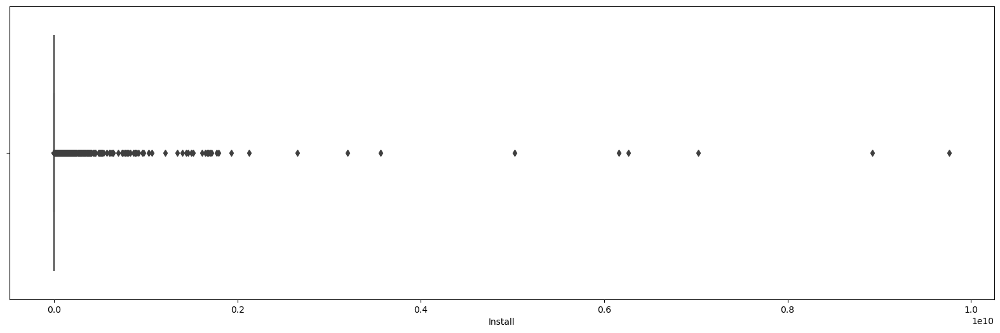

In [88]:
plt.figure(figsize=(20,6))
sns.boxplot(data=Permission, x='Install')

In [89]:
# Most of highest install apps are from Google
Prem = Permission.sort_values('Install',ascending=False)
# displays top 5 attributes
Prem.head()

,index,Unnamed: 0,App,App Id,Category,Rating,RatingCount,Install,Free,Price,...,Editors Choice,Main Category,Released_day,Released_month,Released_year,LU_day,LU_month,LU_year,App Age,Install Per Year
880577,881403,881403,YouTube,com.google.android.youtube,Video Players & Editors,4.40,"112,440,544.00",9766230924,1,0.00,...,0.00,Video Players & Editors,20,10,2010,16,6,2021,10.66,"915,897,812.76"
943377,944254,944254,Google Chrome: Fast & Secure,com.android.chrome,Communication,4.10,"31,481,796.00",8925640788,1,0.00,...,0.00,Communication,7,2,2012,14,6,2021,9.36,"953,426,657.19"
892844,893676,893676,Google Drive,com.google.android.apps.docs,Productivity,4.30,"639,307.00",7028265259,1,0.00,...,0.00,Productivity,27,4,2011,9,6,2021,10.15,"692,767,167.04"
385085,385470,385470,WhatsApp Messenger,com.whatsapp,Communication,4.00,"138,557,568.00",6265637751,1,0.00,...,1.00,Communication,18,10,2010,9,6,2021,10.67,"587,302,973.58"
167619,167781,167781,Google TV (previously Play Movies & TV),com.google.android.videos,Video Players & Editors,4.00,"1,825,673.00",6156518915,1,0.00,...,0.00,Video Players & Editors,3,6,2011,14,6,2021,10.04,"613,132,170.25"


In [90]:
# We took refernece for the preinstalled apps form the below link
# - https://en.wikipedia.org/wiki/List_of_most-downloaded_Google_Play_applications
pre_install =  pd.read_excel('Play Store Pre-installed apps.xlsx')

In [91]:
pre_install.head()

,App Name,Category,Pre-installed
0,Google Play Services,tools,yes
1,YouTube,video editor & social media,yes
2,Google Maps,mapping,yes
3,Google,search tool,yes
4,Google Text-to-Speech,accessibility tool,yes


In [92]:
pre_install_list = list(pre_install['App Name'])

In [93]:
# Develop a pattern for pre-installed app screening
pre_install_pat = '|'.join(pre_install_list)
pre_install_pat

'Google Play Services|YouTube|Google Maps|Google|Google Text-to-Speech|Gmail|Google Chrome|Facebook|Android Accessibility Suite|Google Drive|Google TV|Google Photos|Hangouts|Currents|Google Play Books|Google Play Games|Samsung Push Service|Android System WebView|Google Street View|Skype|Gboard|Google Duo|Google Cloud Print|Samsung Print Service Plugin|Samsung Internet Browser|Google Calendar|Microsoft Word|Samsung My Files|Samsung Gallery|Samsung One UI Home|Samsung Email|Samsung Voice Recorder|Device Care|Samsung Members|Samsung Health|Samsung Calculator|Messages|Samsung Experience Service|Netflix|Secure Folder|Google Play Services for AR|Samsung Notes'

In [94]:
# Eliminating apps in pre-installed list:
Permission = Permission.drop(Permission[Permission['App'].str.contains(pre_install_pat, case=False)].index)

In [95]:
# arranging the values in order
Permission.sort_values('Install',ascending=False).head()

,index,Unnamed: 0,App,App Id,Category,Rating,RatingCount,Install,Free,Price,...,Editors Choice,Main Category,Released_day,Released_month,Released_year,LU_day,LU_month,LU_year,App Age,Install Per Year
385085,385470,385470,WhatsApp Messenger,com.whatsapp,Communication,4.00,"138,557,568.00",6265637751,1,0.00,...,1.00,Communication,18,10,2010,9,6,2021,10.67,"587,302,973.58"
304526,304824,304824,Instagram,com.instagram.android,Social,3.80,"120,206,192.00",3559871277,1,0.00,...,1.00,Social,3,4,2012,14,6,2021,9.21,"386,597,148.50"
740840,741549,741549,Carrier Services,com.google.android.ims,Communication,4.30,"755,024.00",1793502218,1,0.00,...,0.00,Communication,13,3,2017,16,6,2021,4.26,"420,712,281.21"
786953,787700,787700,Subway Surfers,com.kiloo.subwaysurf,Arcade,4.60,"5,304,826.00",1704495994,1,0.00,...,1.00,Game,20,9,2012,10,6,2021,8.74,"194,967,420.18"
730797,731501,731501,SHAREit - Transfer & Share,com.lenovo.anyshare.gps,Tools,4.20,"16,023,749.00",1666016612,1,0.00,...,0.00,Tools,28,4,2013,15,6,2021,8.14,"204,677,234.39"


In [96]:
# Displays top 5 rows
Permission.head()

,index,Unnamed: 0,App,App Id,Category,Rating,RatingCount,Install,Free,Price,...,Editors Choice,Main Category,Released_day,Released_month,Released_year,LU_day,LU_month,LU_year,App Age,Install Per Year
0,0,0,Gakondo,com.ishakwe.gakondo,Adventure,0.00,0.00,15,1,0.00,...,0.00,Game,26,2,2020,26,2,2020,1.30,11.53
1,1,1,Ampere Battery Info,com.webserveis.batteryinfo,Tools,4.40,64.00,7662,1,0.00,...,0.00,Tools,21,5,2020,6,5,2021,1.07,"7,170.85"
2,2,2,Vibook,com.doantiepvien.crm,Productivity,0.00,0.00,58,1,0.00,...,0.00,Productivity,9,8,2019,19,8,2019,1.85,31.32
3,3,3,Smart City Trichy Public Service Vehicles 17UC...,cst.stJoseph.ug17ucs548,Communication,5.00,5.00,19,1,0.00,...,0.00,Communication,10,9,2018,13,10,2018,2.76,6.87
4,4,4,GROW.me,com.horodyski.grower,Tools,0.00,0.00,478,1,0.00,...,0.00,Tools,12,11,2018,12,11,2018,2.59,184.43


In [97]:
# Arranging order of columns
Permission = Permission[['App Id', 'App', 'Main Category', 'Category', 'Rating', 'RatingCount', 'Install', 'Free', 'Price', 'Size', 'Develop_Id', 'Released', 'Last_Updated',
 'Content Rating', 'Ad_Supported', 'In_App_Purchases', 'Editors_Choice', 'Released_day', 'Released_month', 'Released_year',
 'LU_day', 'LU_month', 'LU_year','App Age',	'Install Per Year']]

In [98]:
# using to_csv we are saving the file
Permission.to_csv('Permission_cleaned.csv', index=False)

### C. EXPLORATORY DATA ANALYSIS

### Number of apps on app category

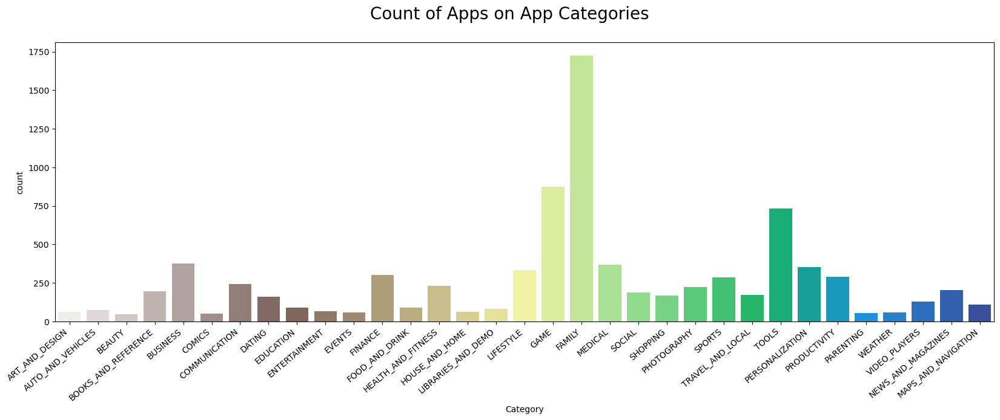

In [99]:
# using inbuilt "figure" method of the plot to set figure size
plt.figure(figsize=(20,6))
#title of the plot
plt.suptitle('Count of Apps on App Categories',fontsize = 20)
# ,palette=['#432371',"#FAAE7B","#7fcdbb","#edf8b1","#fc9272","#fee0d2","#bcbddc", "#efedf5"]
#defining color
sns.color_palette("terrain_r", 10)
#counter plot with in the library seaborn
ax = sns.countplot(data=google_apps, x='Category', palette="terrain_r")
#rotating the labels so that they dont appear clumsy
ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right")
# show method to output the plot
plt.show()

In [100]:
# taking sum from the google apps data for grouping by category and then reset the index using "reset_index"
google_apps_sum = google_apps.groupby('Category').sum().reset_index()
# taking mean from the google apps data for grouping by category and then reset the index using "reset_index"
google_apps_mean = google_apps.groupby('Category').mean().reset_index()
# using describe to get statistical summary of the data (for numeric attribute)
google_apps.describe()

,Rating,Reviews,Size,Installs,Price
count,"8,432.00","8,432.00","8,432.00","8,432.00","8,432.00"
mean,4.18,"120,655.32","20,395,289.31","3,724,212.23",1.23
std,0.51,"936,344.95","21,827,542.44","24,829,397.64",18.03
min,1.00,0.00,"8,500.00",0.00,0.00
25%,4.00,17.00,"4,600,000.00","1,000.00",0.00
50%,4.30,475.50,"12,000,000.00","50,000.00",0.00
75%,4.50,"15,667.25","28,000,000.00","1,000,000.00",0.00
max,5.00,"44,891,723.00","100,000,000.00","1,000,000,000.00",400.00


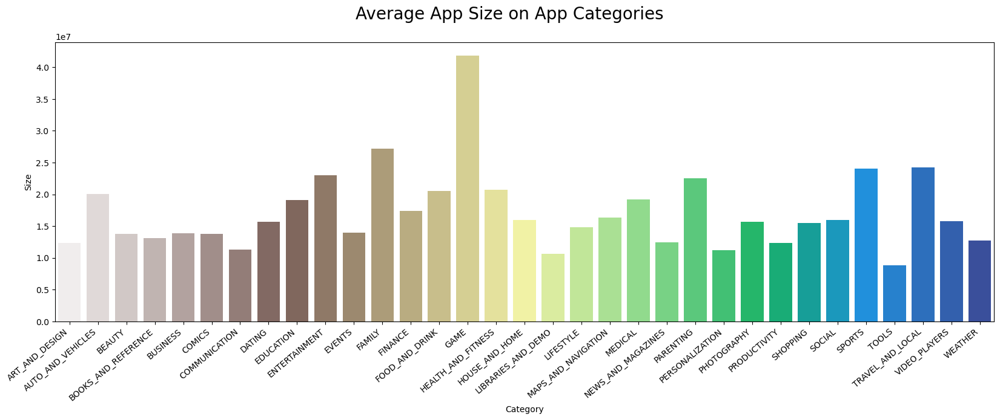

In [101]:
# using inbuilt "figure" method of the plot to set figure size
plt.figure(figsize=(20,6))
#title of the plot
plt.suptitle('Average App Size on App Categories',fontsize = 20)
#defining color palette
sns.color_palette("terrain_r", 10)
#using counter plot with in the library seaborn
ax = sns.barplot(data=google_apps_mean, x='Category', y='Size' ,palette="terrain_r")
#rotating the labels so that they dont appear clumsy
ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right")
# show method to output the plot
plt.show()

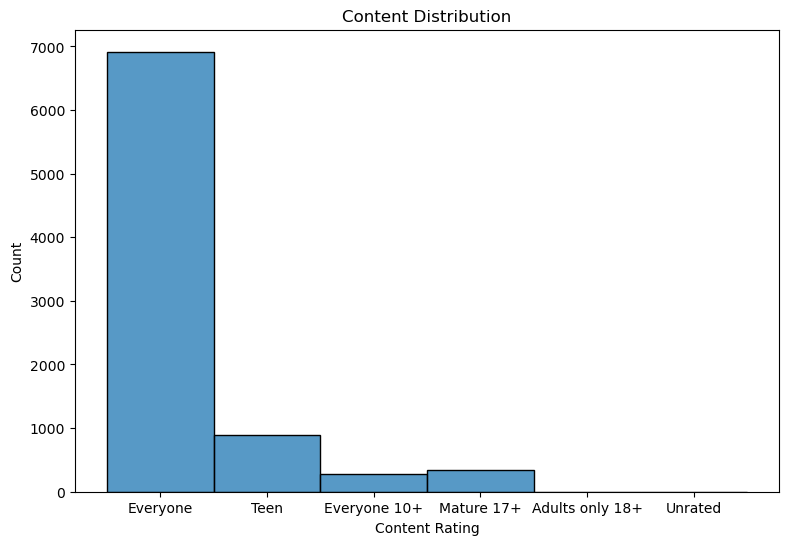

In [102]:
# using inbuilt "figure" method of the plot to set figure size
plt.figure(figsize=(20,6))
# subplot is used to generate m*n grid with axes in specified location p
plt.subplot(122)
#defining color palette
sns.color_palette("terrain_r", 10)
#using hisplot to generate the plot 
sns.histplot(data=google_apps, x='Content Rating',palette="terrain_r")
#title of the plot
plt.title('Content Distribution')
#showing the generated plot using show method
plt.show()

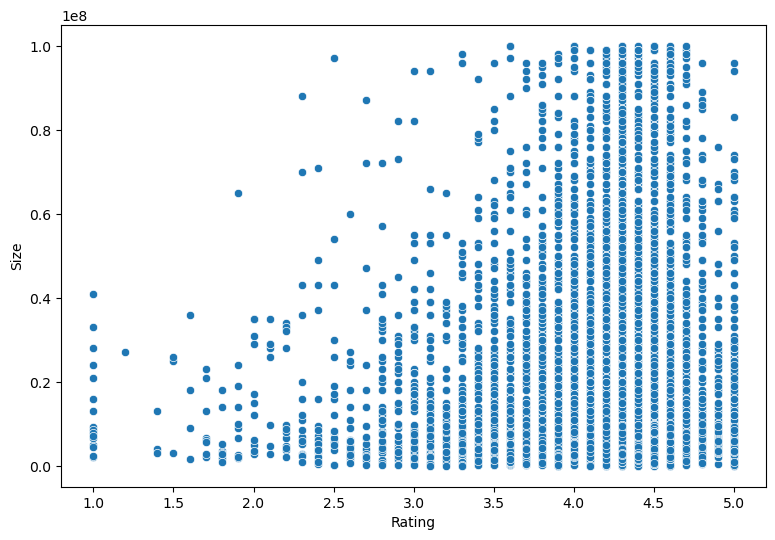

In [103]:
# using inbuilt "figure" method of the plot to set figure size
plt.figure(figsize=(20,6))
# setting y limit
plt.ylim(0,3000000000)
# subplot is used to generate m*n grid with axes in specified location p
plt.subplot(122)
#define color palette
sns.color_palette("terrain_r", 10)
# generating scatterplot
sns.scatterplot(data = google_apps, x= 'Rating', y='Size' ,palette="terrain_r" )
# displaying the plot
plt.show()

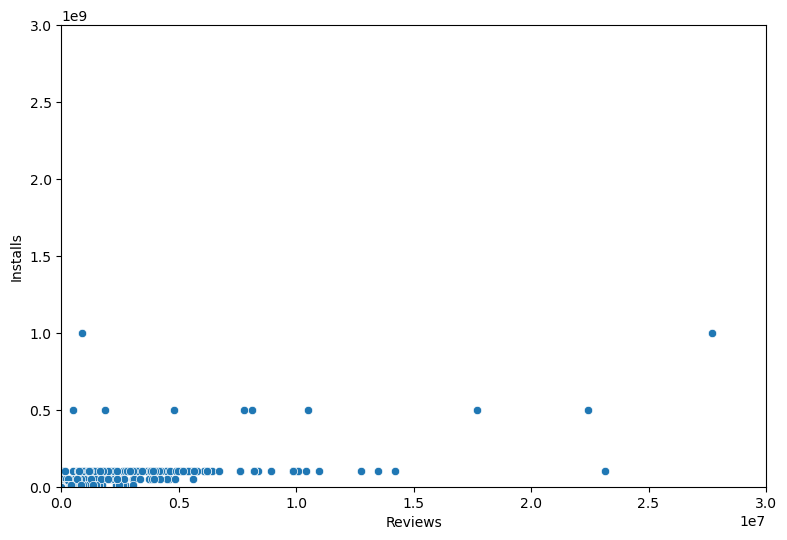

In [104]:
# using inbuilt "figure" method of the plot to set figure size
plt.figure(figsize=(20,6))
# subplot is used to generate m*n grid with axes in specified location p
plt.subplot(121)
# generatign a scatterplot
sns.scatterplot(data = google_apps, x= 'Reviews', y='Installs')
# set x axis limit
plt.xlim(0,30000000)
# set y axis lmit
plt.ylim(0,3000000000)
# display the plot
plt.show()

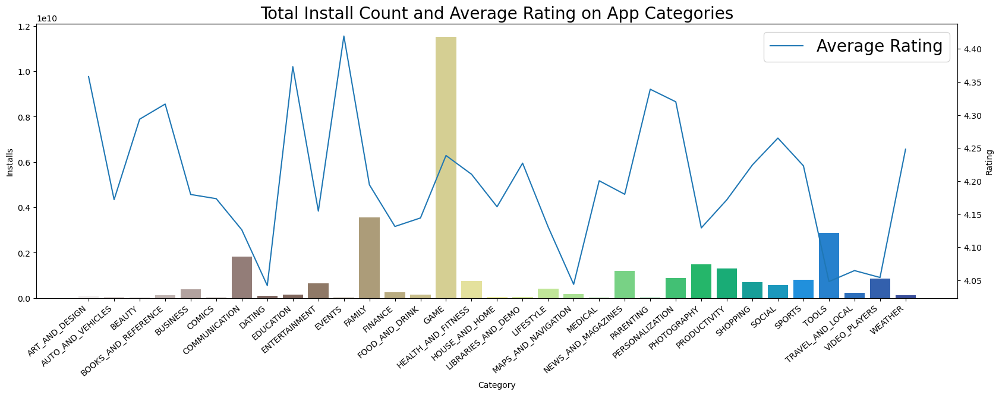

In [105]:
# using inbuilt "figure" method of the plot to set figure size
plt.figure(figsize=(20,6))
#title of the plot
plt.title('Total Install Count and Average Rating on App Categories',fontsize = 20)
# define color palette
sns.color_palette("terrain_r", 10)
# generating barplot
ax = sns.barplot(data=google_apps_sum, x='Category', y='Installs',palette="terrain_r")
# rotating the lables on x axis so that it doesn't appear clumsy
ax.set_xticklabels(ax.get_xticklabels(), rotation=40, ha="right")
# using twinx to display plot on top of another plot
plt.twinx()
# generating the lineplot 
sns.lineplot(data=google_apps_mean, x='Category', y='Rating')
# defining/labeling legend 
plt.legend(labels=['Average Rating'],fontsize = 20)


`Conclusion:` 
+ The age of the game doesn't impact its Installation. So the success of a game doesn't depend on its age but on the quality of the game.
`Conclusion:` 
Size app within 200MB is the best size for customer download

### MERGE DATASET

In [106]:
# merging of google apps and userreviews
apps_reviews = pd.merge(google_apps,userreviews)
apps_reviews

,App,Category,Rating,Reviews,Size,Installs,Type,Price,Content Rating,Genres,Last Updated,Current Ver,Android Ver,Translated_Review,Sentiment,Sentiment_Polarity,Sentiment_Subjectivity
0,Coloring book moana,ART_AND_DESIGN,3.90,967.00,"14,000,000.00",500000,Free,0.00,Everyone,Art & Design;Pretend Play,"January 15, 2018",2.0.0,4.0.3 and up,A kid's excessive ads. The types ads allowed a...,Negative,-0.25,1.00
1,Coloring book moana,ART_AND_DESIGN,3.90,967.00,"14,000,000.00",500000,Free,0.00,Everyone,Art & Design;Pretend Play,"January 15, 2018",2.0.0,4.0.3 and up,It bad >:(,Negative,-0.72,0.83
2,Coloring book moana,ART_AND_DESIGN,3.90,967.00,"14,000,000.00",500000,Free,0.00,Everyone,Art & Design;Pretend Play,"January 15, 2018",2.0.0,4.0.3 and up,like,Neutral,0.00,0.00
3,Coloring book moana,ART_AND_DESIGN,3.90,967.00,"14,000,000.00",500000,Free,0.00,Everyone,Art & Design;Pretend Play,"January 15, 2018",2.0.0,4.0.3 and up,I love colors inspyering,Positive,0.50,0.60
4,Coloring book moana,ART_AND_DESIGN,3.90,967.00,"14,000,000.00",500000,Free,0.00,Everyone,Art & Design;Pretend Play,"January 15, 2018",2.0.0,4.0.3 and up,I hate,Negative,-0.80,0.90
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
19312,Avakin Life - 3D virtual world,FAMILY,4.40,"1,275,373.00","91,000,000.00",10000000,Free,0.00,Teen,Role Playing,"July 3, 2018",1.021.10,4.1 and up,This turned better I expected tbh I'm glad. I'...,Positive,0.33,0.71
19313,Avakin Life - 3D virtual world,FAMILY,4.40,"1,275,373.00","91,000,000.00",10000000,Free,0.00,Teen,Role Playing,"July 3, 2018",1.021.10,4.1 and up,I like apartments n stuffs minus players Many ...,Negative,-0.18,0.51
19314,Avakin Life - 3D virtual world,FAMILY,4.40,"1,275,373.00","91,000,000.00",10000000,Free,0.00,Teen,Role Playing,"July 3, 2018",1.021.10,4.1 and up,Hey I've playing year half last year I took 2 ...,Positive,0.00,0.39
19315,Avakin Life - 3D virtual world,FAMILY,4.40,"1,275,373.00","91,000,000.00",10000000,Free,0.00,Teen,Role Playing,"July 3, 2018",1.021.10,4.1 and up,"Annoying loading. It stopped 80 percent, data ...",Negative,-0.28,0.72


# Sentiment Analysis

### Do Free or Paid App tends to receive more positive or negative feedback?

In [107]:

y_actual = pd.Series(apps_reviews['Type'], name='Type')
y_predicted = pd.Series(apps_reviews['Sentiment'], name='Sentiment')

#create confusion matrix
print(pd.crosstab(y_actual, y_predicted))

Sentiment  Negative  Neutral  Positive
Type                                  
Free           4075     2754     12185
Paid             50       24       229


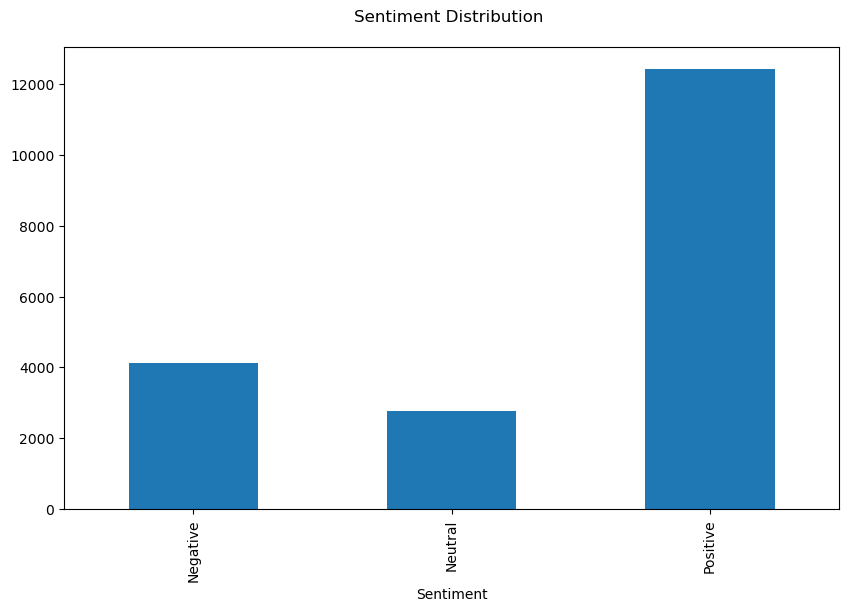

In [108]:
# using inbuilt "figure" method of the plot to set figure size
plt.figure(figsize=(10,6))
# grouping the apps_reviews based in sentiment and taking count of apps and generating a plot bar
apps_reviews.groupby('Sentiment').App.count().plot(kind='bar')
# title of the bar plot
plt.title('Sentiment Distribution \n')
# display the plot
plt.show()

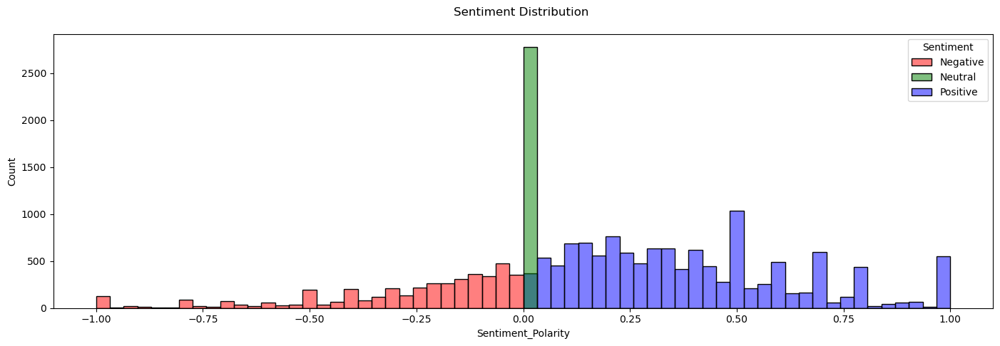

In [109]:
# using inbuilt "figure" method of the plot to set figure size
plt.figure(figsize=(17,5))
# title of the plot
plt.title('Sentiment Distribution \n')
# generating the histogram using histplot
sns.histplot(data=apps_reviews,
             x='Sentiment_Polarity',
             hue='Sentiment', palette=['red','green', 'blue'])
#display the plot
plt.show()

<Figure size 2500x600 with 0 Axes>

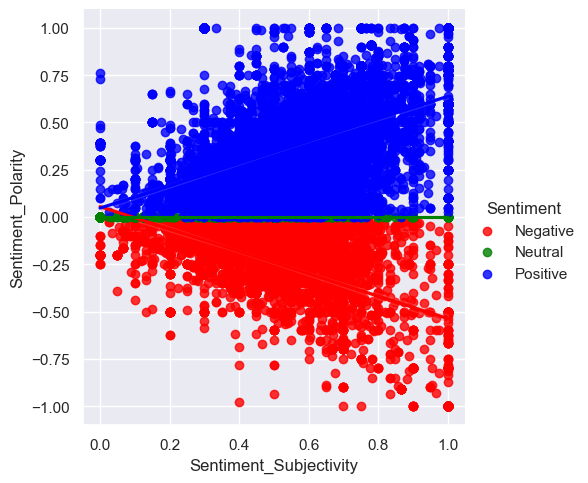

In [110]:
# using inbuilt "figure" method of the plot to set figure size
plt.figure(figsize=(25,6))
# plt.subplot(131)
# defining the theme to darkgrid
sns.set_theme(style='darkgrid')
# using implot - to draw a scatter plot onto a FacetGrid
sns.lmplot(data=apps_reviews, x='Sentiment_Subjectivity', y ='Sentiment_Polarity', hue='Sentiment',palette=['red','green', 'blue'])
# display plot
plt.show()

In [111]:
# grouping based on "Category" then taking mean and sorting using reviews from high to low
gkk = google_apps.groupby(['Category','App','Installs','Rating','Reviews']).mean().sort_values(by='Reviews',ascending=False)
gkk[:5]

Size  \
Category      App                                         Installs   Rating Reviews                       
GAME          Clash of Clans                              100000000  4.60   44,891,723.00 98,000,000.00   
              Subway Surfers                              1000000000 4.50   27,722,264.00 76,000,000.00   
              Clash Royale                                100000000  4.60   23,133,508.00 97,000,000.00   
              Candy Crush Saga                            500000000  4.40   22,426,677.00 74,000,000.00   
COMMUNICATION UC Browser - Fast Download Private & Secure 500000000  4.50   17,712,922.00 40,000,000.00   

                                                                                           Price  
Category      App                                         Installs   Rating Reviews               
GAME          Clash of Clans                              100000000  4.60   44,891,723.00   0.00  
              Subway Surfers                              1000000000 4.50   27,722,264.00   0.00  
              Clash Royale                                100000000  4.60   23,133,508.00   0.00  
              Candy Crush Saga                            500000000  4.40   22,426,677.00   0.00  
COMMUNICATION UC Browser - Fast Download Private & Secure 500000000  4.50   17,712,922.00   0.00

## Count of 5 star Rating Apps

In [112]:
# filtering data with rating equal to 5 or more
star5_appcount = google_apps[google_apps['Rating']>=5]
# displaying count
star5_appcount['App'].count()

266

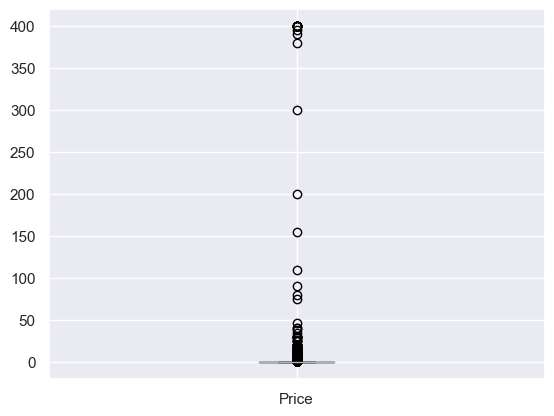

In [113]:
# generating boxplot for the price
google_apps.boxplot(['Price'])
# display the plot
plt.show()

In [114]:
# filtering the data with reviews < 1000000
Reviewscount=google_apps[google_apps['Reviews']<1000000]
# displaying the count
Reviewscount['Reviews'].count()

8253

In [115]:
# droping the rows with 'Adult only 18+' and 'unrated'
google_apps.drop(google_apps[google_apps['Content Rating']=='Adults only 18+'].index,axis=0,inplace=True)
google_apps.drop(google_apps[google_apps['Content Rating']=='Unrated'].index,axis=0,inplace=True)

In [116]:
# taking values after droping rows
google_apps['Content Rating'].value_counts()

Everyone        6917
Teen             898
Mature 17+       340
Everyone 10+     273
Name: Content Rating, dtype: int64

### Effect of the Price on Ratings

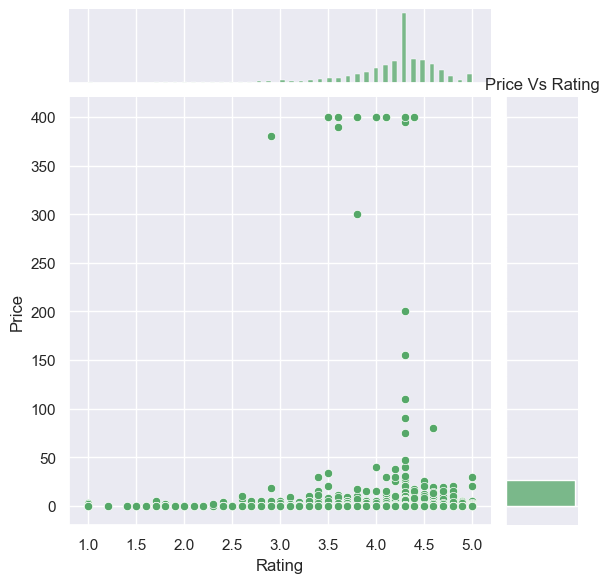

In [117]:
#generating a join plot
g=sns.jointplot(x='Rating',y='Price',data=google_apps, color='g')
#title of the plot
plt.title("Price Vs Rating")
#display the plot
plt.show()

We can see that the Rating is high between 3 to 5 and the price is mostly between 0 to 50 dollars. So we can say that the as the price increases the use base always decreases as more and more apps which are being loved by the users are between 0 to 50 dollars.

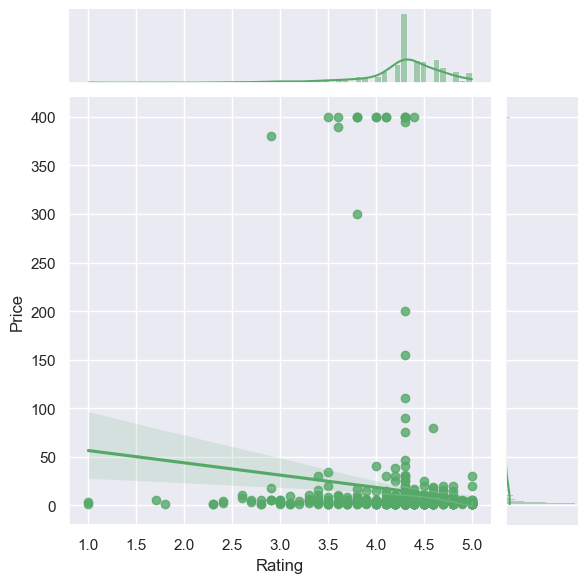

In [118]:
# filtering with apps price > 0
new_replot=google_apps[google_apps['Price']>0]
# generating a joint plot
sns.jointplot(x='Rating',y='Price',data=new_replot,kind='reg',color='g')
# display of the plot
plt.show()

Replotting the data after limiting the data having price less than 50 The pattern remains the 
same as the low priced applications are being more chances as well as Ratings. 
The effect of Price on the Rating is such as increase in Price will decrease the chances of it
being used it more by the users and the Rating will also be affected.

### Pairplot for Reviews, Size , Rating and Price

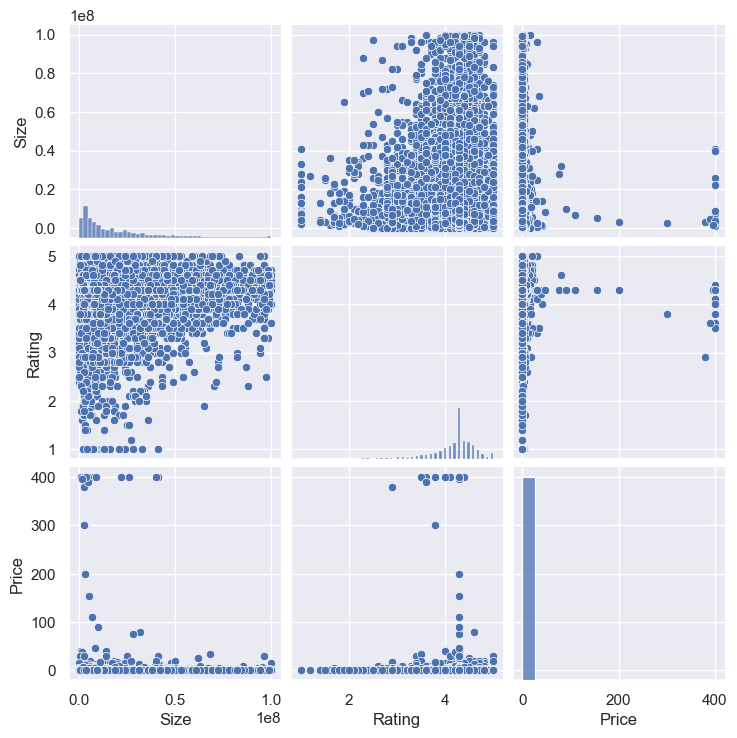

In [119]:
# Generating pair plot for 'Size','Rating','Price'
sns.pairplot(google_apps,vars=['Size','Rating','Price'])
# dsiplay plot
plt.show()

In [120]:
# grouping by content rating and then taking median
newcontent=google_apps.groupby(['Content Rating']).median()
newcontent['Content Rating'] = newcontent.index
newcontent

,Rating,Reviews,Size,Installs,Price,Content Rating
Content Rating,,,,,,
Everyone,4.30,285.00,"10,000,000.00","10,000.00",0.00,Everyone
Everyone 10+,4.30,"13,169.00","31,000,000.00","500,000.00",0.00,Everyone 10+
Mature 17+,4.25,"2,305.50","16,000,000.00","100,000.00",0.00,Mature 17+
Teen,4.30,"5,355.00","21,000,000.00","100,000.00",0.00,Teen


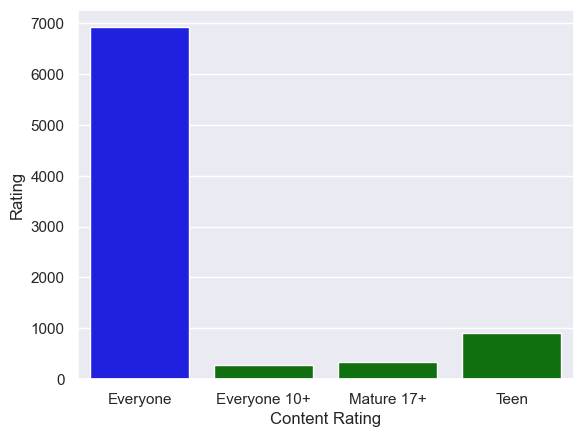

In [121]:
# grouping by content rating and then taking count
newcontent_count=google_apps.groupby(['Content Rating']).count()
# setting index
newcontent_count['Content Rating'] = newcontent_count.index
# Setting color condition to high light highest value
clrs = ['green' if (x < max(newcontent_count['App'])) else 'blue' for x in newcontent_count['App'] ]
# generate bar plot
sns.barplot('Content Rating','Rating',data=newcontent_count, palette=clrs)
# display plot
plt.show()

### Size Distribution Plot

[]

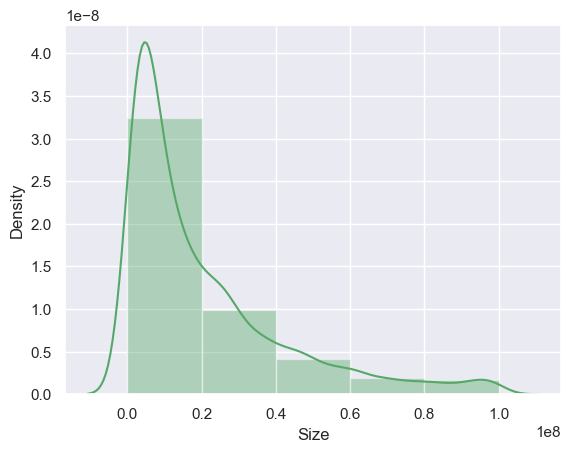

In [122]:
# generating distribution plot 
a=sns.distplot(google_apps['Size'],bins=5,color='g')
# display the plot
plt.plot()

# Content rating categorization VS No.of Ratings

In [123]:
# grouping by content rating and then taking median
newcontent=google_apps.groupby(['Content Rating']).median()
# setting index
newcontent['Content Rating'] = newcontent.index
newcontent

,Rating,Reviews,Size,Installs,Price,Content Rating
Content Rating,,,,,,
Everyone,4.30,285.00,"10,000,000.00","10,000.00",0.00,Everyone
Everyone 10+,4.30,"13,169.00","31,000,000.00","500,000.00",0.00,Everyone 10+
Mature 17+,4.25,"2,305.50","16,000,000.00","100,000.00",0.00,Mature 17+
Teen,4.30,"5,355.00","21,000,000.00","100,000.00",0.00,Teen


# Questions

# Question-Which Category app's have more Installs

In [124]:
# group by category with sum of installations sorted by Installs
topInstalls = google_apps.groupby('Category')[['Installs']].sum().sort_values(by= 'Installs', ascending=False)
# displays top 20
topInstalls[:20]

,Installs
Category,
GAME,11532464253
FAMILY,3552970925
TOOLS,2881044815
COMMUNICATION,1817943051
PHOTOGRAPHY,1493897655
PRODUCTIVITY,1296312744
NEWS_AND_MAGAZINES,1191005650
PERSONALIZATION,895179772
VIDEO_PLAYERS,866767720


### Which apps are the top ten most installed in each category

In [125]:
# function to plot bar for top 10 in category
def findtop10incategory(str):
    str = str.upper()
    top10 = google_apps[google_apps['Category'] == str]
    # sort by installation and display top 10
    top10apps = top10.sort_values(by='Installs', ascending=False).head(10)
    # using figure method setting size of the image
    plt.figure(figsize=(13,10))
    # title of the project
    plt.title('Top 10 Installed Apps',size = 15);  
    # setting color palette
    sns.color_palette("terrain_r", 10)
    # generate barplot
#ax = sns.countplot(data=google_apps, x='Category', palette="terrain_r")
    plot = sns.barplot(x = top10apps.App, y = top10apps.Installs,palette="terrain_r" )
    # rotating x labels to make them visible better
    plot.set_xticklabels(plot.get_xticklabels(), rotation= 45, horizontalalignment='right');

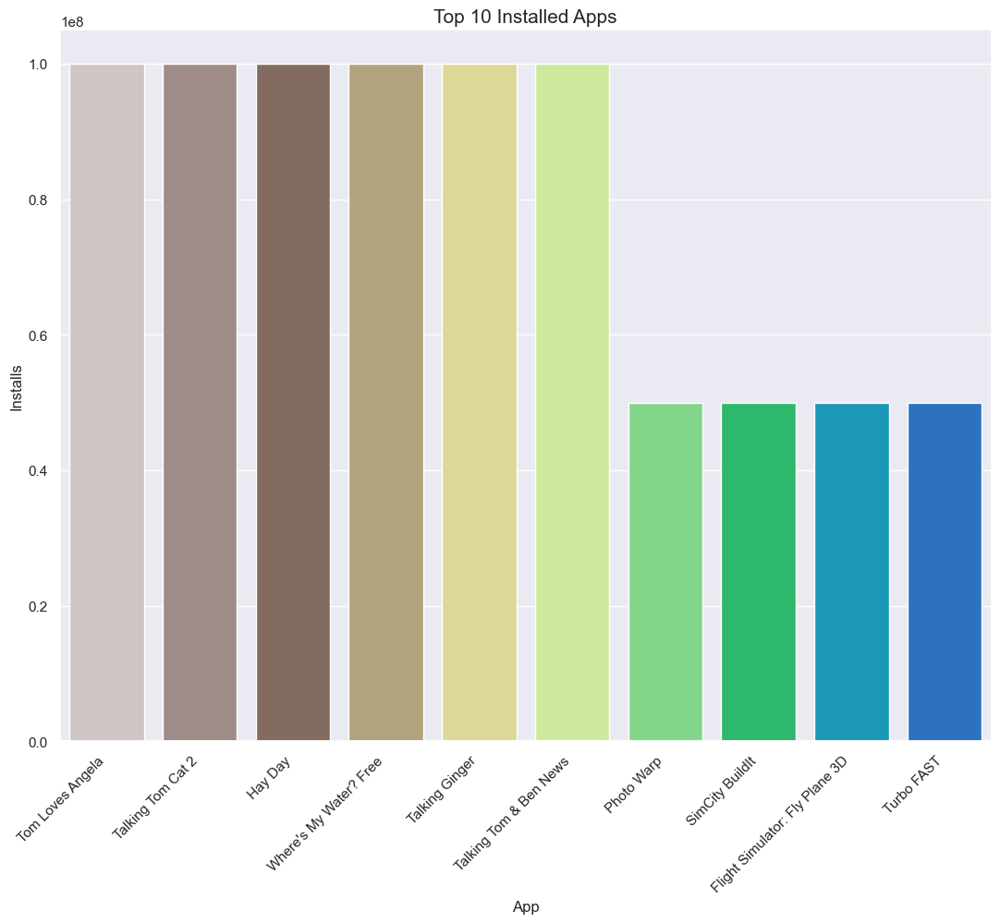

In [126]:
# function call with "category" as input or parameter
findtop10incategory('FAMILY')

# Question-In what extent are price, rating, reviews, category, and other key factors affecting the success rate of an app?

In [127]:
# pivoting the data with category as index by taking mean of price, rating ,reviews
app_sucess = google_apps.pivot_table(['Rating','App','Reviews','Price'], index=['Category'],aggfunc='mean')
# sorting values based on Rating
app_sucess = app_sucess.sort_values(by='Rating', ascending=False)
# display top 30
app_sucess[:30]
#Even though the price is high, the rating is less for few of categories.

,Price,Rating,Reviews
Category,,,
EVENTS,1.93,4.42,"2,221.91"
EDUCATION,0.20,4.37,"46,898.29"
ART_AND_DESIGN,0.10,4.36,"17,537.79"
PARENTING,0.09,4.34,"16,383.33"
PERSONALIZATION,0.40,4.32,"79,968.16"
BOOKS_AND_REFERENCE,0.60,4.32,"16,819.07"
BEAUTY,0.00,4.29,"3,975.66"
SOCIAL,0.08,4.27,"108,677.31"
WEATHER,0.42,4.25,"66,191.43"


In [128]:
#sucessrate_app = google_apps[(data['gender']=="F") & (data['genres']=="Drama")]
# Gorup by category - taking mean of rating
sucessrate_app = google_apps.groupby(["Category","Reviews","Price"])["Rating"].mean()
# sorting the values
sucessrate_app = sucessrate_app.sort_values(ascending=False)
# display top 30
sucessrate_app[:30]

Category             Reviews  Price
BOOKS_AND_REFERENCE  12.00    3.99    5.00
FAMILY               1.00     19.99   5.00
LIFESTYLE            1.00     3.04    5.00
PRODUCTIVITY         2.00     0.99    5.00
HEALTH_AND_FITNESS   18.00    0.00    5.00
SHOPPING             9.00     0.00    5.00
FAMILY               12.00    1.99    5.00
SHOPPING             21.00    0.00    5.00
PERSONALIZATION      13.00    1.49    5.00
FAMILY               1.00     29.99   5.00
PERSONALIZATION      4.00     0.99    5.00
FAMILY               1.00     4.99    5.00
LIFESTYLE            12.00    0.99    5.00
SPORTS               36.00    0.00    5.00
NEWS_AND_MAGAZINES   22.00    0.00    5.00
                     43.00    0.00    5.00
LIFESTYLE            103.00   0.00    5.00
PARENTING            1.00     0.00    5.00
SOCIAL               20.00    0.00    5.00
                     30.00    0.00    5.00
GAME                 2.00     0.99    5.00
                              1.49    5.00
LIFESTYLE         

In [129]:
# group by category and take rating means
topsucessrate_app = google_apps.groupby(["Category","App","Reviews","Price"])["Rating"].mean()
# sorting the values
topsucessrate_app = topsucessrate_app.sort_values(ascending=False)
# display top 10
topsucessrate_app[:10]

Category            App                                          Reviews  Price
GAME                Flippy Axe : Flip The Knife & Axe Simulator  7.00     0.00    5.00
COMMUNICATION       BS-Mobile                                    1.00     0.00    5.00
FAMILY              EP Radio                                     3.00     0.00    5.00
LIFESTYLE           Barbers.BH                                   2.00     0.00    5.00
HEALTH_AND_FITNESS  EF Academy                                   4.00     0.00    5.00
PRODUCTIVITY        ER Assist                                    3.00     0.00    5.00
FAMILY              Foothills CP                                 4.00     0.00    5.00
LIFESTYLE           Unity CF                                     5.00     0.00    5.00
MEDICAL             Kimbrough AH                                 5.00     0.00    5.00
GAME                Monster Ride Pro                             1.00     0.00    5.00
Name: Rating, dtype: float64

# Question-Which Apps have the most reviews?

In [130]:
# pivot table with app as index and by taking mean of reviews
highestreviews_app = google_apps.pivot_table('Reviews', index=['App'],aggfunc='mean')
# sort values by reviews
highestreviews_app = highestreviews_app.sort_values(by ='Reviews',ascending=False)
highestreviews_app                                                                                    

,Reviews
App,
Clash of Clans,"44,891,723.00"
Subway Surfers,"27,722,264.00"
Clash Royale,"23,133,508.00"
Candy Crush Saga,"22,426,677.00"
UC Browser - Fast Download Private & Secure,"17,712,922.00"
...,...
Visualmed,0.00
Bacterial Vaginosis Treatment,0.00
Bacterial Vaginosis Symptoms & Treatment,0.00


# Question:How do the app ratings differ between paid and free apps in general?

In [131]:
google_apps_rating = google_apps.loc[:,['Rating', 'Type', 'Category']]
google_apps_rating

,Rating,Type,Category
0,4.10,Free,ART_AND_DESIGN
1,3.90,Free,ART_AND_DESIGN
2,4.70,Free,ART_AND_DESIGN
3,4.50,Free,ART_AND_DESIGN
4,4.30,Free,ART_AND_DESIGN
...,...,...,...
10835,4.30,Free,BUSINESS
10836,4.50,Free,FAMILY
10837,5.00,Free,FAMILY
10838,4.30,Free,MEDICAL


In [132]:
# function to display histogram plot
def plot_hist(google_apps, col, bins=10):

    
    plt.hist(google_apps[col], bins=bins,color = "skyblue")
    plt.xlabel(col)
    plt.ylabel('counts')
    plt.title('Distribution of {}'.format(col))
    
# function to get the sum of free and paid
def compute_app_types(google_apps):

    return sum(google_apps.Type == "Free"), sum(google_apps.Type == 'Paid')
# function to generate polt for app types wrt category
def plot_app_types(google_apps):

    vc_rating = google_apps.Category.value_counts()
    cat_free_apps = []
    cat_paid_apps = []
    for cat in vc_rating.index:
        n_free, n_paid = compute_app_types(google_apps.query("Category == '{}'".format(cat)))
        cat_free_apps.append(n_free)
        cat_paid_apps.append(n_paid)

    f, ax = plt.subplots(2,1)
    ax[0].bar(range(1, len(cat_free_apps)+1), cat_free_apps)
    ax[1].bar(range(1, len(cat_free_apps)+1), cat_paid_apps)

# function to drop categories with less than 10 instaces    
def drop_categories(google_apps):

    vc_rating = google_apps.Category.value_counts()
    cats_to_drop = []
    for cat in vc_rating.index:
        n_free, n_paid = compute_app_types(google_apps.query("Category == '{}'".format(cat)))
        if n_free < 10 or n_paid < 10:
            cats_to_drop.append(cat)
    for cat in cats_to_drop:
        google_apps.drop(google_apps.query('Category == "{}"'.format(cat)).index, axis=0, inplace=True)
    print("Deleted categories: {}".format(cats_to_drop))
    return google_apps

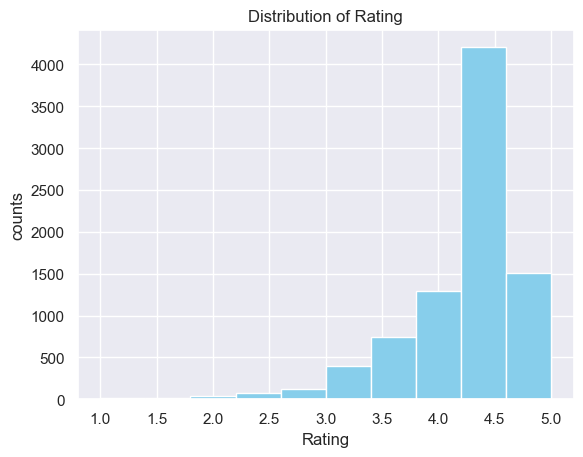

In [133]:
# Histogram to dispaly rate disbution using the fucntion build above
plot_hist(google_apps_rating, 'Rating')

In [134]:
# using describe to get statistical summary
google_apps_rating.describe()

,Rating
count,"8,428.00"
mean,4.18
std,0.51
min,1.00
25%,4.00
50%,4.30
75%,4.50
max,5.00


In [135]:
# display number of paid apps vs free apps
print("Free_Apps:{}\nPaid_Apps:{} ".format(*compute_app_types(google_apps_rating)))

Free_Apps:7743
Paid_Apps:685 


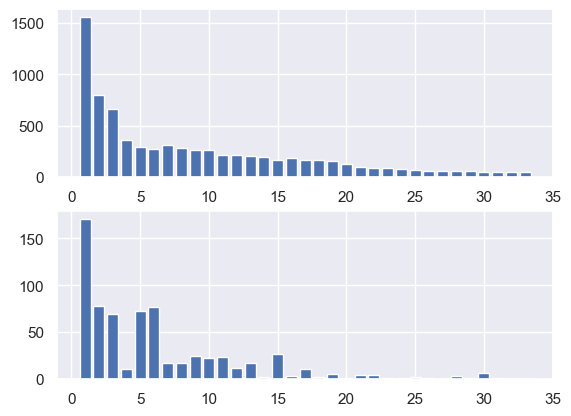

In [136]:
#  distributions of free and paid apps
plot_app_types(google_apps_rating)

In [137]:
# function to generate bar plot for target attribute with mean
def plot_target_by_group(google_apps, target_col, group_col, figsize=(6,4), title=""):
  
    order = sorted(list(set(google_apps[group_col])))
    stats = google_apps.groupby(group_col).mean()[target_col]
    fig, ax = plt.subplots(figsize=figsize)
    sns.color_palette("terrain_r", 10)
    sns.barplot(x=group_col, y=target_col, data=google_apps, ax=ax, order=order,palette="terrain_r").set_title(title)
    ax.set(ylim=(3.8, 4.5))
    plt.xticks(rotation=90)
    return stats

Free app has average Rating 4.177347281415472
Paid app has average Rating 4.2562043795620434
Mean rating: 4.183756525866133


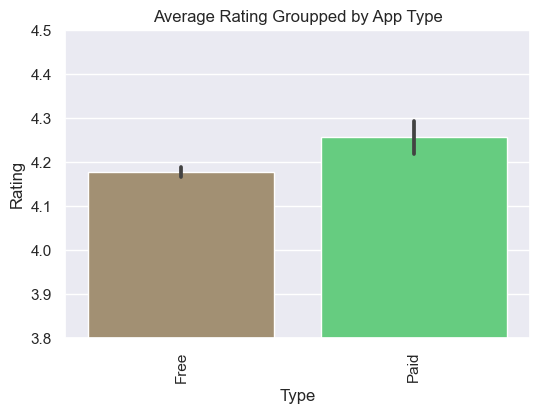

In [138]:
# using the function created above generated a bar plot between paid and free
stats = plot_target_by_group(google_apps_rating, 'Rating', 'Type', title="Average Rating Groupped by App Type")
for i, s in zip(stats.index, stats):
    print("{} app has average {} {}".format(i, 'Rating',s))
mean_rating = google_apps_rating.Rating.mean()
# display mean
print("Mean rating: {}".format(mean_rating))

### Interpretation
In general, Free apps, with an average rating of 4.17, are lower rated than Paid apps with an average rating of 4.25. Note that the average rating for all apps is 4.18, so Free apps are rated below average, while Paid apps are rated reletively higher than the average score.

----------> In general, Paid apps are better-rated than free apps, which appears to support the argument that service quility of the paid apps is better.

# Question:How are the differences distributed across different app categories?

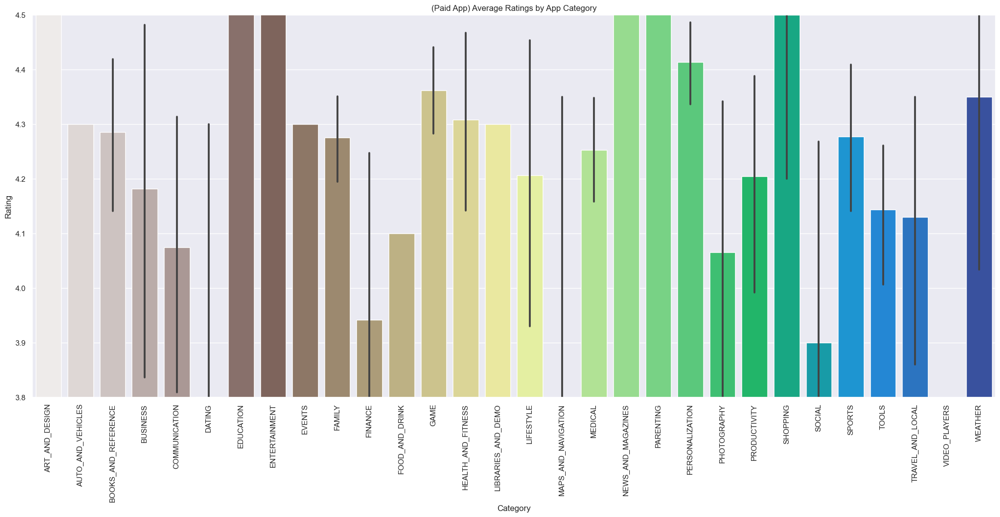

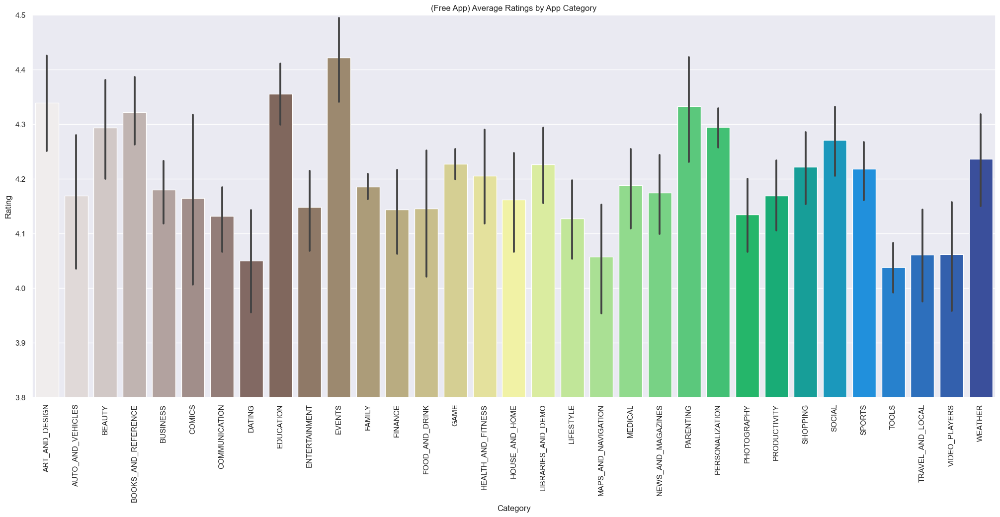

In [139]:
# generated bar plot by using the function built above

paid_apps = plot_target_by_group(google_apps_rating.query('Type == "Paid"'), 'Rating', 'Category', (25, 10), "(Paid App) Average Ratings by App Category")

free_apps = plot_target_by_group(google_apps_rating.query('Type == "Free"'), 'Rating', 'Category', (25, 10), "(Free App) Average Ratings by App Category")

Category
ART_AND_DESIGN         0.39
AUTO_AND_VEHICLES      0.13
BOOKS_AND_REFERENCE   -0.04
BUSINESS               0.00
COMMUNICATION         -0.06
DATING                -0.25
EDUCATION              0.39
ENTERTAINMENT          0.45
EVENTS                -0.12
FAMILY                 0.09
FINANCE               -0.20
FOOD_AND_DRINK        -0.04
GAME                   0.13
HEALTH_AND_FITNESS     0.10
LIBRARIES_AND_DEMO     0.07
LIFESTYLE              0.08
MAPS_AND_NAVIGATION   -0.36
MEDICAL                0.06
NEWS_AND_MAGAZINES     0.63
PARENTING              0.37
PERSONALIZATION        0.12
PHOTOGRAPHY           -0.07
PRODUCTIVITY           0.04
SHOPPING               0.28
SOCIAL                -0.37
SPORTS                 0.06
TOOLS                  0.11
TRAVEL_AND_LOCAL       0.07
VIDEO_PLAYERS         -0.96
WEATHER                0.11
Name: Rating, dtype: float64

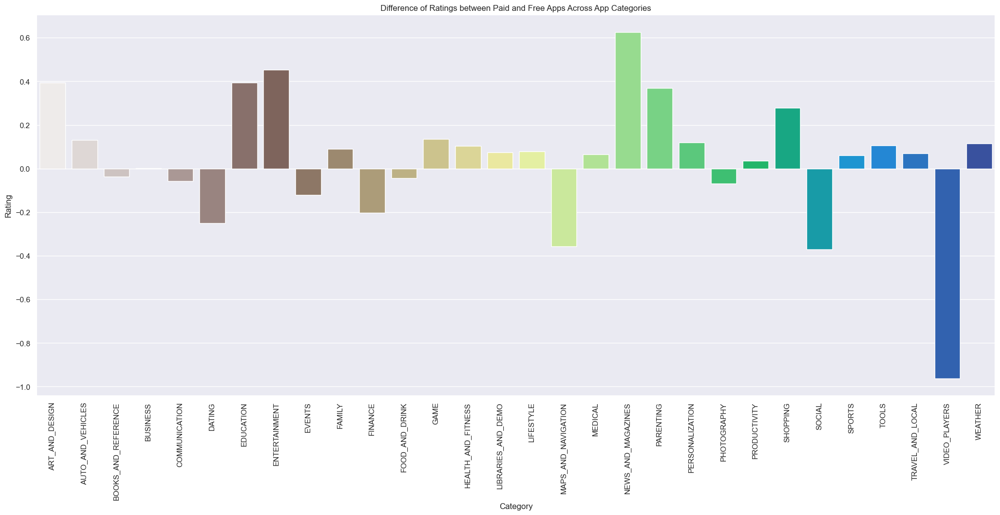

In [140]:
fig, ax = plt.subplots(figsize=(25,10))
sorted_idx = sorted(paid_apps.index)
rating_diff = paid_apps[sorted_idx] - free_apps[sorted_idx]
# defing the color palette
sns.color_palette("terrain_r", 10)
# generating bar plot
sns.barplot(x=sorted_idx, y=rating_diff, ax=ax, palette="terrain_r").set_title("Difference of Ratings between Paid and Free Apps Across App Categories");
# Rotating x axis labels for better visibility
plt.xticks(rotation=90)
# x label
plt.xlabel('Category')
rating_diff

### Interpretation
Although paid apps are in general more highly-rated than free apps, and so are in most app categories, there are still some app categories where free apps are likely to be favored more than the paid apps. For instance, BOOKS_AND_REFERENCE,COMMUNICATION, FINANCE and PHOTOGRAPHY are four such categories. In FINANCE category, the free apps on average are rated almost 0.2 higher than the paid apps, which is also the largest difference between app types across all the categories.

---------->In most categories, Paid apps achieve higher ratings than free apps, however, in a few categories such as COMMUNICATION, FINANCE and PHOTOGRAPHY, the average ratings of free apps are higher than those of paid apps. Is this because many popular apps in these categories are free, like facebook and whatsapp in the COMMUNICATION category

# Question- What are the top 25 Apps on the play store that have been downloaded the most times?

In [141]:
# give repeated apps or total count of apps
apps = dict(google_apps.App.value_counts())

# using apps dictonary making a new dictionary
apps_dataframe = {
    'App':list(apps.keys()),
    'Count':list(apps.values())
}

# converting to data fram
top_apps = pd.DataFrame(apps_dataframe)
top_apps

,App,Count
0,Photo Editor & Candy Camera & Grid & ScrapBook,1
1,Sabbath School 4,1
2,CQ-Mobile,1
3,Curio Quest,1
4,CQ,1
...,...,...
8423,QR Code Reader,1
8424,myQ,1
8425,DJMAX TECHNIKA Q - Music Game,1
8426,Q-Ticketing,1


In [142]:
# group by app and max on installs attribute
apps_total_installs = google_apps.groupby('App')[['Installs']].max()
apps_total_installs

,Installs
App,
"""i DT"" Fútbol. Todos Somos Técnicos.",500
+Download 4 Instagram Twitter,1000000
- Free Comics - Comic Apps,10000
.R,10000
/u/app,10000
...,...
"뽕티비 - 개인방송, 인터넷방송, BJ방송",100000
💎 I'm rich,10000
"💘 WhatsLov: Smileys of love, stickers and GIF",1000000


In [143]:
# merge above two with common attribute app and then sort with installs and display top 25
highest_25_apps_installed= top_apps.merge(apps_total_installs, on = 'App', how = 'left').sort_values('Installs',ascending = False).head(25)

In [144]:
highest_25_apps_installed

,App,Count,Installs
7853,Google News,1,1000000000
5972,Subway Surfers,1,1000000000
5701,UC Browser - Fast Download Private & Secure,1,500000000
7211,Samsung Health,1,500000000
5971,Candy Crush Saga,1,500000000
5966,Temple Run 2,1,500000000
5965,Pou,1,500000000
4792,SHAREit - Transfer & Share,1,500000000
4910,Dropbox,1,500000000
5715,imo free video calls and chat,1,500000000


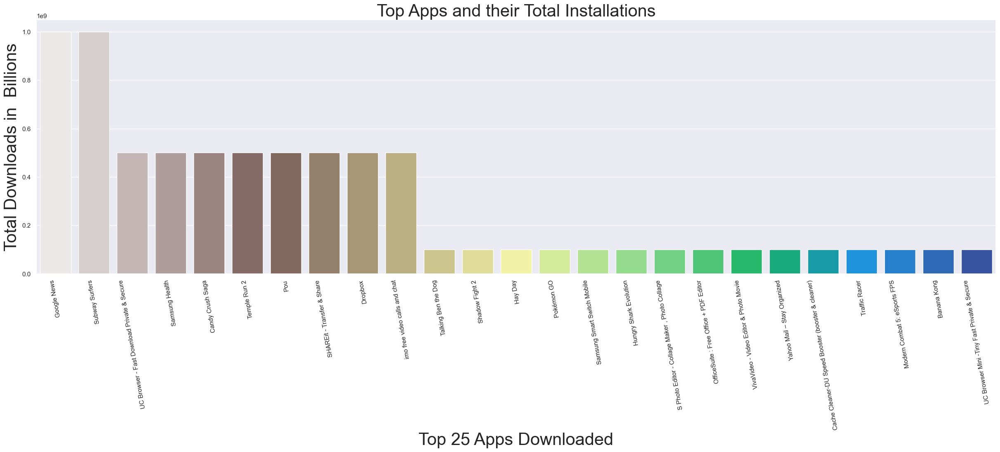

In [145]:
# set plot size
plt.figure(figsize=(30,8))
# rotating x axis labels for better visibility
plt.xticks(rotation=100)
# define color palette
sns.color_palette("terrain_r", 10)
# Generate bar plot
sns.barplot(x = highest_25_apps_installed.App, y = highest_25_apps_installed.Installs,palette="terrain_r")
# title of plot
plt.title("Top Apps and their Total Installations",size=30)
# x label
plt.xlabel("Top 25 Apps Downloaded",size=30)
# y lable
plt.ylabel("Total Downloads in  Billions",size=30)
# display plot
plt.show();

From the bar diagram above, we can clearly see that top 2 most downloaded apps in play store have been downloaded more than 1 billion times each. We can also find that majority of apps in the top 25 download list are from social networking, Mobile games like subway surfers or apps similar to social services. We can make a conclusion that the number of users downloading or using android mobiles is extremely high and is also increasing. This is because the top applications are being downloaded for a billions of times ,which effectively shows that the number of android users is increasing dramatically.

# Question-What are the top 25 Genres on Play store based on their count?

In [146]:
# give repeated apps or total count of apps
dict1 = dict(google_apps.Genres.value_counts())

# using apps dictonary making a new dictionary
dataframe = {'Genres':list(dict1.keys()),
             'Count':list(dict1.values())}

# Converting the dictionary above into a dataframe
top_genres = pd.DataFrame(dataframe)
top_genres


,Genres,Count
0,Tools,730
1,Entertainment,505
2,Education,470
3,Business,376
4,Medical,368
...,...,...
110,Music & Audio;Music & Video,1
111,Health & Fitness;Education,1
112,Video Players & Editors;Creativity,1
113,Adventure;Education,1


Since we have previously found out that there are different apps belonging to various generes. So, there are cases when multiple apps belonging to same genre. And, these different apps are downloaded for a number of times. Even though these apps are different, they may belong in the same genre. Thus, we can conclude that we can take sum of total installs of different apps belonging to a certain genre ,which can be taken as the total number of installs of application of that genre.



In [147]:
# group by generes and take sum of installs
genre_total_installs = google_apps.groupby('Genres')[['Installs']].sum()
genre_total_installs

,Installs
Genres,
Action,3025939040
Action;Action & Adventure,43020500
Adventure,216695310
Adventure;Action & Adventure,106150000
Adventure;Brain Games,100000
...,...
Video Players & Editors,866767720
Video Players & Editors;Creativity,5000000
Video Players & Editors;Music & Video,5000000


In [148]:
# merging above two based on genres and sort on count and display top 25
highest_25_genres_installed = top_genres.merge(genre_total_installs, on = 'Genres',how = 'left').sort_values('Count',ascending = False).head(25)
highest_25_genres_installed

,Genres,Count,Installs
0,Tools,730,2881044815
1,Entertainment,505,1417459179
2,Education,470,170587098
3,Business,376,386428560
4,Medical,368,31589617
5,Personalization,351,895179772
6,Lifestyle,333,394600839
7,Finance,299,244623484
8,Productivity,291,1296312744
9,Sports,290,1121349498


Text(0, 0.5, ' Count')

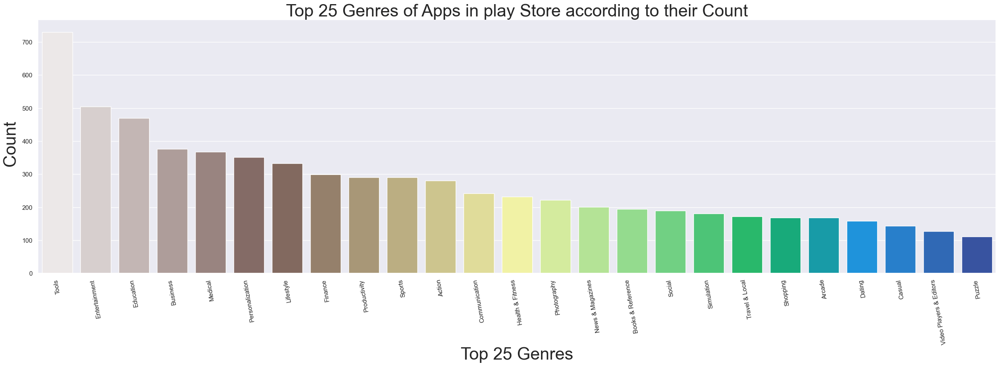

In [149]:
# plotting the graph: Top 25 Genres on the basis of their Count
plt.figure(figsize=(30,8))
plt.xticks(rotation=100)
#define color palette
sns.color_palette("terrain_r", 10)
sns.barplot(x = highest_25_genres_installed.Genres, y = highest_25_genres_installed.Count,palette="terrain_r")
plt.title('Top 25 Genres of Apps in play Store according to their Count', size=30)
# x label
plt.xlabel('Top 25 Genres',size=30)
# y label
plt.ylabel(' Count',size=30) # fontsize of the figure title

From the bar diagram above, we can say that there are more than 700 apps that belong to Tools genre in the google play store making it the most in the entire dataset. Similarly, the next genres with most apps are Entertainment and Education respectively. We can also make a conclusion that other than the Tools genre, all other top 25 genres have almost similar number of apps. It can be interpreted that the google's play store contains a number of apps belonging to varieties of Genres.

 # Question-What Genre of apps have the most installations?

In [150]:
# Sorting based on installs and display top 25
highest_25_genres_installed = highest_25_genres_installed.sort_values('Installs',ascending = False).head(25)
highest_25_genres_installed

,Genres,Count,Installs
20,Arcade,168,3299079153
10,Action,281,3025939040
0,Tools,730,2881044815
22,Casual,144,2055480730
11,Communication,242,1817943051
13,Photography,222,1493897655
1,Entertainment,505,1417459179
8,Productivity,291,1296312744
14,News & Magazines,201,1191005650
9,Sports,290,1121349498


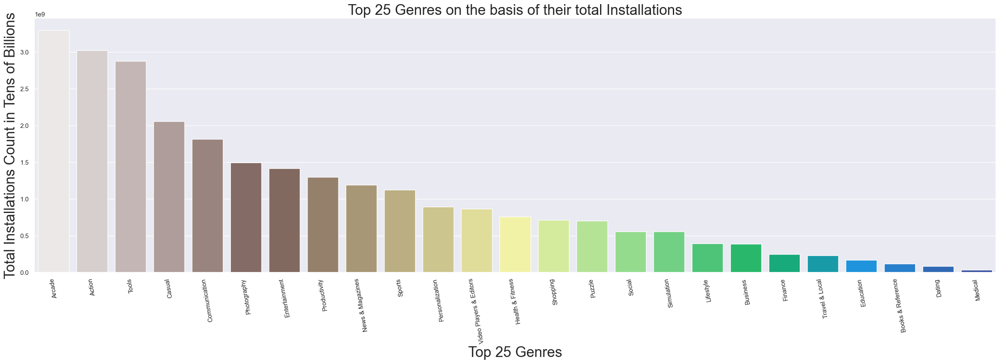

In [151]:
#set plot size
plt.figure(figsize=(30,8))
# rotate x labels
plt.xticks(rotation=100)
# define color palette
sns.color_palette("terrain_r", 10)
# generate barplot
sns.barplot(x = highest_25_genres_installed.Genres, y = highest_25_genres_installed.Installs , palette="terrain_r")
#title of the plot
plt.title('Top 25 Genres on the basis of their total Installations',size=25)
# x label
plt.xlabel('Top 25 Genres',size=25)
# y label
plt.ylabel('Total Installations Count in Tens of Billions',size=25);

We can clearly see that the maxmimum installations of application belong to Arcade, Action and Tools Genres. Similarly, in the top 25, Medical Apps have been downloaded the least number of times.

# Question-Which Genre have the most Priced Apps ?

In [152]:
# using value_counts() to count the occurrence of individual Genre ,and storing a resultant as a dictionary
dict1 = dict(google_apps.Genres.value_counts())

# Using the dictionary above to create a new dictionary
dataframe = {'Genres':list(dict1.keys()),
             'Count':list(dict1.values())}

# Converting the dictionary above into a dataframe
top_Genre = pd.DataFrame(dataframe)
top_Genre

,Genres,Count
0,Tools,730
1,Entertainment,505
2,Education,470
3,Business,376
4,Medical,368
...,...,...
110,Music & Audio;Music & Video,1
111,Health & Fitness;Education,1
112,Video Players & Editors;Creativity,1
113,Adventure;Education,1


In [153]:
# data frame with two attributes
top_genre_accordingto_price = google_apps[['Genres','Price']]   #.sort_values('Price', ascending = False)

# group by genre and sum of price
top_genre_accordingto_price = top_genre_accordingto_price.groupby(['Genres'])[['Price']].sum()

In [154]:
top_genre_accordingto_price.Price.sum()

10337.4

In [155]:
google_apps.Price.sum()

10337.400000000001

 We have taken sum of all apps belonging to individual Genre, and added it into the new dataframe. Then we calculated the total price in the price column of the new dataframe. To verify if it is correct or not, I have also calculated the sum of Price column of the apps_df column.

In [156]:
# dsiplay dataframe
top_genre_accordingto_price

,Price
Genres,
Action,83.26
Action;Action & Adventure,8.97
Adventure,53.88
Adventure;Action & Adventure,9.98
Adventure;Brain Games,2.99
...,...
Video Players & Editors,0.99
Video Players & Editors;Creativity,0.00
Video Players & Editors;Music & Video,0.00


In [157]:
# Merging above two dataframes
final_dataframe = top_Genre.merge(top_genre_accordingto_price, on = 'Genres', how = 'left').sort_values('Price', ascending = False).head(25)
final_dataframe

,Genres,Count,Price
7,Finance,299,"2,900.83"
6,Lifestyle,333,"2,353.39"
1,Entertainment,505,"1,658.60"
4,Medical,368,953.80
0,Tools,730,236.96
8,Productivity,291,232.97
2,Education,470,186.52
26,Role Playing,102,181.56
3,Business,376,162.30
5,Personalization,351,140.52


Text(0.5, 1.0, 'Top 25 Genres with maximum sum of price for the apps in USD')

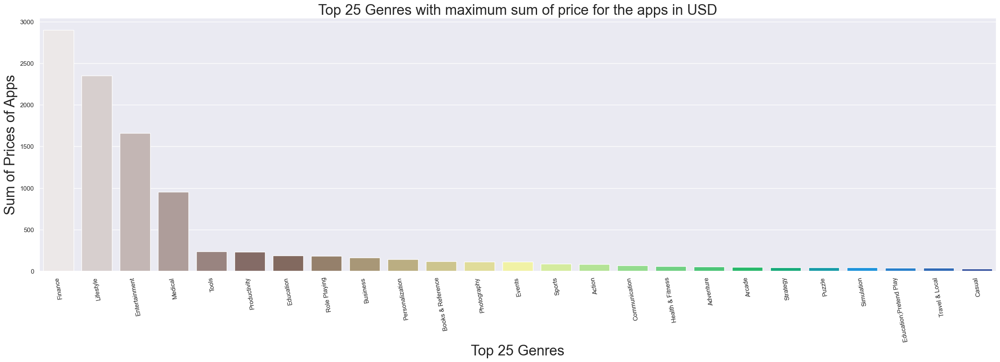

In [158]:
#set figure size
plt.figure(figsize=(30,8))
#rotate x label
plt.xticks(rotation=100)
# define color palette
sns.color_palette("terrain_r", 10)
# generate bar plot
sns.barplot(x = final_dataframe.Genres, y = final_dataframe.Price, palette="terrain_r")
# X label and font size
plt.xlabel('Top 25 Genres',size=25)
# y label and size
plt.ylabel('Sum of Prices of Apps',size=25)
#title of plot
plt.title('Top 25 Genres with maximum sum of price for the apps in USD',size=25)

From the bar diagram above, we can conclude that the apps belonging to Finance are mostly priced with high price. Previously, we had found out that the apps belonging in Social companies like facebook,google, and microsoft were downloaded for hundreds of millions of times. However, from the bar diagram above, we can see that the apps belonging to similar Genres have least price. Therefore, we can make a conclusion that these apps or apps belonging to such genres could make most of their earning from advertising as well.

# Question-Which Category of Apps have most priced Apps?
#### Question-What kinds of an apps price are high & In which category they are? Why?

In [159]:
# taking count of category
dict1 = dict(google_apps.Category.value_counts())

# making dictonary using above dictonary
dataframe = {'Category':list(dict1.keys())}

# Converting the dictionary above into a dataframe
top_Category = pd.DataFrame(dataframe)
top_Category

,Category
0,FAMILY
1,GAME
2,TOOLS
3,BUSINESS
4,MEDICAL
5,PERSONALIZATION
6,LIFESTYLE
7,FINANCE
8,PRODUCTIVITY
9,SPORTS


In [160]:
# dataframe with category and price attributes
top_Category_accordingto_price = google_apps[['Category','Price']]   

# group by category and sum of price
top_Category_accordingto_price = top_Category_accordingto_price.groupby(['Category'])[['Price']].sum()

In [161]:
# Merging above two dataframes
final_dataframe = top_Category.merge(top_Category_accordingto_price, on = 'Category', how = 'left').sort_values('Price', ascending = False).head(25)
final_dataframe

,Category,Price
7,FINANCE,"2,900.83"
6,LIFESTYLE,"2,353.39"
0,FAMILY,"2,352.98"
4,MEDICAL,953.80
1,GAME,276.35
2,TOOLS,236.96
8,PRODUCTIVITY,232.97
3,BUSINESS,162.30
5,PERSONALIZATION,140.52
14,BOOKS_AND_REFERENCE,116.78


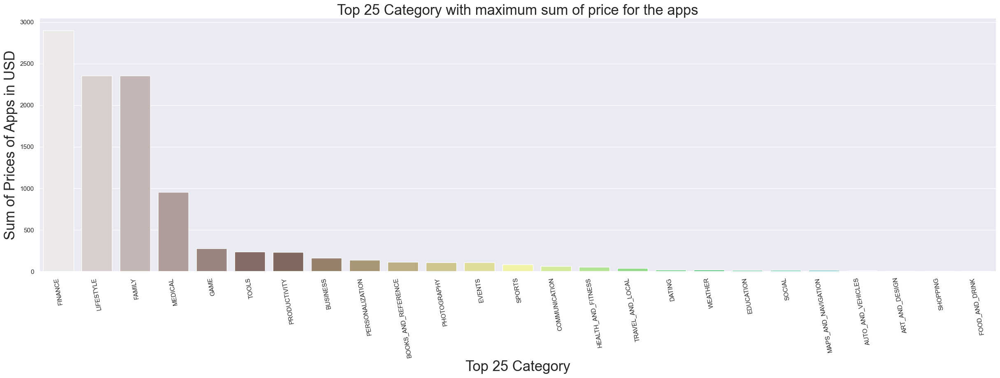

In [162]:
# set plot size
plt.figure(figsize=(30,8))
# rotate x axis lables
plt.xticks(rotation=100)
# generate a bar plot
sns.barplot(x = final_dataframe.Category, y = final_dataframe.Price, palette="terrain_r")
# x label
plt.xlabel('Top 25 Category',size=25)
# y lable
plt.ylabel('Sum of Prices of Apps in USD',size=25)
# title of the plot
plt.title('Top 25 Category with maximum sum of price for the apps',size=25);
plt.rc('font', size=20)          # controls default text sizes
plt.rc('axes', titlesize=20)     # fontsize of the axes title
plt.rc('axes', labelsize=20)    # fontsize of the x and y labels
plt.rc('xtick', labelsize=20 )    # fontsize of the tick labels
plt.rc('ytick', labelsize=20)    # fontsize of the tick labels
plt.rc('legend', fontsize=20 )    # legend fontsize
plt.rc('figure', titlesize=20)  # fontsize of the figure title
# display plot
plt.show()

# Question- Which Genres have the most and Least Ratings?

In [163]:
# group by genre and take mean of rating and sort the values
mean_ratings_accto_genres = google_apps.groupby(['Genres'])[['Rating']].mean().sort_values('Rating',ascending = False)

cols = list(google_apps.Genres.unique())

dict2 = {
    'Genres':cols
}
# conver to data frame
df = pd.DataFrame(dict2)
# merge above to data frames
mean_ratings_accto_genres = mean_ratings_accto_genres.merge(df, on = 'Genres',how = 'left')
mean_ratings_accto_genres

,Genres,Rating
0,Board;Pretend Play,4.80
1,Comics;Creativity,4.80
2,Health & Fitness;Education,4.70
3,Entertainment;Creativity,4.65
4,Adventure;Brain Games,4.60
...,...,...
110,Educational;Creativity,3.96
111,Educational,3.93
112,Art & Design;Pretend Play,3.90
113,Health & Fitness;Action & Adventure,3.90


In [164]:
# display top 10
highest_Ratings_top_10 = mean_ratings_accto_genres.head(10)
highest_Ratings_top_10

,Genres,Rating
0,Board;Pretend Play,4.80
1,Comics;Creativity,4.80
2,Health & Fitness;Education,4.70
3,Entertainment;Creativity,4.65
4,Adventure;Brain Games,4.60
5,Strategy;Action & Adventure,4.60
6,Puzzle;Education,4.60
7,Simulation;Pretend Play,4.55
8,Music;Music & Video,4.53
9,Role Playing;Action & Adventure,4.53


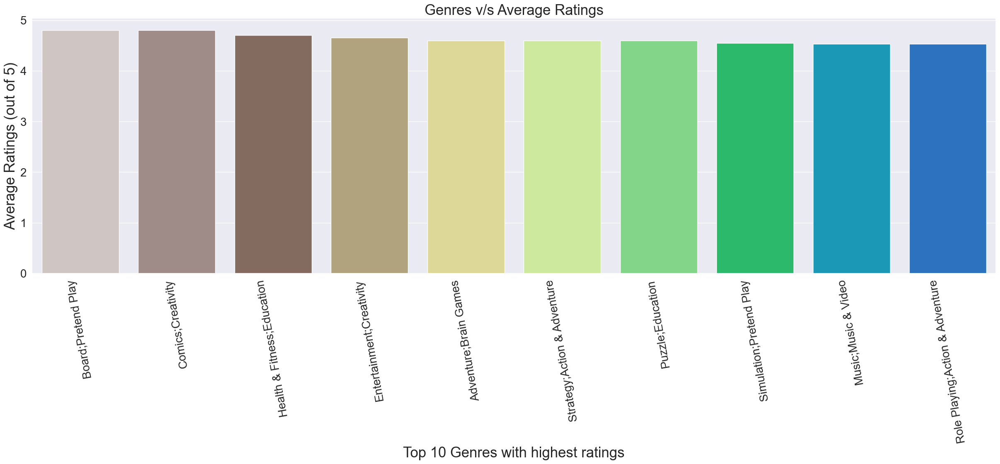

In [165]:
# set plot figure size
plt.figure(figsize=(30,8))
# rotating x labels
plt.xticks(rotation=100)
# generate bar plot 
sns.barplot(x = highest_Ratings_top_10.Genres, y = highest_Ratings_top_10.Rating, palette="terrain_r")
# x labels
plt.xlabel('Top 10 Genres with highest ratings',size=25)
# y labels with size
plt.ylabel('Average Ratings (out of 5)',size=25)
# title with size
plt.title('Genres v/s Average Ratings',size=25);

We can clearly see that Board;Pretend Play genre has the highest average ratings in the entire dataset. Thus, we can also conclude that the apps belonging to this genre are most loved as well.

In [166]:
# display top 10
lowest_Ratings_top_10 = mean_ratings_accto_genres.tail(10)
lowest_Ratings_top_10

,Genres,Rating
105,Dating,4.04
106,Board;Action & Adventure,4.03
107,Lifestyle;Pretend Play,4.00
108,Entertainment;Pretend Play,4.00
109,Video Players & Editors;Music & Video,4.00
110,Educational;Creativity,3.96
111,Educational,3.93
112,Art & Design;Pretend Play,3.90
113,Health & Fitness;Action & Adventure,3.90
114,Parenting;Brain Games,3.80


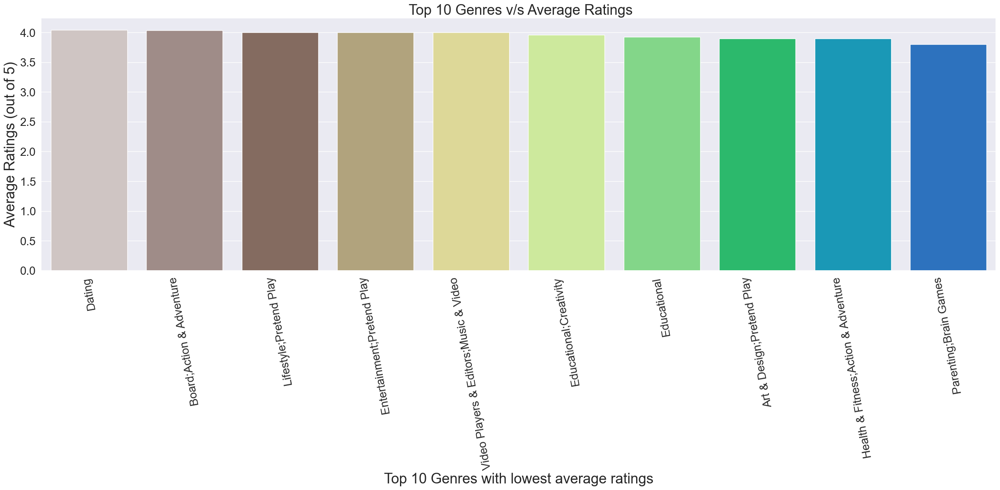

In [167]:
# set the plot figure size
plt.figure(figsize=(30,8))
# rotate x lables
plt.xticks(rotation=100)
# generate bar plot
sns.barplot(x = lowest_Ratings_top_10.Genres, y = lowest_Ratings_top_10.Rating, palette="terrain_r")
# x lables with size
plt.xlabel('Top 10 Genres with lowest average ratings',size=25)
# y lables with size
plt.ylabel('Average Ratings (out of 5)',size=25)
# title of plot with size
plt.title(' Top 10 Genres v/s Average Ratings',size=25);

We can clearly see that apps belonging to the Parenting;Brain Game genre are least rated . Perhaps maybe they are paid apps because paid apps are expected to offer more to the user than free apps

# Question- Which Category have highest and least ratings?

In [168]:
# group by category and take mean of rating and sort values into df
mean_ratings_accto_Category = google_apps.groupby(['Category'])[['Rating']].mean().sort_values('Rating',ascending = False)

cols = list(google_apps.Category.unique())

dict3 = {
    'Category':cols
}
# conver to dataframe
df1 = pd.DataFrame(dict3)
# merge both df's
mean_ratings_accto_Category = mean_ratings_accto_Category.merge(df1, on = 'Category',how = 'left')
mean_ratings_accto_Category

,Category,Rating
0,EVENTS,4.42
1,EDUCATION,4.37
2,ART_AND_DESIGN,4.36
3,PARENTING,4.34
4,PERSONALIZATION,4.32
5,BOOKS_AND_REFERENCE,4.32
6,BEAUTY,4.29
7,SOCIAL,4.27
8,WEATHER,4.25
9,GAME,4.24


In [169]:
# display top 10
highest_Ratings_top_10_Category = mean_ratings_accto_Category.head(10)
highest_Ratings_top_10_Category

,Category,Rating
0,EVENTS,4.42
1,EDUCATION,4.37
2,ART_AND_DESIGN,4.36
3,PARENTING,4.34
4,PERSONALIZATION,4.32
5,BOOKS_AND_REFERENCE,4.32
6,BEAUTY,4.29
7,SOCIAL,4.27
8,WEATHER,4.25
9,GAME,4.24


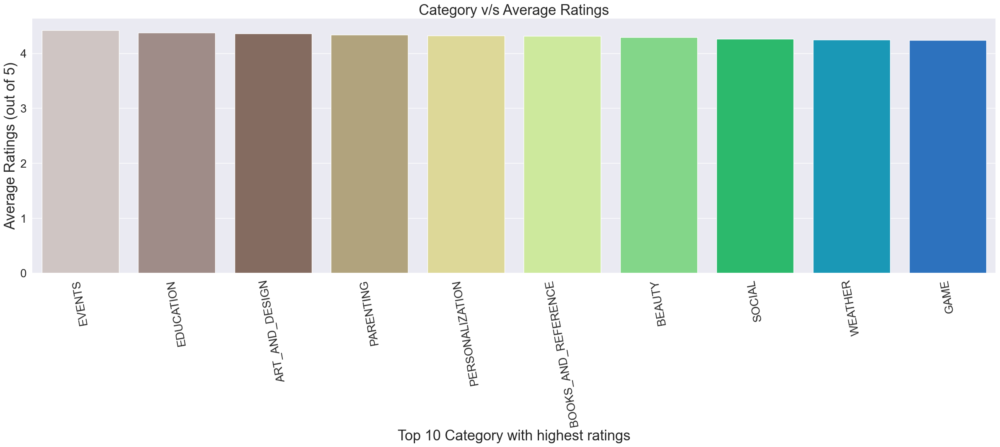

In [170]:
# set the plot figure size
plt.figure(figsize=(30,8))
# x lables rotation
plt.xticks(rotation=100)
# generate bar plot
sns.barplot(x = highest_Ratings_top_10_Category.Category, y = highest_Ratings_top_10_Category.Rating, palette="terrain_r")
# x labels with size
plt.xlabel('Top 10 Category with highest ratings',size=25)
# y label with size
plt.ylabel('Average Ratings (out of 5)',size=25)
# title of the plaot with size
plt.title('Category v/s Average Ratings',size=25);

In [171]:
# display bottomw 10
lowest_Ratings_top_10_Category = mean_ratings_accto_Category.tail(10)
lowest_Ratings_top_10_Category

,Category,Rating
23,FOOD_AND_DRINK,4.14
24,FINANCE,4.13
25,LIFESTYLE,4.13
26,PHOTOGRAPHY,4.13
27,COMMUNICATION,4.13
28,TRAVEL_AND_LOCAL,4.06
29,VIDEO_PLAYERS,4.05
30,TOOLS,4.05
31,MAPS_AND_NAVIGATION,4.04
32,DATING,4.04


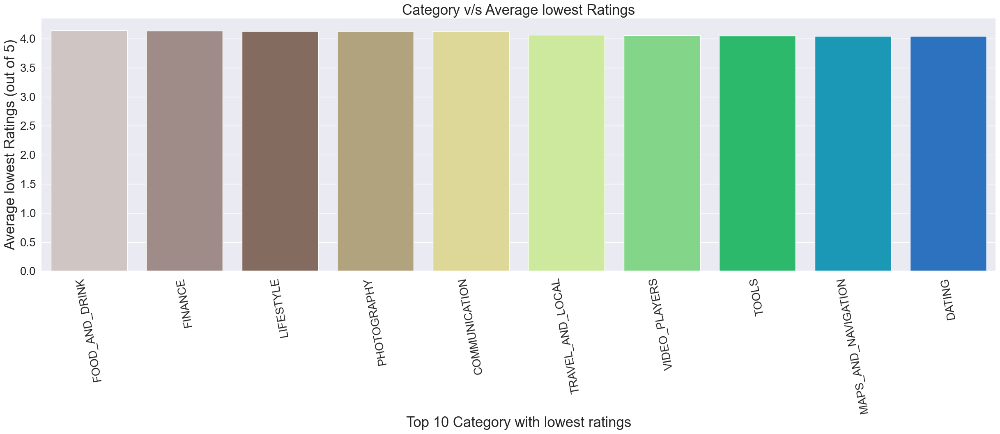

In [172]:
# set the size for the plot figure
plt.figure(figsize=(30,8))
# rotate x labels
plt.xticks(rotation=100)
# generate bar plot
sns.barplot(x = lowest_Ratings_top_10_Category.Category, y = lowest_Ratings_top_10_Category.Rating, palette="terrain_r")
# x lables with size
plt.xlabel('Top 10 Category with lowest ratings',size=25)
# y label with size
plt.ylabel('Average lowest Ratings (out of 5)',size=25)
# title of the plot with size
plt.title('Category v/s Average lowest Ratings',size=25);

# Question- What is the distribution of ratings?

In [173]:
# df with rating attribute
ratings_df = google_apps[['Rating']]
ratings_df

,Rating
0,4.10
1,3.90
2,4.70
3,4.50
4,4.30
...,...
10835,4.30
10836,4.50
10837,5.00
10838,4.30


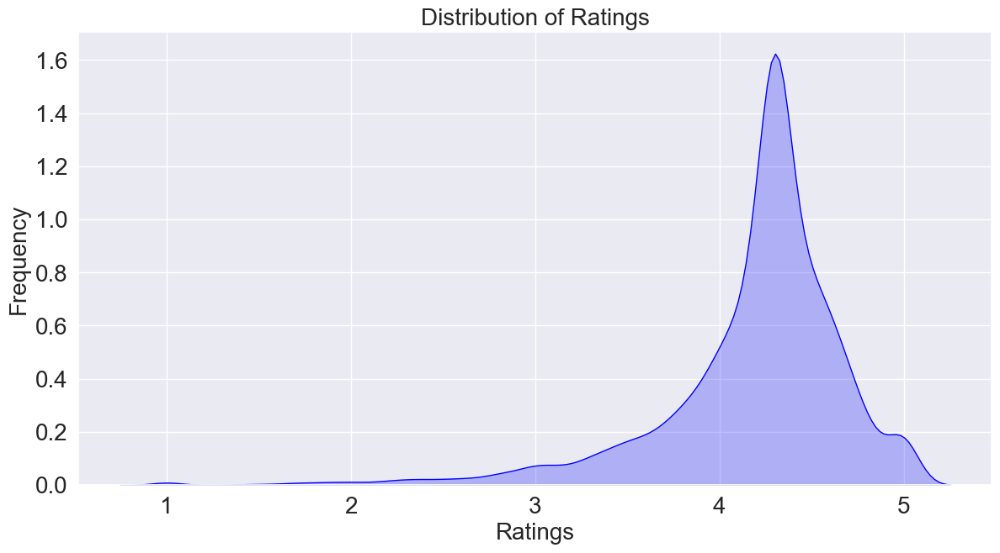

In [174]:
#set the size of the plot figure
plt.figure(figsize=(14,7))
#generae kde plot
sns.kdeplot(x = ratings_df.Rating,color = 'blue',shade = True)
# X- label
plt.xlabel("Ratings")
#y label
plt.ylabel("Frequency")
# title
plt.title('Distribution of Ratings');

In [175]:
# checking for skew
ratings_df.skew()

Rating   -1.94
dtype: float64

Here, the kdeplot of seaborn library is used to visualizaing the probability density of the ratings ranging from 1 to 5. Thus, after visualizing the ratings that we cleaned by replacing NAn values, we can conclude that the majotity of ratings were valued in between 4 to 5. There were very few ratings that were rated less than 3.

# Question-What are the number of apps in different categories with respect to their type(Free/paid) ?

In [176]:
# df with group by category and then take count and reset the index
x = google_apps.groupby(['Category','Type'])[['App']].count().reset_index()

# df wiht just apps free and count
x1 = x[x['Type'] == 'Free'].rename(columns={'App':'Free'}).drop('Type',axis = 1)

# df wiht just apps paid and count
x2 = x[x['Type'] == 'Paid'].rename(columns={'App':'Paid'}).drop(columns=['Type'])

Here, reset_index() converts the dataframe object into a pure dataframe by adding the index label column. We previously did this by creating a dictionary containing columns, converting the dictionary into a dataframe, and merging the two dataframes.

In [177]:
# above two df's are merged
total_apps_count_accto_category_df = x1.merge(x2,on = 'Category',how = 'left').fillna(0)

The equivalent steps for the above two cells

free_apps_count_df = apps_df.groupby(['Category','Type'])[['App']].count().reset_index().rename(columns={'App':'Count'})

free_apps_count_df = free_apps_count_df.pivot('Category','Type','Count').fillna(0).reset_index().rename(columns={'Type':''})

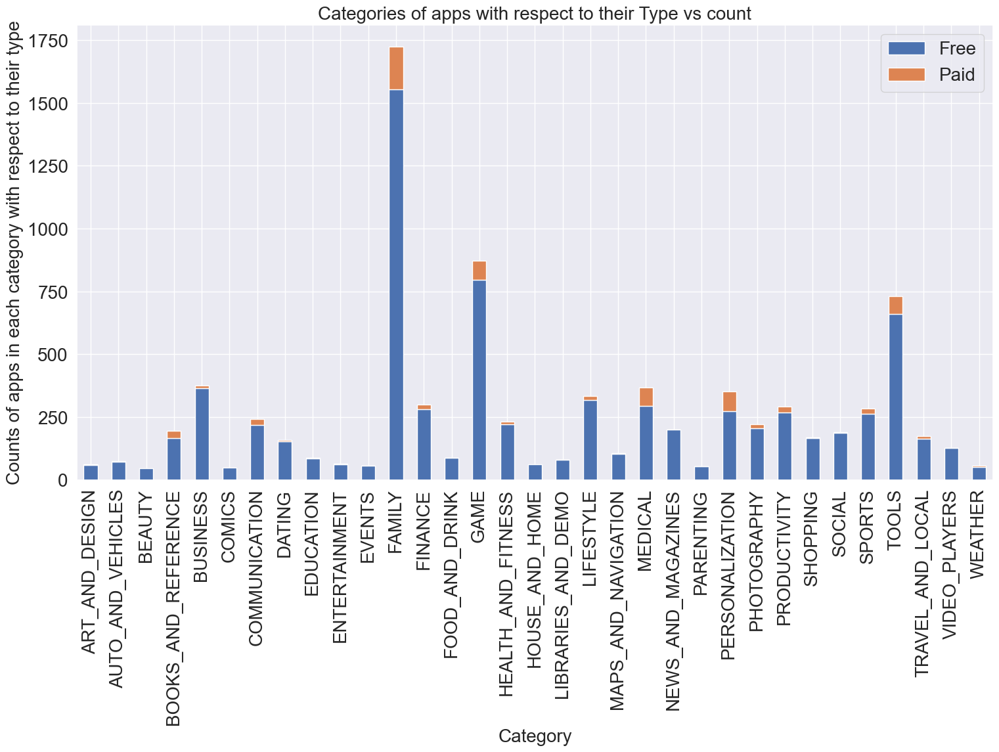

In [178]:
#generate bar plot
total_apps_count_accto_category_df.set_index('Category').plot(kind='bar', stacked=True, figsize=(18,9))
# x labels
plt.xlabel("Category")
# y label
plt.ylabel('Counts of apps in each category with respect to their type')
# title
plt.title("Categories of apps with respect to their Type vs count");

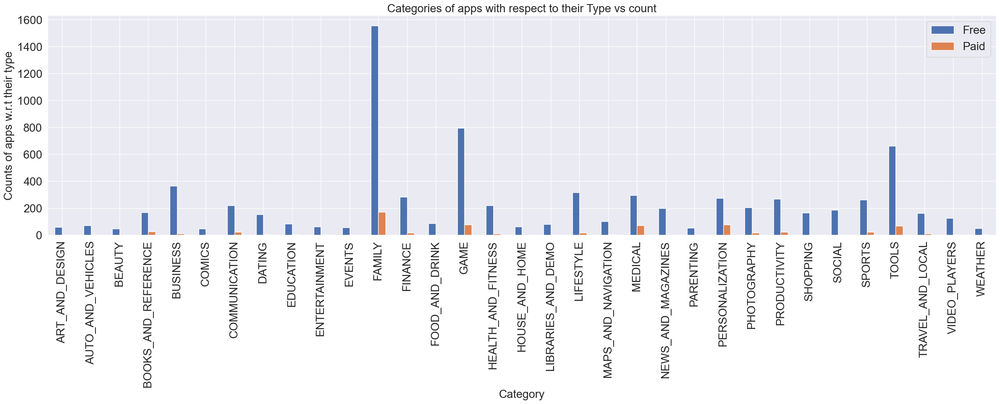

In [179]:
# generate bar plot
total_apps_count_accto_category_df.set_index('Category').plot(kind = 'bar', stacked = False, figsize = (30,7));
# x label
plt.xlabel("Category")
#y label
plt.ylabel('Counts of apps w.r.t their type')
# title
plt.title("Categories of apps with respect to their Type vs count");

We can clearly see that apps belonging to Family category had most free apps as well as Paid apps. Similarly, we can also make a conclusion that all Categories have very few paid apps as compared to free apps.

# Question-What are the number apps in different Genres with respect to their type(Free/paid) ?

In [180]:
# df wiht type and genre , then count followed by reset index
y = google_apps.groupby(['Genres','Type'])[['App']].count().reset_index()

# df with free and their count
y1 = y[y['Type'] == 'Free'].rename(columns={'App':'Free'}).drop('Type',axis = 1)

# df with paid and their count
y2 = y[y['Type'] == 'Paid'].rename(columns={'App':'Paid'}).drop(columns=['Type'])

In [181]:
# above two df's are merged
total_apps_count_acc_genre_df = y1.merge(y2,on = 'Genres',how = 'left').fillna(0)

# sort values of free
free = total_apps_count_acc_genre_df[['Genres','Free']].sort_values('Free',ascending = False)

# sort values of paid
paid = total_apps_count_acc_genre_df[['Genres','Paid']].sort_values('Paid',ascending = False)

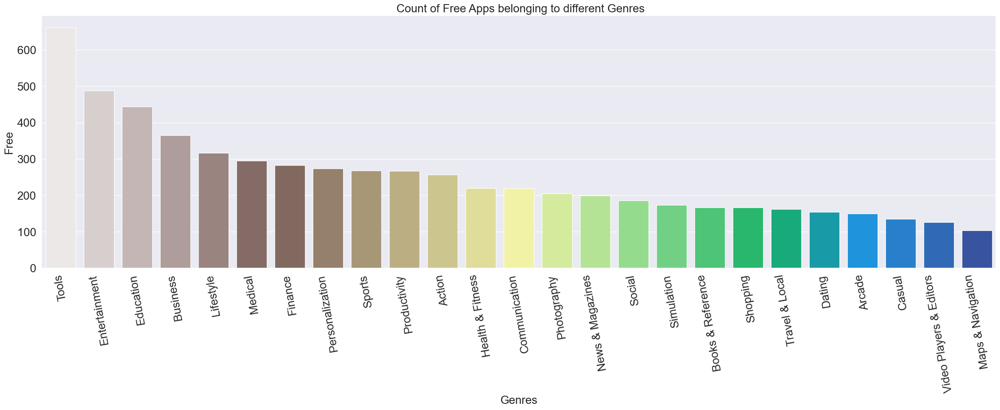

In [182]:
# set plot figure size
plt.figure(figsize=(30,8))
# rotate labels
plt.xticks(rotation=100)
# generate plot
sns.barplot(data = free.head(25), x = 'Genres', y = 'Free', palette="terrain_r")
# title of the plot
plt.title(' Count of Free Apps belonging to different Genres');

We can clearly see that the there were more than 650 apps that were free and belonged to Tools genre.

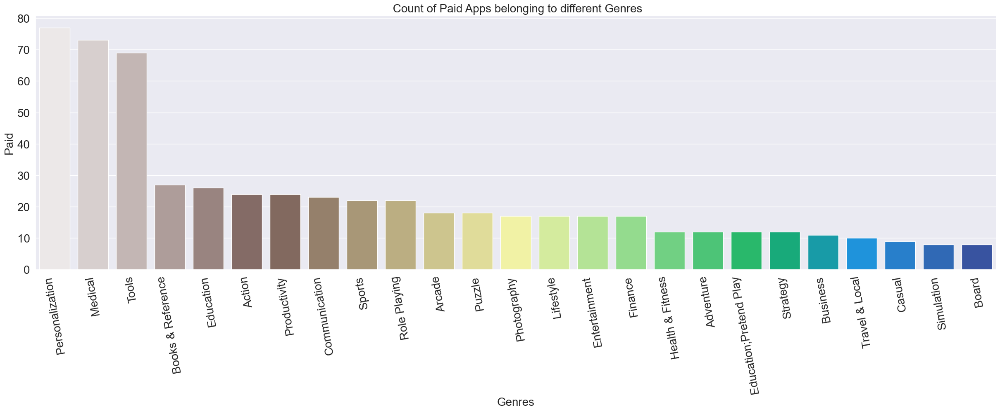

In [183]:
# set size of the plot figure
plt.figure(figsize=(30,8))
# rotate x labels
plt.xticks(rotation=100)
# generate bar plot
sns.barplot(data = paid.head(25), x = 'Genres', y = 'Paid', palette="terrain_r")
# title of the bar plot
plt.title(' Count of Paid Apps belonging to different Genres');

We can clearly see that there were more than 70 apps that were of paid type, and belonged to Personalization genre.

### Are there any factors that are impact by in_app_ads ?

Text(0, 0.5, 'Installs')

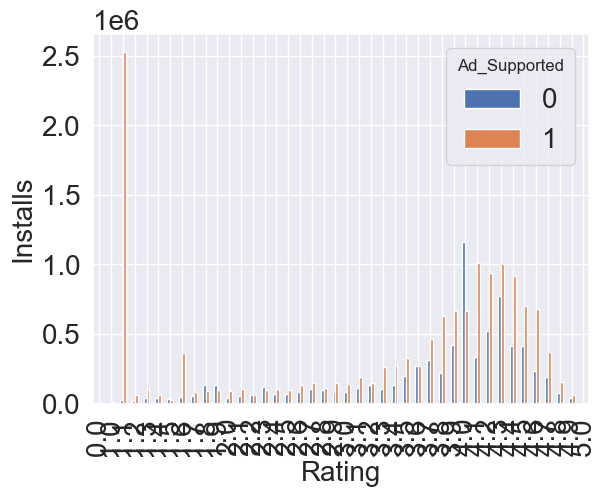

In [184]:
# generate bar plot
pd.pivot_table(Permission.reset_index(),
            index ='Rating',columns = 'Ad_Supported', values = 'Install'
              ).plot.bar(subplots=False, layout=(1,2))
# xalbel with size
plt.xlabel('Rating',size=20)
# y label with size
plt.ylabel('Installs',size=20)

Developers need not focus on In_app_adds while creating an app. From the graph, we can see that In_app_ads is not affecting the installs and ratings.

### Is there any impact on installs or ratings, if the free app has in-app purchases?

Text(0, 0.5, 'Installs')

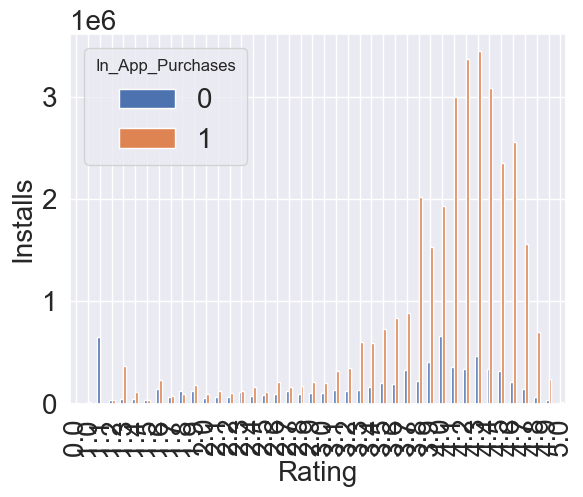

In [185]:
# genrate bar plot
Free_app = Permission[(Permission.Free == True)]
pd.pivot_table(Free_app.reset_index(),
            index ='Rating',columns = 'In_App_Purchases', values = 'Install'
              ).plot.bar(subplots=False, layout=(1,2))
# x label with size
plt.xlabel('Rating',size=20)
# y label with size
plt.ylabel('Installs',size=20)


Interpretation:

# Does more number of apps in a category have any impacts on installs?

In [186]:
# gorup by category with app count and install sum
Installs_impact=google_apps.groupby('Category').agg(App_count=('App','count'),Install_count=('Installs','sum'))
# taking unique values
sort_category = google_apps['Category'].unique()
# sort
sort_category.sort()
sort_category
Installs_impact['Category']= sort_category
# display top 5
Installs_impact.head()

,App_count,Install_count,Category
Category,,,
ART_AND_DESIGN,62,99338100,ART_AND_DESIGN
AUTO_AND_VEHICLES,75,43770211,AUTO_AND_VEHICLES
BEAUTY,47,13696950,BEAUTY
BOOKS_AND_REFERENCE,194,114962076,BOOKS_AND_REFERENCE
BUSINESS,376,386428560,BUSINESS


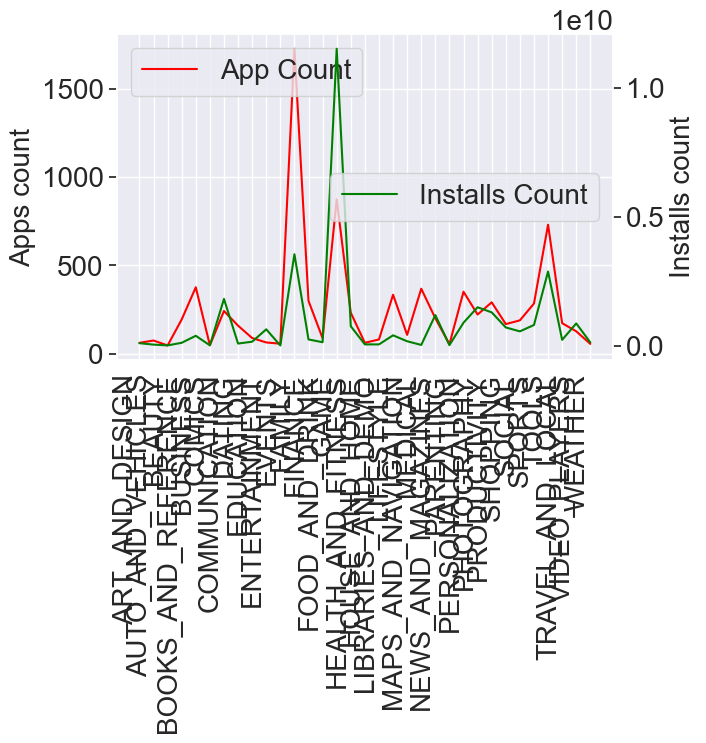

In [187]:
fig, ax_left = plt.subplots()
# x labels
ax.set_xlabel(r'Category')
# plot on top of plot
ax_right = ax_left.twinx()

# plot and label , legends for left side
ax_left.plot(Installs_impact['Category'], Installs_impact['App_count'], color='red', label='App Count')
ax_left.set_ylabel('Apps count')
ax_left.legend(loc=2)

# plot and label , legends for right side
ax_right.plot(Installs_impact['Category'], Installs_impact['Install_count'], color='green', label='Installs Count')
ax_right.set_ylabel('Installs count')
ax_right.legend()
fig.autofmt_xdate(rotation=90)

ax.grid(False)
# remove grid
plt.grid(False)
# display grid
plt.show()

Interpretation:
Even though the app count is high in a category it doesn't impact the installations. For instance, if we see the game and family, it clear this having a high count of apps in a category doesn't me it will have high installations


### How do ratings differ between an app that has a restricted content rating and one that does not?

In [188]:
# group by content rating then count of apps and sum of rating count and mean of rating
CRR=Permission.groupby('Content Rating').agg(App_Count=('App','count'),R_C=('RatingCount','sum'),R=('Rating','mean'))
# adding column
CRR['Content_Rating']=['Everyone','Teen','Mature 17+','Everyone 10+','Adult 18+']
CRR

,App_Count,R_C,R,Content_Rating
Content Rating,,,,
Adults only 18+,128,"283,826.00",2.82,Everyone
Everyone,914705,"1,667,438,720.00",2.16,Teen
Everyone 10+,15341,"305,152,992.00",2.62,Mature 17+
Mature 17+,27055,"176,695,440.00",2.45,Everyone 10+
Teen,88879,"681,583,744.00",2.29,Adult 18+


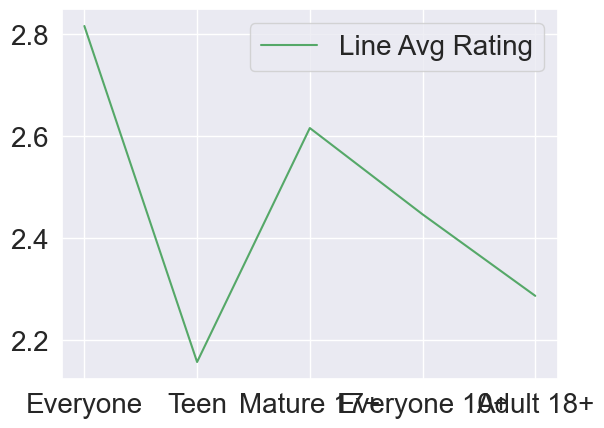

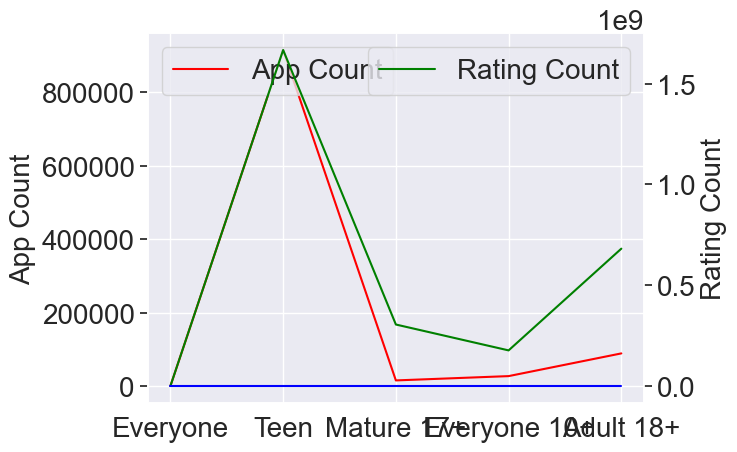

In [189]:
# Plot a simple line chart
plt.plot(CRR['Content_Rating'], CRR['R'], color='g', label='Line Avg Rating')

# Plot another line on the same chart/graph
#plt.plot(CRR['Content_Rating'], CRR['R_C'], color='r', label='Line Rating Count')

#plt.plot(X, CRR['R'], color='b', label='Line Avg Rating ')

plt.legend()
plt.subplot()
# display plot
plt.show()


fig, ax_left = plt.subplots()
ax_right = ax_left.twinx()

# plot and label , legends for left side
ax_left.plot(CRR['Content_Rating'], CRR['App_Count'], color='red', label='App Count')
ax_left.set_ylabel('App Count')
ax_left.legend(loc=2)

# plot and label , legends for right side
ax_right.plot(CRR['Content_Rating'], CRR['R_C'], color='green', label='Rating Count')
ax_right.set_ylabel('Rating Count')
ax_right.legend()

ax_right.plot(CRR['Content_Rating'], CRR['R'], color='blue')
#ax_right.set_ylabel('Avg Rating')
#ax_right.legend()

ax.grid(False)
plt.grid(False)
plt.show()

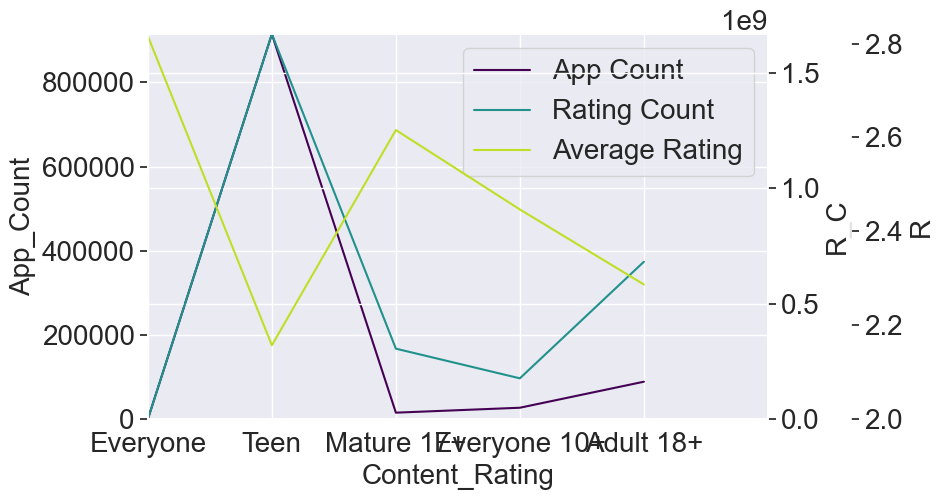

In [190]:
fig, host = plt.subplots(figsize=(8,5))
# plot on top of plot
par1 = host.twinx()
par2 = host.twinx()
# limits for x and y axes    
host.set_xlim(0, 5)
host.set_ylim(0, 914705)
par1.set_ylim(0, 1667438720)
par2.set_ylim(2, 2.82)
# labels for x and y 
host.set_xlabel("Content_Rating")
host.set_ylabel("App_Count")
par1.set_ylabel("R_C")
par2.set_ylabel("R")

color1 = plt.cm.viridis(0)
color2 = plt.cm.viridis(0.5)
color3 = plt.cm.viridis(.9)

p1, = host.plot(CRR['Content_Rating'], CRR['App_Count'],    color=color1, label="App Count")
p2, = par1.plot(CRR['Content_Rating'], CRR['R_C'],    color=color2, label="Rating Count")
p3, = par2.plot(CRR['Content_Rating'], CRR['R'], color=color3, label="Average Rating")
                
                
lns = [p1, p2, p3]
host.legend(handles=lns, loc='best')

# right, left, top, bottom
par2.spines['right'].set_position(('outward', 60))

# no x-ticks                 
par2.xaxis.set_ticks(CRR['Content_Rating'])
# remove grid
plt.grid(False)

### Number of Reviews as percent of Installs

In [191]:
# group by category and then count of apps then sum of reviews and then count of installs
RI=google_apps.groupby('Category').agg(App_count=('App','count'),Reviews_count=('Reviews','sum'),Install_count=('Installs','sum'))
print(RI)

                     App_count  Reviews_count  Install_count
Category                                                    
ART_AND_DESIGN              62   1,087,343.00       99338100
AUTO_AND_VEHICLES           75     992,322.00       43770211
BEAUTY                      47     186,856.00       13696950
BOOKS_AND_REFERENCE        194   3,262,900.00      114962076
BUSINESS                   376   4,391,145.00      386428560
COMICS                      48     590,601.00       16981150
COMMUNICATION              242  45,902,247.00     1817943051
DATING                     159   2,197,285.00       84606107
EDUCATION                   89   4,173,948.00      157302000
ENTERTAINMENT               64  10,106,351.00      637960000
EVENTS                      57     126,649.00       10672151
FAMILY                    1725 113,291,561.00     3552970925
FINANCE                    299   8,869,640.00      244623484
FOOD_AND_DRINK              88   3,325,103.00      136588740
GAME                    

In [192]:
# taling uniques
x = google_apps.Category.unique()
# sort
x.sort()
x
RI['Category']= x
RI

,App_count,Reviews_count,Install_count,Category
Category,,,,
ART_AND_DESIGN,62,"1,087,343.00",99338100,ART_AND_DESIGN
AUTO_AND_VEHICLES,75,"992,322.00",43770211,AUTO_AND_VEHICLES
BEAUTY,47,"186,856.00",13696950,BEAUTY
BOOKS_AND_REFERENCE,194,"3,262,900.00",114962076,BOOKS_AND_REFERENCE
BUSINESS,376,"4,391,145.00",386428560,BUSINESS
COMICS,48,"590,601.00",16981150,COMICS
COMMUNICATION,242,"45,902,247.00",1817943051,COMMUNICATION
DATING,159,"2,197,285.00",84606107,DATING
EDUCATION,89,"4,173,948.00",157302000,EDUCATION


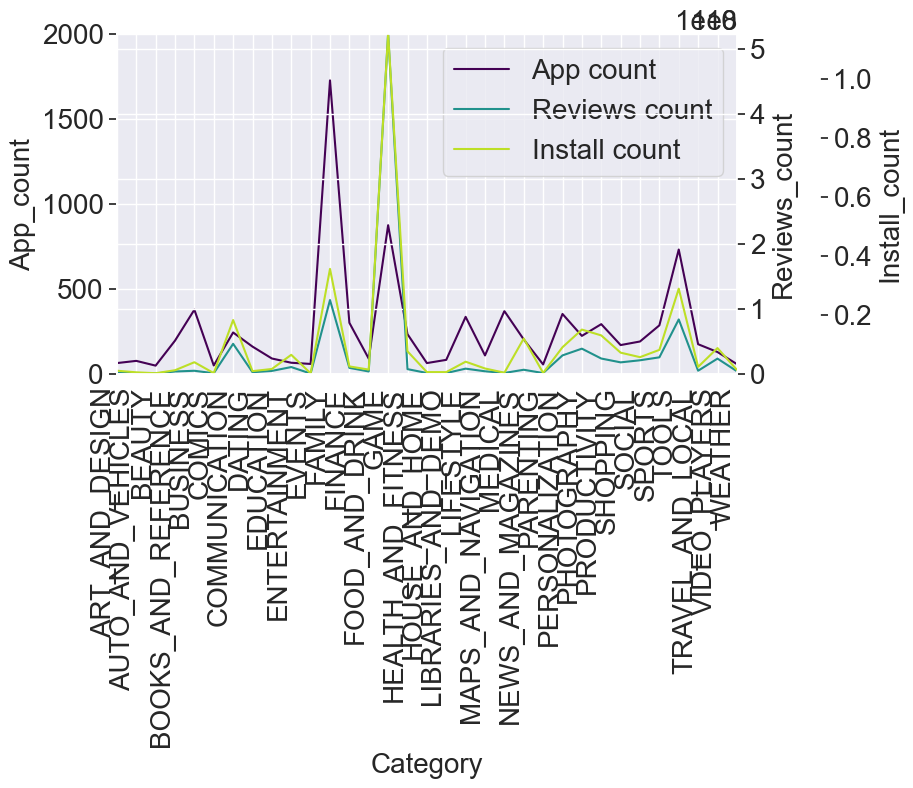

In [193]:
fig, host = plt.subplots(figsize=(8,5))

par1 = host.twinx()
par2 = host.twinx()
# limits for x and y   
host.set_xlim(0, 5)
host.set_ylim(0, 2000)
par1.set_ylim(0, 523423792)
par2.set_ylim(2, 11532464253)
# labels for x and y    
host.set_xlabel("Category")
host.set_ylabel("App_count")
par1.set_ylabel("Reviews_count")
par2.set_ylabel("Install_count")

color1 = plt.cm.viridis(0)
color2 = plt.cm.viridis(0.5)
color3 = plt.cm.viridis(.9)

p1, = host.plot(RI['Category'], RI['App_count'],    color=color1, label="App count")
p2, = par1.plot(RI['Category'], RI['Reviews_count'],    color=color2, label="Reviews count")
p3, = par2.plot(RI['Category'], RI['Install_count'], color=color3, label="Install count")
                
                
lns = [p1, p2, p3]
host.legend(handles=lns, loc='best')

# right, left, top, bottom
par2.spines['right'].set_position(('outward', 60))

# no x-ticks                 
par2.xaxis.set_ticks(RI['Category'])
# rotate labels
fig.autofmt_xdate(rotation=90)
# remove grid
plt.grid(False)

## Question:Is Reviews and Ratings contradict each other?

In [194]:
# group by category and then mean of rating and mean of reviews, mean of installs
Reviews_Rating_Contradict=google_apps.groupby('Category').agg(Avg_Rating=('Rating','mean'),Reviews_count=('Reviews','mean'),Install_count=('Installs','mean'))
# taking unique values
categorycol = google_apps.Category.unique()
# sort values
categorycol.sort()
categorycol
Reviews_Rating_Contradict['Category']= categorycol
Reviews_Rating_Contradict

,Avg_Rating,Reviews_count,Install_count,Category
Category,,,,
ART_AND_DESIGN,4.36,"17,537.79","1,602,227.42",ART_AND_DESIGN
AUTO_AND_VEHICLES,4.17,"13,230.96","583,602.81",AUTO_AND_VEHICLES
BEAUTY,4.29,"3,975.66","291,424.47",BEAUTY
BOOKS_AND_REFERENCE,4.32,"16,819.07","592,588.02",BOOKS_AND_REFERENCE
BUSINESS,4.18,"11,678.58","1,027,735.53",BUSINESS
COMICS,4.16,"12,304.19","353,773.96",COMICS
COMMUNICATION,4.13,"189,678.71","7,512,161.37",COMMUNICATION
DATING,4.04,"13,819.40","532,113.88",DATING
EDUCATION,4.37,"46,898.29","1,767,438.20",EDUCATION


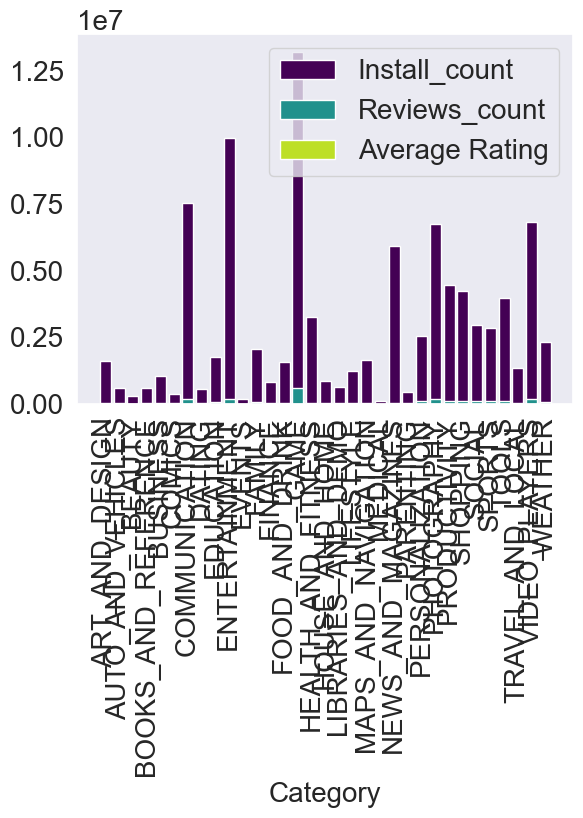

In [195]:
# three bar plots generation
plt.bar(Reviews_Rating_Contradict['Category'],Reviews_Rating_Contradict['Install_count'],color=color1, label = 'Install_count')
plt.bar(Reviews_Rating_Contradict['Category'],Reviews_Rating_Contradict['Reviews_count'],color=color2, label = 'Reviews_count')
plt.bar(Reviews_Rating_Contradict['Category'],Reviews_Rating_Contradict['Avg_Rating'],color=color3, label = 'Average Rating')
plt.legend()
# x lable
plt.xlabel('Category')
# rotate x label
plt.xticks(rotation=90)
# remove grid
plt.grid(False)
# display plot
plt.show()

## Question:Examining how many installs an app receives, in relation to its size and version?

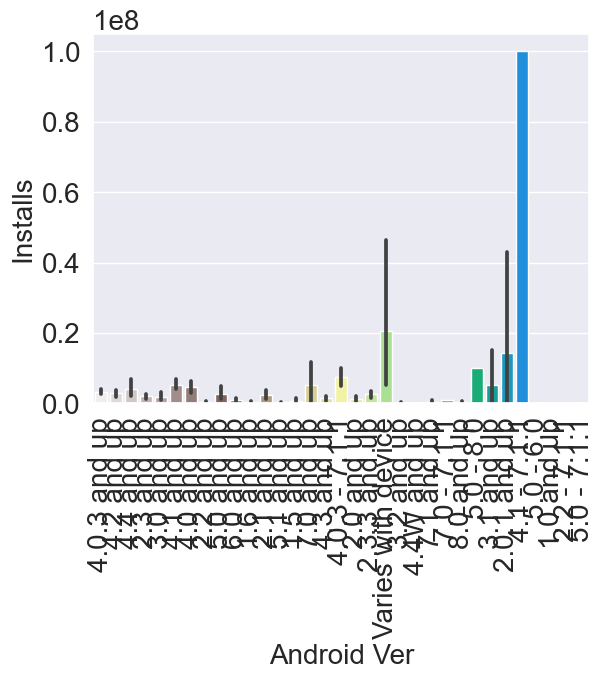

In [196]:
# generate box plot
sns.barplot(x=google_apps['Android Ver'],y=google_apps['Installs'],palette="terrain_r")
# rotate x labels
plt.xticks(rotation=90)
# display plot
plt.show()

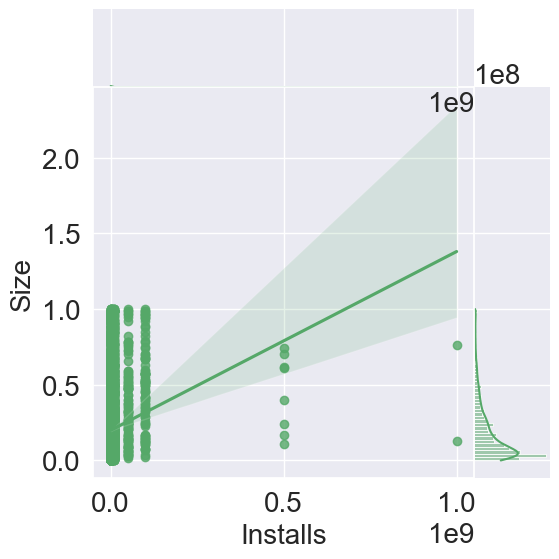

In [197]:
# generate join plot
sns.jointplot(x=google_apps['Installs'],y=google_apps['Size'],kind="reg", space=0, color="g")
# display the plot
plt.show()

As the size increases the number of installations decreases. Having a optimal size will help in getting more installs

## Heatmap of all numerical variables to get an overview of relationships between them

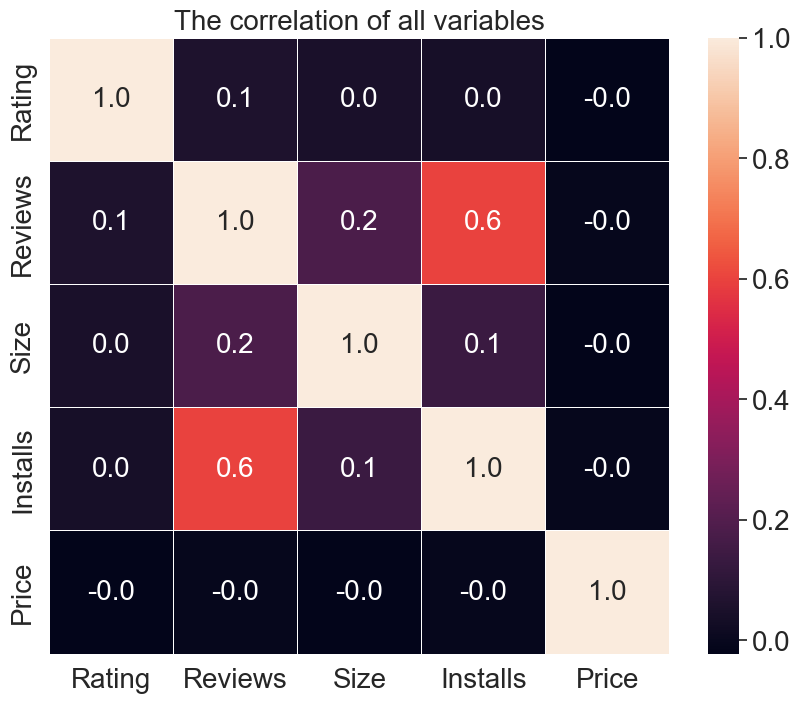

In [198]:
f,ax = plt.subplots(figsize=(10,8))
# generate head map for correlation
sns.heatmap(google_apps.corr(), annot=True, linewidths=.5, fmt= '.1f',ax=ax)
# title of the plot and size
plt.title("The correlation of all variables",size=20) 
# display the plot
plt.show()

Basically rating would be influenced by reviews, size and installs and obviously reviews are correlated with installations.

## Distribution of reviews

Text(0.5, 1.0, 'Distribution of Review in millions')

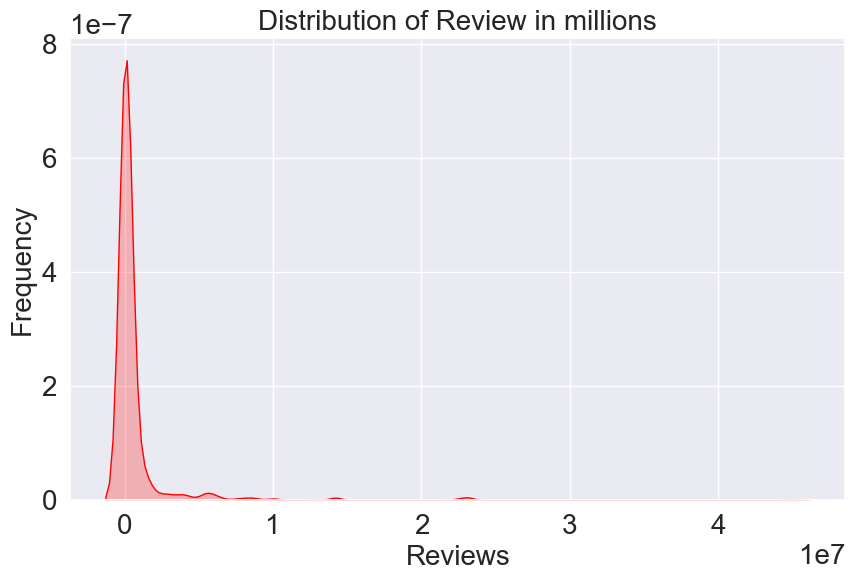

In [199]:
# set the size of the figure for plot
plt.figure(figsize=(10,6))
# generate kdeplot
rewviews = sns.kdeplot(apps_reviews.Reviews, color="Red", shade = True)
# set x label
rewviews.set_xlabel("Reviews")
# set y lable
rewviews.set_ylabel("Frequency")
# title for the plot
plt.title('Distribution of Review in millions',size = 20)

Most of applications in the store have less than 1M in reviews.

## Reviews vs Rating

In [200]:
# define plot font values
font = {'family' : 'normal',
        'weight' : 'normal',
        'size'   : 22}

matplotlib.rc('font', **font)

Text(0.5, 1.0, 'Rating VS Reveiws')

findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.


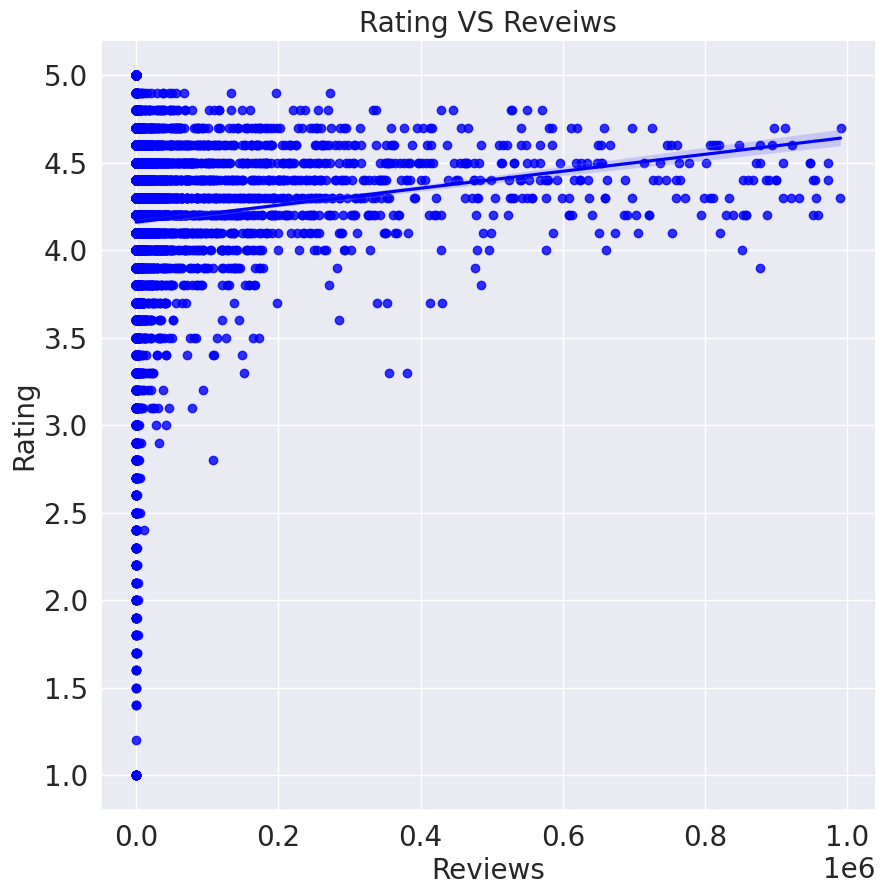

In [201]:
# set the size of the plot figure
plt.figure(figsize = (10,10))
# generate plot
sns.regplot(x="Reviews", y="Rating", color = 'Blue',data=google_apps[google_apps['Reviews']<1000000]);
# title of the plot with size
plt.title('Rating VS Reveiws',size = 20)

The applications with more reviews get higher ratings.

## Number of reviews for each category

findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.


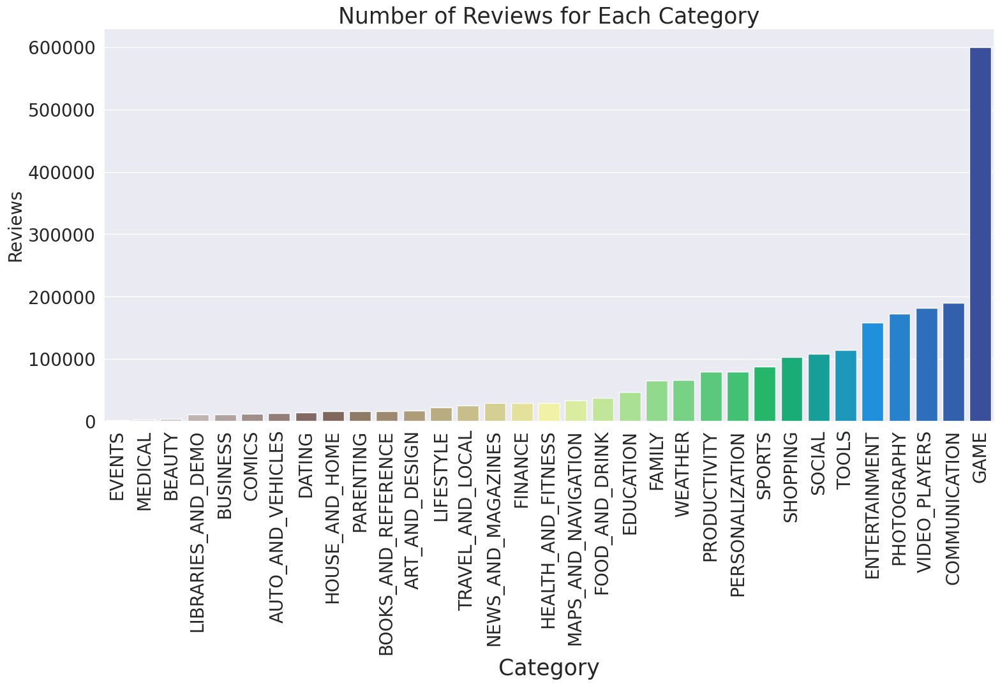

In [202]:
# group by category and take mean of reviews then index rest and then sort values
result1 = google_apps.groupby(["Category"])['Reviews'].aggregate(np.mean).reset_index().sort_values('Reviews')

plt.subplots(figsize = (18,8))
# rotate x label
plt.xticks(rotation = 90)
# generate plot
sns.barplot('Category','Reviews', ci=None, data = google_apps, order=result1['Category'],palette="terrain_r")
# title of the plot
plt.title('Number of Reviews for Each Category',size=25)
# xlabel with size
plt.xlabel('Category',size=25)
# display plot
plt.show()

Based on the barplot, the category GAME received most reviews and category EVENTS have least reviews.
By counting the number of “Reviews” for each “Category”, the SOCIAL, COMMUNICATION
and GAME applications received a lot of reviews. This makes sense since those three are the
most common applications that people used a lot in real life

## Average Reviews by Application Installations

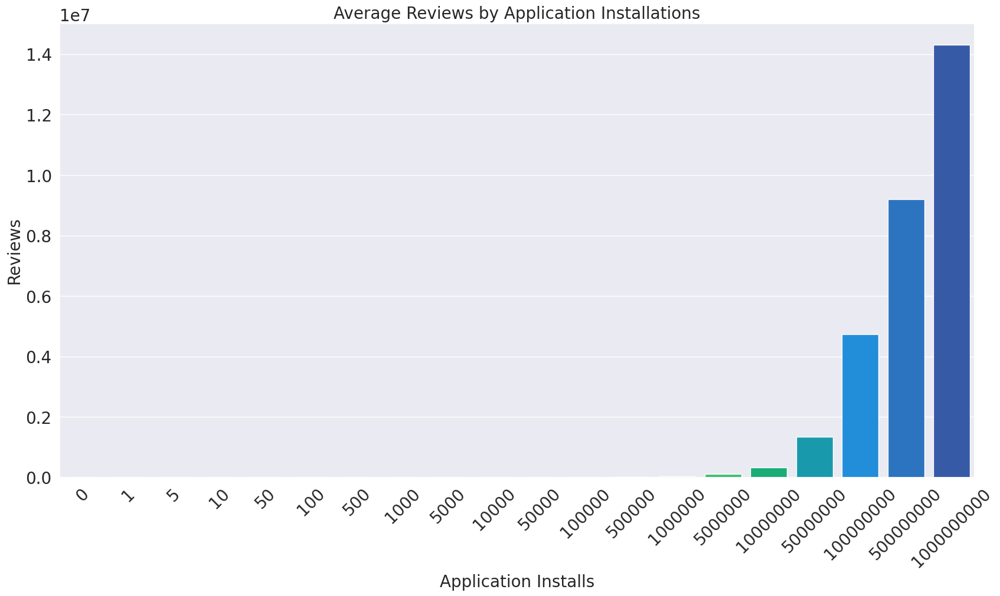

In [203]:
# group by install and means of reviews and then index reset and sort by reviews
result3 = google_apps.groupby(["Installs"])['Reviews'].aggregate(np.mean).reset_index().sort_values('Reviews')
#set the size of the figure for plot
plt.figure(figsize=(20,10))
#generate plot
sns.barplot(x=google_apps.Installs, y=google_apps.Reviews,ci=None,order=result3['Installs'],palette="terrain_r")
# rotation of x labels
plt.xticks(rotation = 45)
# x label
plt.xlabel('Application Installs')
# y lable
plt.ylabel('Reviews')
# tile with size for plot
plt.title('Average Reviews by Application Installations',size=20)
# display plot
plt.show()

Based on the barplot, the most installed application got lots of reviews.
By counting the number of “Reviews” for “Installs”, we see that the most installed application
got lots of reviews. This means that people
would like to install applications with more reviews.

## Jointplot of Rating VS Size

<Figure size 1200x1200 with 0 Axes>

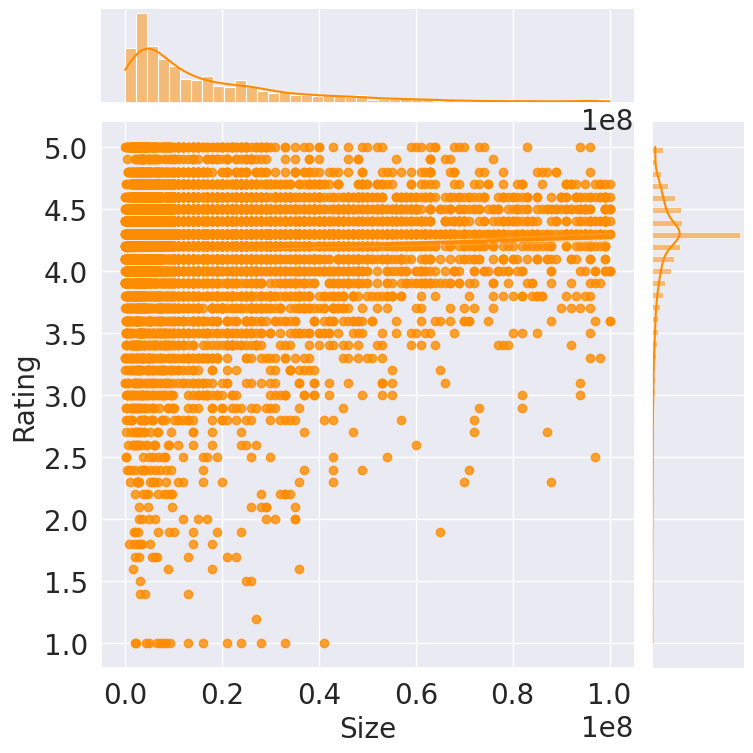

In [204]:
# set size of the figure in the plot
plt.figure(figsize = (12,12))
# genereate join plot with configuration
size = sns.jointplot(x="Size", y="Rating",color = 'darkorange', data=google_apps, size = 8, kind="reg")

Based on the distribution and regression line for “Size” vs “Rating” below, the relationship
between “Size” vs “Rating” is not obvious, but applications with larger size have slightly higher
rating. Larger applications will generally have a lot of functions and in most cases, people would
like at least one function and give great feedback based on the functions that are useful for them.
However, for small applications, they might have fewer functions and if people don’t like those
functions, small applications would not receive a high rating.

## pie chart of the percentage of free and paid applications

findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.


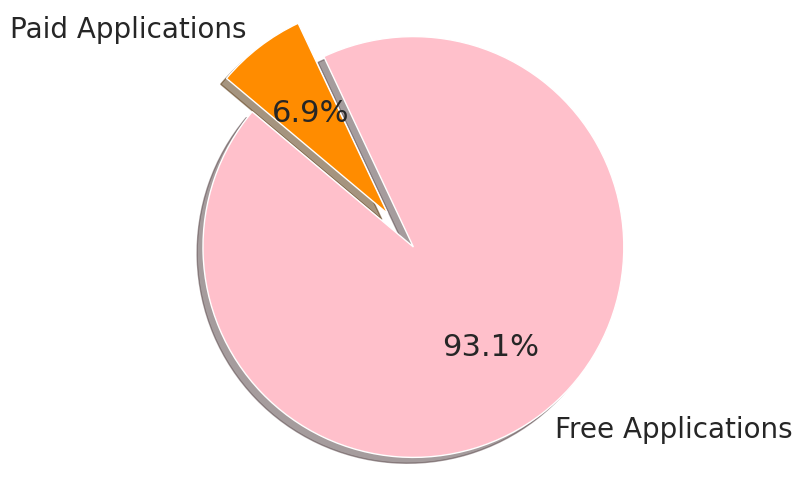

In [205]:
# % of the paid and free
totalapp_free_df = (google_apps[google_apps.Type == 'Free'].count().iloc[0] / google_apps['App'].count() * 100).round(2)
totalapp_paid_df = (google_apps[google_apps.Type == 'Paid'].count().iloc[0] / google_apps['App'].count() * 100).round(2)
plt.figure(figsize=(6,6,))
# labels
labels = 'Free Applications', 'Paid Applications'
sizes = [93.11,6.89]
explode = (0.2,0)
colors = ['pink','darkorange']
# generate pie plot
plt.pie(sizes, explode=explode,labels=labels, colors=colors,
        autopct='%1.1f%%', shadow=True, startangle=140)
plt.axis('equal')
# display pie plot
plt.show()

Basically most of applications are free.

<AxesSubplot:>

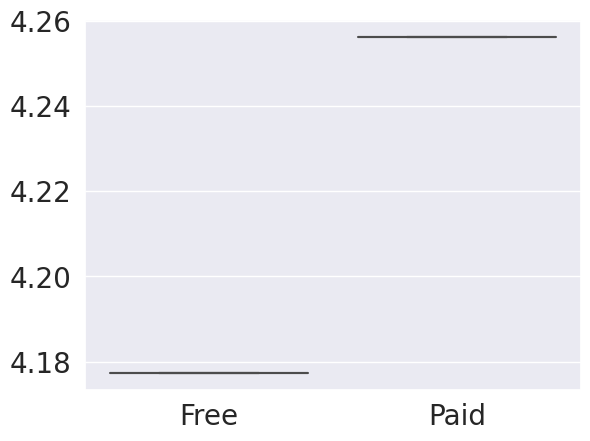

In [206]:
# mean of paid and free app
totalapp_free_df=google_apps[google_apps.Type=='Free'].Rating.mean()
totalapp_paid_df=google_apps[google_apps.Type!='Free'].Rating.mean()
# generate boxplot
sns.boxplot(x=['Free','Paid'],y=[totalapp_free_df,totalapp_paid_df])

We can see that paid applications have higher average rating than free applications.

## Pairwise Plot of Numeric Features based on free applications and paid applications

findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.


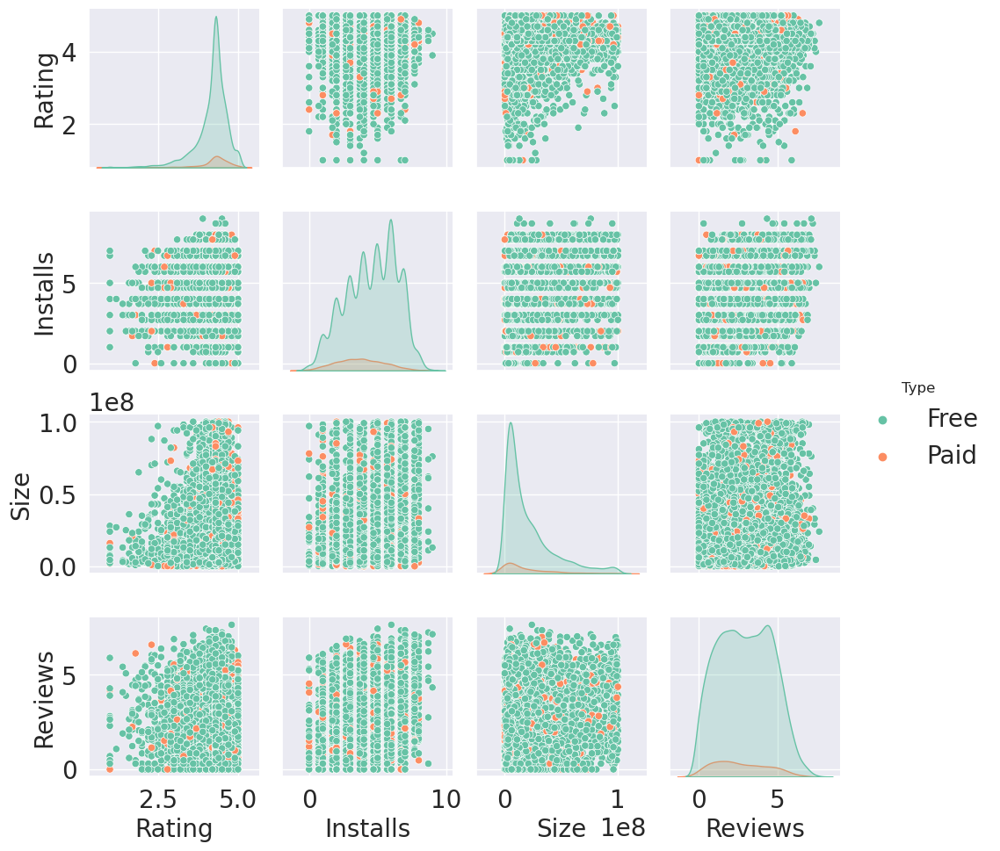

In [207]:
# remove na's
rating = google_apps['Rating'].dropna()
size = google_apps['Size'].dropna()
installs = google_apps['Installs'][google_apps.Installs!=0].dropna()
reviews = google_apps['Reviews'][google_apps.Reviews!=0].dropna()
type = google_apps['Type'].dropna()
# generate pair plot with all the configuration for 'Rating', 'Installs', 'Size','Reviews', 'Type'
pairplot = sns.pairplot(pd.DataFrame(list(zip(rating, np.log10(installs), size, np.log10(reviews), type)),
                                     columns=['Rating', 'Installs', 'Size','Reviews', 'Type']), hue='Type', palette="Set2")

###  need to change this interpretation:
Based on the pairwise plots we conclude that free applications get higher ratings. Still, the overall distributions of ratings for free applications and paid applications respectively are highly similar. The same can be said for the overall distributions of sizes for free applications and paid applications. Meanwhile, although free applications have more installations then paid applications, paid applications received more reviews than free applications.    

## Boxplot of Price VS Rating based on PriceBand

In [208]:
# creating a price groups or levels
google_apps.loc[google_apps['Price'] == 0, 'PriceBand'] = '0 Free'
google_apps.loc[(google_apps['Price'] > 0) & (google_apps['Price'] <= 0.99), 'PriceBand'] = '1 Cheap'
google_apps.loc[(google_apps['Price'] > 0.99) & (google_apps['Price'] <= 2.99), 'PriceBand']   = '2 Not Too Cheap'
google_apps.loc[(google_apps['Price'] > 2.99) & (google_apps['Price'] <= 4.99), 'PriceBand']   = '3 Normal'
google_apps.loc[(google_apps['Price'] > 4.99) & (google_apps['Price'] <= 14.99), 'PriceBand']   = '4 Not Too Expensive'
google_apps.loc[(google_apps['Price'] > 14.99) & (google_apps['Price'] <= 29.99), 'PriceBand']   = '5 Expensive'
google_apps.loc[(google_apps['Price'] > 29.99), 'PriceBand']  = '6 Too Expensive'

In [209]:
# group by PriceBand and mean of rating
google_apps[['PriceBand', 'Rating']].groupby(['PriceBand'], as_index=False).mean()

,PriceBand,Rating
0,0 Free,4.18
1,1 Cheap,4.30
2,2 Not Too Cheap,4.27
3,3 Normal,4.24
4,4 Not Too Expensive,4.24
5,5 Expensive,4.25
6,6 Too Expensive,4.04


[]

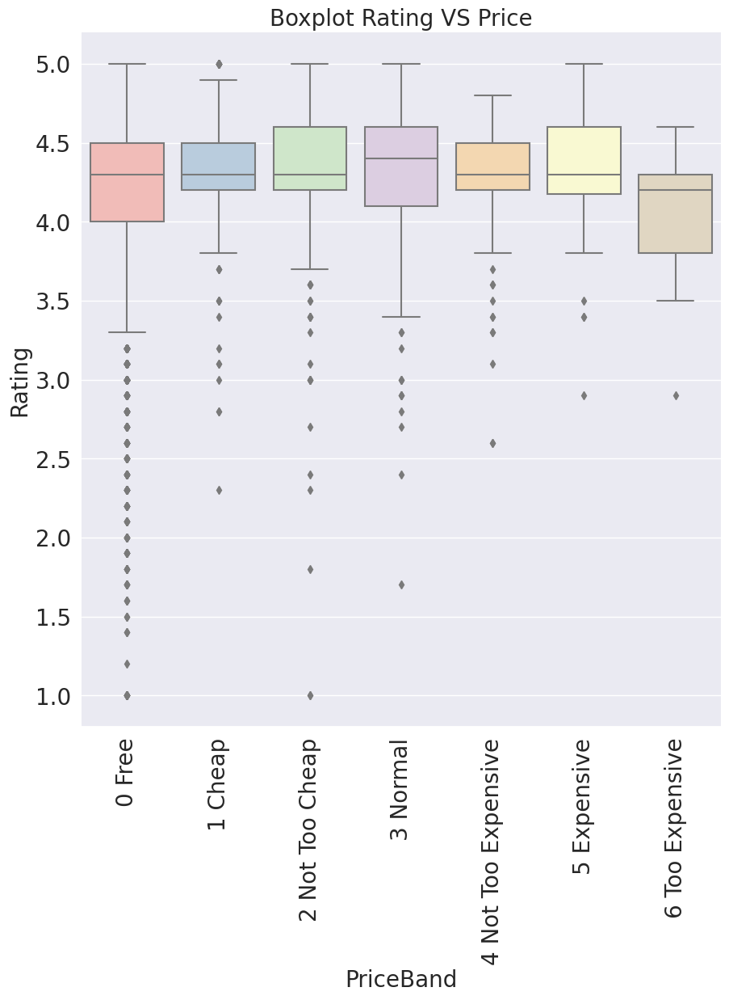

In [210]:
# generate cat plot
price = sns.catplot(x="PriceBand",y="Rating",data=google_apps, kind="box", height = 10 ,palette = "Pastel1",
                    order=["0 Free", "1 Cheap","2 Not Too Cheap", "3 Normal", "4 Not Too Expensive", "5 Expensive", "6 Too Expensive"])
price.despine(left=True)
# rotate x labels
price.set_xticklabels(rotation=90)
# y label
price.set_ylabels("Rating")
# title of the plot
plt.title('Boxplot Rating VS Price',size = 20)
# display plot
plt.plot()

Based on the boxplot we get, if an application is very expensive, it might get low rating.

## Boxenplot of Rating VS Content Rating based on ContentRatingBand

In [211]:
#creating content rating groups or levels
google_apps.loc[google_apps['Content Rating'] == 'Everyone', 'ContentRatingBand'] = 'Everyone'
google_apps.loc[(google_apps['Content Rating'] == 'Teen'), 'ContentRatingBand'] = 'Teen'
google_apps.loc[(google_apps['Content Rating'] == 'Everyone 10+'), 'ContentRatingBand'] = 'Everyone 10+'
google_apps.loc[(google_apps['Content Rating'] == 'Mature 17+'), 'ContentRatingBand'] = 'Mature 17+'
google_apps.loc[(google_apps['Content Rating'] == 'Adults only 18+'), 'ContentRatingBand'] = 'Adults only 18+'
google_apps.loc[(google_apps['Content Rating'] == 'Unrated'), 'ContentRatingBand'] = 'Unrated'

In [212]:
# group by ContentRatingBand and mean of rating
google_apps[['ContentRatingBand', 'Rating']].groupby(['ContentRatingBand'], as_index=False).mean()

,ContentRatingBand,Rating
0,Everyone,4.18
1,Everyone 10+,4.24
2,Mature 17+,4.13
3,Teen,4.24


[]

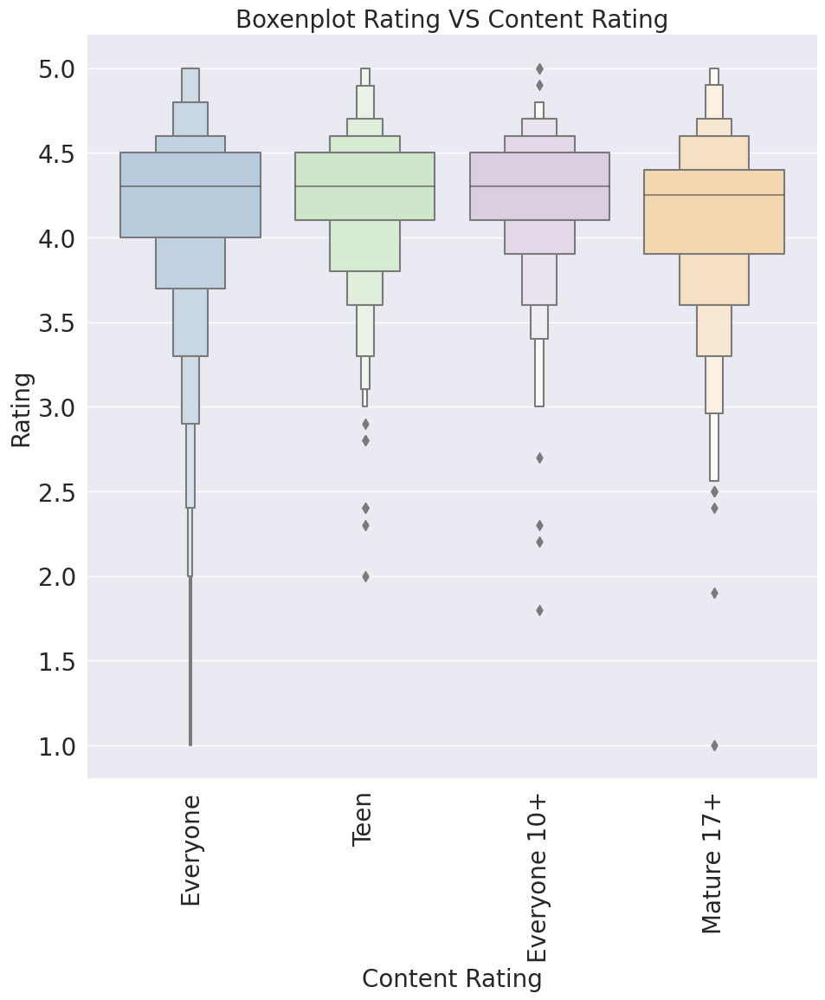

In [213]:
# generate catplot
price = sns.catplot(x="Content Rating",y="Rating",data=google_apps, kind="boxen", height = 10 ,palette = "Pastel1",
                    order=["Adults only 18+", "Everyone", "Teen", "Everyone 10+", "Mature 17+","Unrated"])
price.despine(left=True)
# rotate x lable
price.set_xticklabels(rotation=90)
# y label
price.set_ylabels("Rating")
# title of the plot
plt.title('Boxenplot Rating VS Content Rating',size = 20)
#disply plot
plt.plot()

Based on the boxenplot we get, applications rated by Everyone 10+ and Teen got highest rating.

## Pieplot for percentage of reviews for each content rating

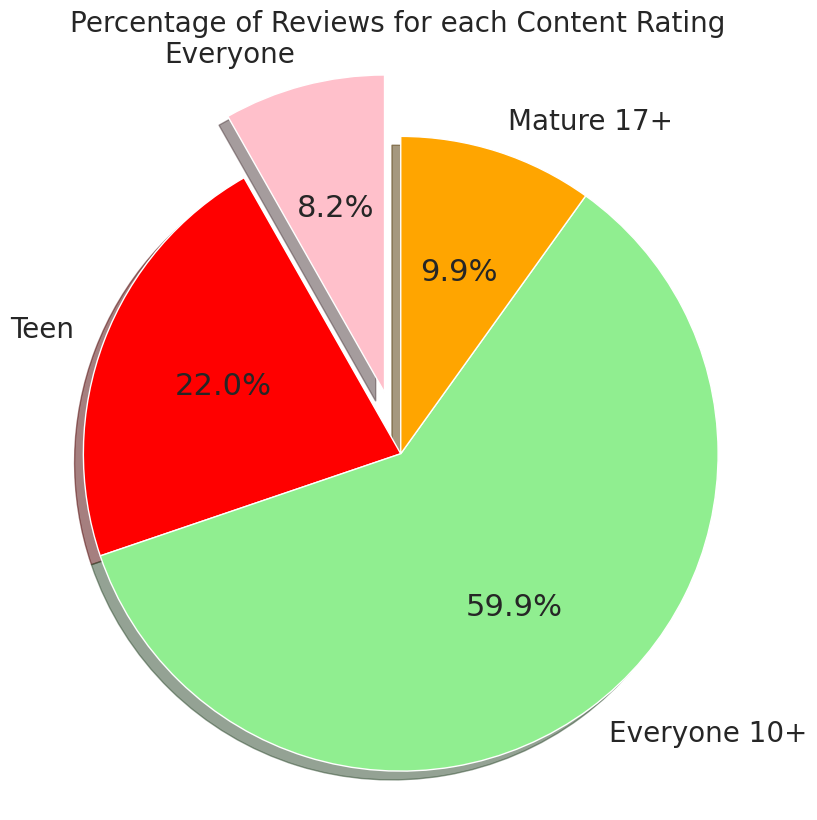

In [214]:
labels=google_apps['Content Rating'].unique()
explode = (0.2, 0, 0,0)
size=list()
# set lables
for content in labels:
    size.append(google_apps[google_apps['Content Rating']==content]['Reviews'].mean())
# set figure size
plt.figure(figsize=(10,10))
# set colors
colors = ['pink','red','lightgreen','orange', 'lightblue','yellow']
# generate pie plot
plt.pie(size, explode=explode, labels=labels, colors=colors,autopct='%1.1f%%',
        shadow=True, startangle=90)
plt.axis('equal')
# title of the plot
plt.title('Percentage of Reviews for each Content Rating',size = 20)
# display plot
plt.show()

We can conclude from the pie plot that children and young people wrote more reviews. By plotting the pie chart of percentage of reviews for each group, we can see that Teens and Everyone 10+ write a lot of reviews. This shows most applications are used by young people and they are the main target users for app developers.

## Ratings of each genre

In [215]:
# group by genre and mean of rating and sort by rating
google_apps[['Genres', 'Rating']].groupby(['Genres'], as_index=False).mean().sort_values('Rating')

,Genres,Rating
74,Parenting;Brain Games,3.80
61,Health & Fitness;Action & Adventure,3.90
12,Art & Design;Pretend Play,3.90
44,Educational,3.93
47,Educational;Creativity,3.96
...,...,...
84,Puzzle;Education,4.60
53,Entertainment;Creativity,4.65
62,Health & Fitness;Education,4.70
34,Comics;Creativity,4.80


In [216]:
# describe - statistical summary
google_apps[['Genres', 'Rating']].groupby(['Genres'], as_index=False).mean().describe()

,Rating
count,115.00
mean,4.25
std,0.18
min,3.80
25%,4.13
50%,4.25
75%,4.34
max,4.80


Based on the standard deviation we got, genre does not affect rating too much.

## Boxenplot of rating vs genres

Text(0.5, 1.0, 'Boxenplot of Rating VS Genres')

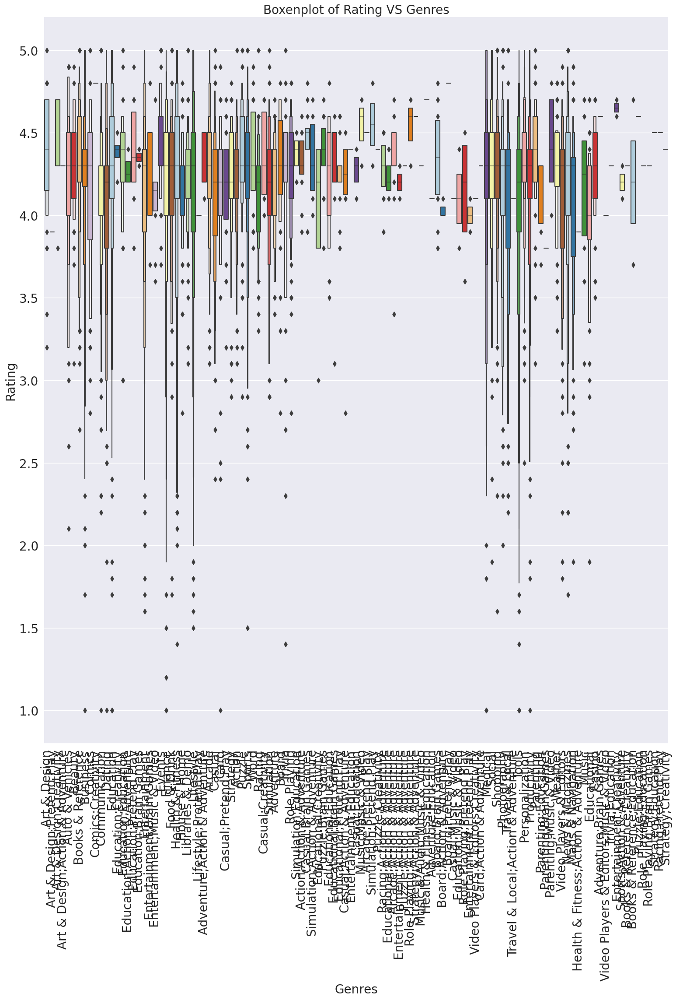

In [217]:
genre = sns.catplot(x="Genres",y="Rating",data=google_apps, kind="boxen", height = 18 ,palette = "Paired")
genre.despine(left=True)
#rotating x labels
genre.set_xticklabels(rotation=90)
# y label
genre = genre.set_ylabels("Rating")
# title of the boxenplot
plt.title('Boxenplot of Rating VS Genres',size = 20)

From the boxenplot we cannot say that genres have strong relationship with ratings.

But we can see that the genre of Comics;Creativity and Board;Pretend Play got highest rating and genre Parenting;Brain Games got lowest rating.


## Barplot of Android Version after grouping by Rating.

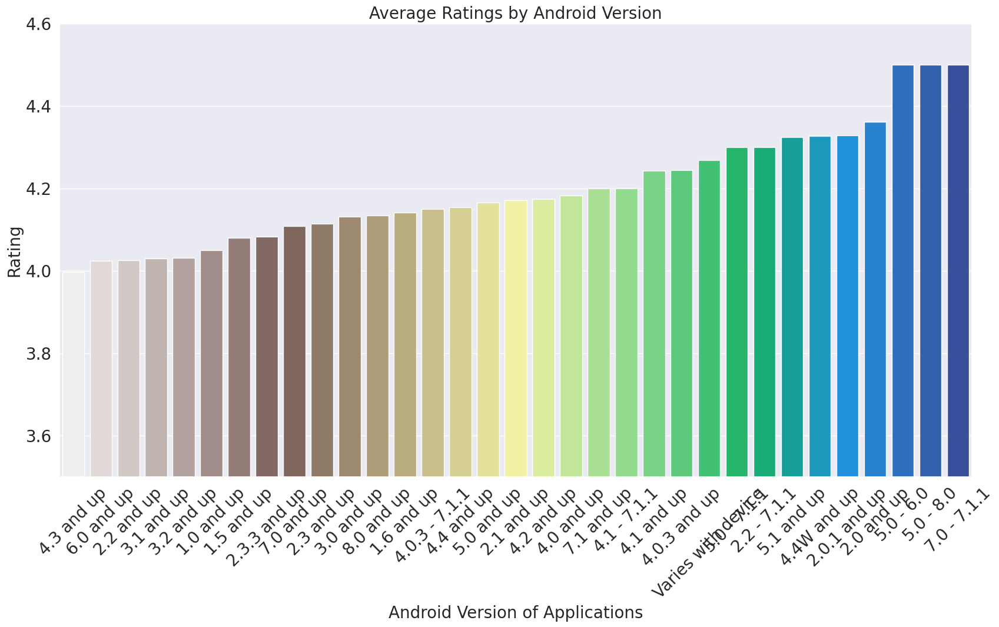

In [218]:
result5 = google_apps.groupby(["Android Ver"])['Rating'].aggregate(np.mean).reset_index().sort_values('Rating')
#set size of the plot figure
plt.figure(figsize=(20,10))
#generate bar plot
sns.barplot(x=google_apps['Android Ver'], y=google_apps.Rating, ci=None, order=result5['Android Ver'],palette="terrain_r")
#rotating x labels
plt.xticks(rotation = 45)
# y limit
plt.ylim(3.5,4.6)
# x label
plt.xlabel('Android Version of Applications',size=20)
# y label
plt.ylabel('Rating',size=20)
# title of plot
plt.title('Average Ratings by Android Version',size=20)
 # shwow the plot
plt.show()

Based on the barplot, we cannot see the relationship between ratings and current android version of applications.Based on the barplot, we cannot conclude the
relationship between "Rating" and current android version of applications since each application
has its own progress on updating the version. So the comparison of versions across all
applications does not make sense.

## Wordcloud for Reviews

In [219]:
# taking Translated_Review with nulls
review_notnull = userreviews[userreviews['Translated_Review'].notnull()]

In [222]:
# using word cloud generating image with frequent words
text = review_notnull.Translated_Review.values
wordcloud = WordCloud(
    width = 3000,
    height = 2000,
    background_color = '#FFFFFF',
    stopwords = STOPWORDS).generate(str(text).lower())
fig = plt.figure(
    figsize = (40, 30),
    facecolor = 'k',
    edgecolor = 'k')
plt.imshow(wordcloud, interpolation = 'bilinear')
plt.axis('off')
plt.tight_layout(pad=0)
plt.show()

NameError: name 'WordCloud' is not defined

In [223]:
# taking percentage of each values
positive_review_df = (userreviews[userreviews.Sentiment == 'Positive'].count().iloc[0] / userreviews['Sentiment'].count() * 100).round()
negative_review_df = (userreviews[userreviews.Sentiment == 'Negative'].count().iloc[0] / userreviews['Sentiment'].count() * 100).round()
neutral_review_df = (userreviews[userreviews.Sentiment == 'Neutral'].count().iloc[0] / userreviews['Sentiment'].count() * 100).round()

positive_review_df, negative_review_df, neutral_review_df

(64.0, 21.0, 15.0)

The percentages of positives, negative and neutral reviews are 64%, 21% and 15% respectively.

## Does sentiment_subjectivity proportional to sentiment_polarity?

In [224]:
# group by category and then take mean of Sentiment_Polarity,Sentiment_Subjectivity and then rest index and rename attributes
sentimet_subjectivity_polarity = apps_reviews.groupby(['Category'])['Sentiment_Polarity','Sentiment_Subjectivity'].mean().reset_index().rename(columns={'Sentiment_Polarity':'Sentiment_polarity_avg','Sentiment_Subjectivity':'sentiment_subjectivity_avg'})

In [225]:
# taking absolute values
apps_reviews['Sentiment_Subjectivity'] = apps_reviews['Sentiment_Subjectivity'].abs()

In [226]:
# taking absolute vlaues
apps_reviews['Sentiment_Polarity'] = apps_reviews['Sentiment_Polarity'].abs()

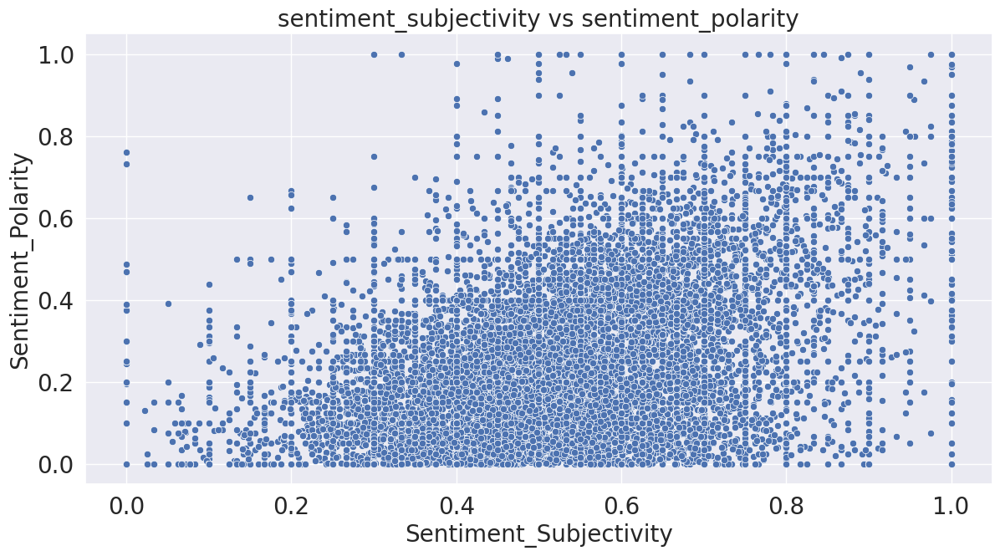

In [227]:
# set figure size of the plot
plt.figure(figsize=(14,7))
# generate scatterplot
sns.scatterplot(apps_reviews['Sentiment_Subjectivity'], apps_reviews['Sentiment_Polarity'])
# title of the plot
plt.title("sentiment_subjectivity vs sentiment_polarity",size=20)
# x label with size
plt.xlabel('Sentiment_Subjectivity',size=20)
# y label with size
plt.ylabel('Sentiment_Polarity',size=20)
# display plot
plt.show()

From the above scatter plot it can be concluded that sentiment subjectivity is not always proportional to sentiment polarity but in maximum number of case, shows a proportional behavior, when variance is too high or low

In [228]:
# taking unique android version values
google_apps['Android Ver'].unique()

array(['4.0.3 and up', '4.2 and up', '4.4 and up', '2.3 and up',
       '3.0 and up', '4.1 and up', '4.0 and up', '2.2 and up',
       '5.0 and up', '6.0 and up', '1.6 and up', '2.1 and up',
       '5.1 and up', '1.5 and up', '7.0 and up', '4.3 and up',
       '4.0.3 - 7.1.1', '2.0 and up', '2.3.3 and up',
       'Varies with device', '3.2 and up', '4.4W and up', '7.1 and up',
       '7.0 - 7.1.1', '8.0 and up', '5.0 - 8.0', '3.1 and up',
       '2.0.1 and up', '4.1 - 7.1.1', nan, '5.0 - 6.0', '1.0 and up',
       '2.2 - 7.1.1', '5.0 - 7.1.1'], dtype=object)

In [229]:
# replacing string with numbers
google_apps['Android Ver'].replace(to_replace=['4.4W and up','Varies with device'], value=['4.4','1.0'],inplace=True)
google_apps['Android Ver'].replace({k: '1.0' for k in ['1.0','1.0 and up','1.5 and up','1.6 and up']},inplace=True)
google_apps['Android Ver'].replace({k: '2.0' for k in ['2.0 and up','2.0.1 and up','2.1 and up','2.2 and up','2.2 - 7.1.1','2.3 and up','2.3.3 and up']},inplace=True)
google_apps['Android Ver'].replace({k: '3.0' for k in ['3.0 and up','3.1 and up','3.2 and up']},inplace=True)
google_apps['Android Ver'].replace({k: '4.0' for k in ['4.0 and up','4.0.3 and up','4.0.3 - 7.1.1','4.1 and up','4.1 - 7.1.1','4.2 and up','4.3 and up','4.4','4.4 and up']},inplace=True)
google_apps['Android Ver'].replace({k: '5.0' for k in ['5.0 - 6.0','5.0 - 7.1.1','5.0 - 8.0','5.0 and up','5.1 and up']},inplace=True)
google_apps['Android Ver'].replace({k: '6.0' for k in ['6.0 and up']},inplace=True)
google_apps['Android Ver'].replace({k: '7.0' for k in ['7.0 - 7.1.1','7.0 and up','7.1 and up']},inplace=True)
google_apps['Android Ver'].replace({k: '8.0' for k in ['8.0 and up']},inplace=True)
google_apps['Android Ver'].fillna('1.0', inplace=True)

Category           Android Ver
ART_AND_DESIGN     4.0            51
                   2.0             8
                   3.0             2
                   5.0             1
AUTO_AND_VEHICLES  4.0            58
                                  ..
WEATHER            4.0            36
                   2.0            10
                   5.0             7
                   1.0             2
                   3.0             1
Name: Android Ver, Length: 190, dtype: int64


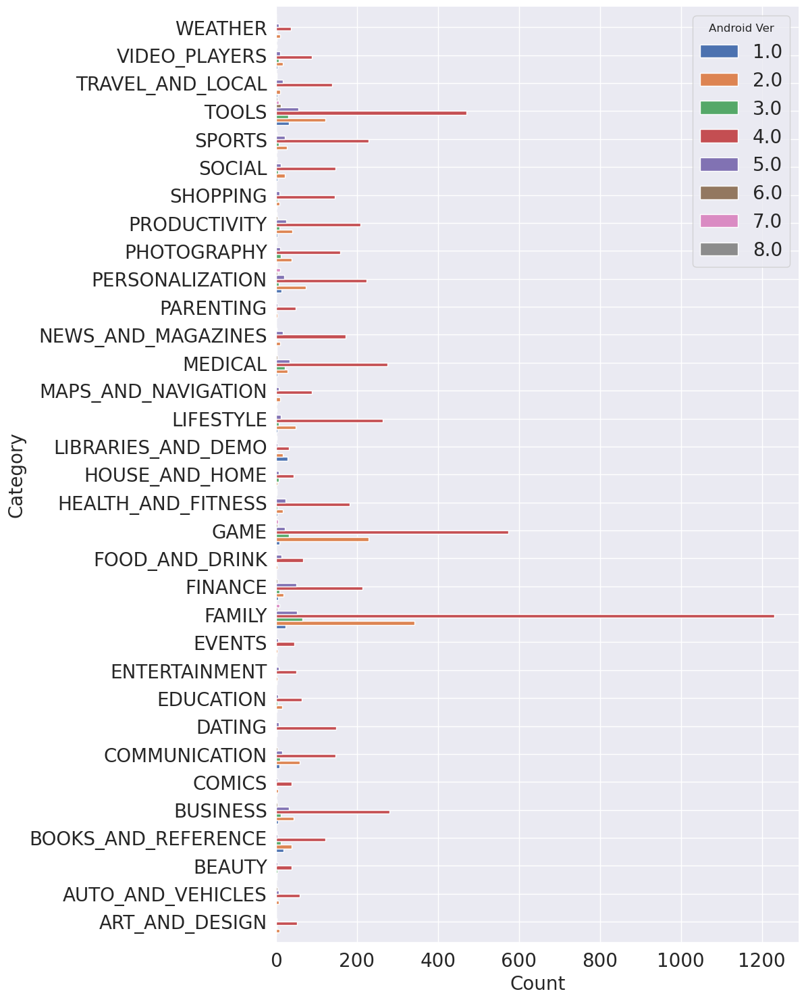

In [230]:
# print group by category and take android version count
print(google_apps.groupby('Category')['Android Ver'].value_counts())
# group by category and take android version count
Type_cat = google_apps.groupby('Category')['Android Ver'].value_counts().unstack().plot.barh(figsize=(10,18), width=1)
# x lable
plt.xlabel('Count')
# display plot
plt.show()

### Correlation of Price and Rating

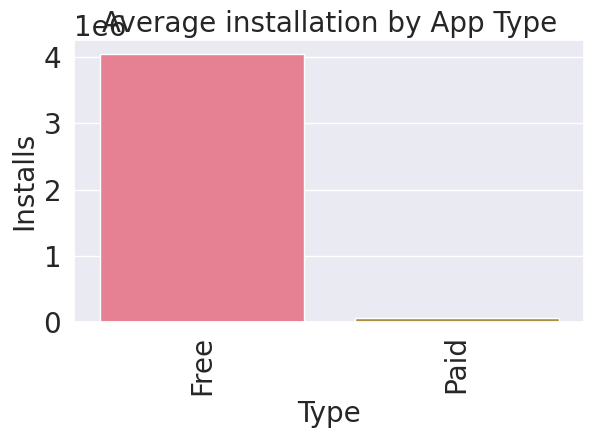

In [231]:
# Types of apps like Free or paid getting more Installs.
Installtype=google_apps.groupby('Type')['Installs'].mean().reset_index()
#Plotting the figure for Free and Paid app Installations count
plt.figure()
fig = sns.barplot(x=Installtype['Type'], y=Installtype['Installs'],palette=sns.set_palette("husl"))
fig.set_xticklabels(fig.get_xticklabels(),rotation=90)
plt.tight_layout()
plt.title('Average installation by App Type',size = 20)
plt.show(fig)

In [232]:
### Category vs Rating, Reviews, Installs, Price

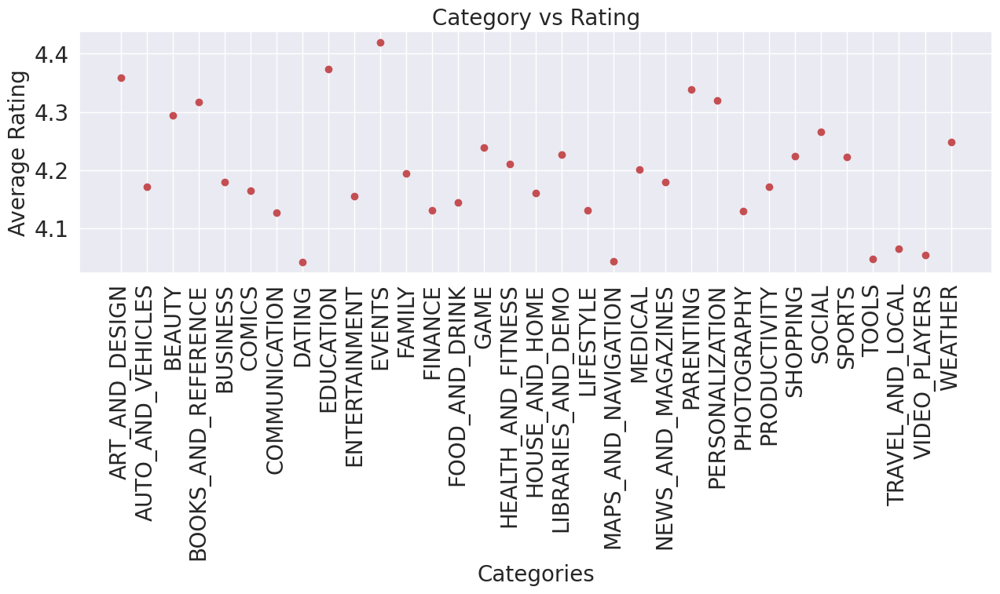

In [233]:
category_group = google_apps.groupby('Category')
R = category_group['Rating'].agg(np.mean)
P = category_group['Price'].agg(np.sum)
Re = category_group['Reviews'].agg(np.mean)
Ins = category_group['Installs'].agg(np.sum)
plt.figure(figsize=(15,4))
plt.plot(R,'ro')
plt.xticks(rotation=90)
plt.title('Category vs Rating')
plt.xlabel('Categories')
plt.ylabel('Average Rating')
plt.show()

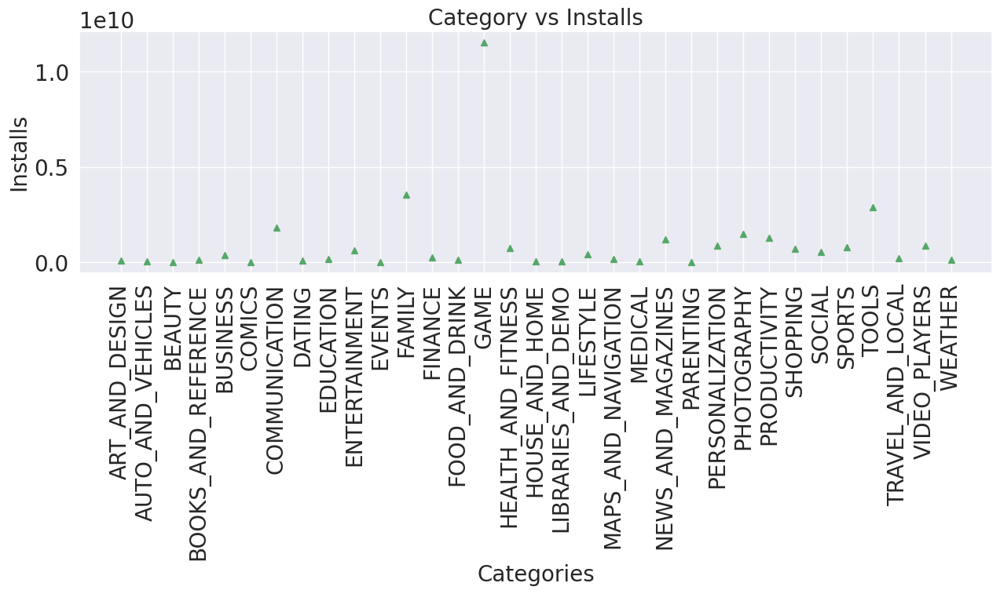

In [234]:
plt.figure(figsize=(15,4))
plt.plot(Ins, 'g^', color='g')
plt.xticks(rotation=90)
plt.title('Category vs Installs')
plt.xlabel('Categories')
plt.ylabel('Installs')
plt.show()

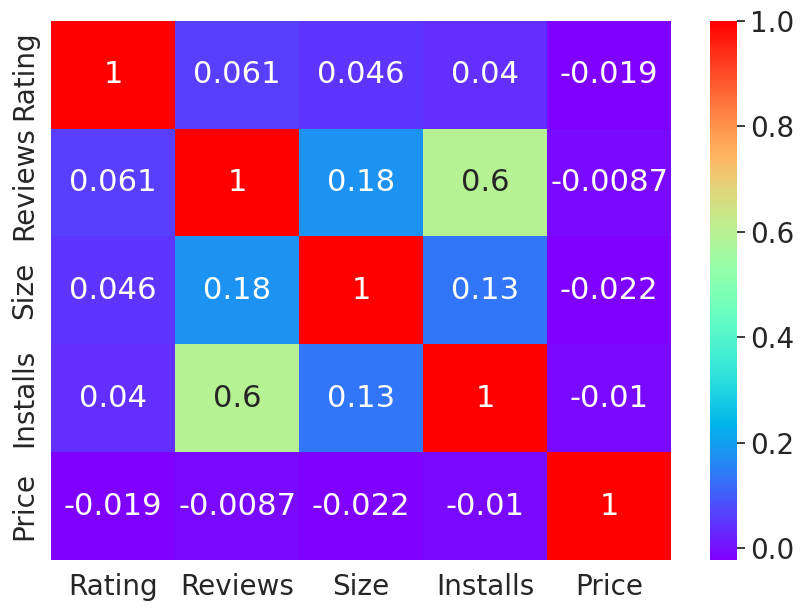

In [235]:
plt.figure(figsize = (10,7))
sns.heatmap(google_apps.corr(), annot = True, cmap  = 'rainbow')
plt.show()

### Which Category has maximum number of reviews submitted on Google Play Store

In [236]:
# there are some negative signs before('-') we will remove them 
def positive(column):
    for i in column:
        if i>0:
            return i
        else:
            return i*(-1)
google_apps['Reviews'] = google_apps[['Reviews']].apply(positive,axis=1)

In [237]:
category_reviews = google_apps['Reviews'].groupby(by = google_apps['Category']).sum().sort_values(ascending =False)
px.bar(google_apps, x = category_reviews.index, y = category_reviews.values, color = category_reviews.index,title="Maximum number of Reviews for Categories").update_layout(
    xaxis_title="Category",title_x=0.5, yaxis_title="Reviews count")

### Which Category has maximum average rating

In [238]:
category_rating = google_apps['Rating'].groupby(by = google_apps['Category']).mean().sort_values(ascending =False)
px.bar(google_apps, x=category_rating.index, y = category_rating.values, color = category_rating,title="Average Rating for Categories").update_layout(
    xaxis_title="Category",title_x=0.5, yaxis_title="Average Rating")

### Top Most Apps with the highest numbers of reviews.

Text(0.5, 1.0, 'Top Apps with Highest Number of Reviews')

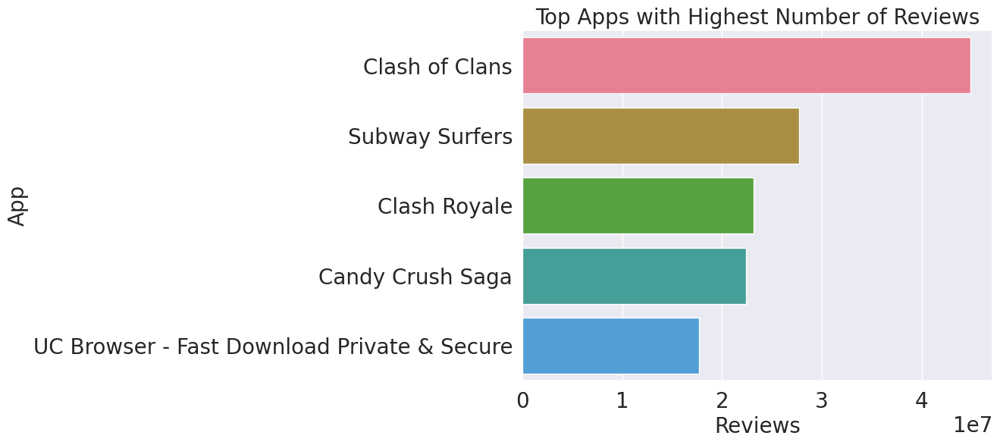

In [239]:
# We are going to sort "Reviews" column values so we can find the apps and there respective number of reviews

Top_reviews_app  = google_apps.sort_values(by='Reviews', ascending=False)
 # Top most reviewed 'App' in the play store
# we take the help of matplotlib library

highest_num_reviews_app = Top_reviews_app.sort_values("Reviews",ascending=False,ignore_index=True).head(5)
plt.figure(figsize=(8,6))
sns.barplot(x ="Reviews",y="App",data=highest_num_reviews_app);
plt.title("Top Apps with Highest Number of Reviews",fontsize=20)

### Is the Reviews are Fact Based or Opinion Based

findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.


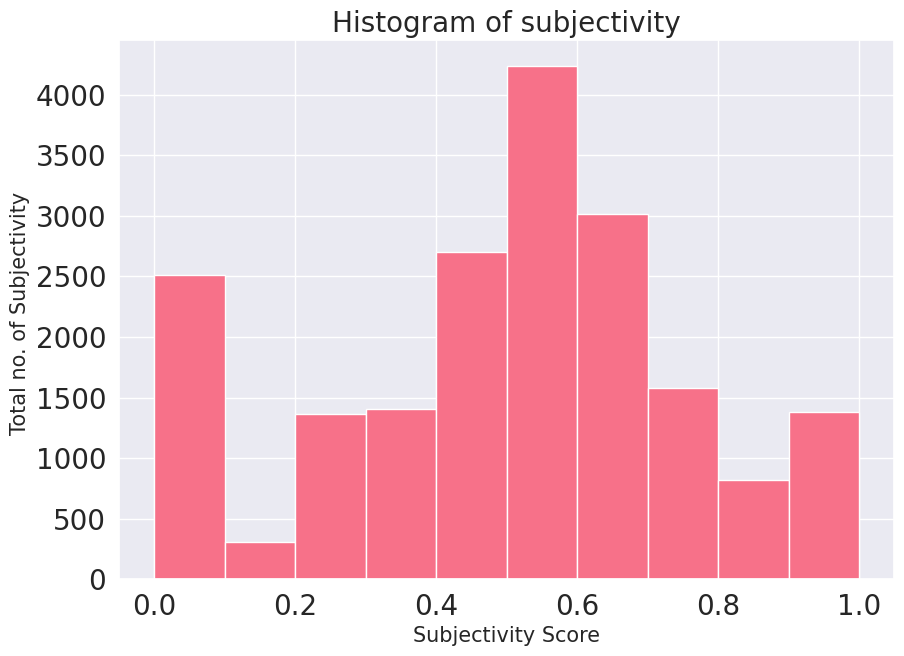

In [240]:
#Sentiment Subjectivity value counts
sentimentsub_apps_reviews = pd.DataFrame(apps_reviews['Sentiment_Subjectivity'].value_counts())

# Plot the figure with labels
plt.figure(figsize=(10,7))
plt.xlabel("Subjectivity Score",fontsize=15)
plt.ylabel("Total no. of Subjectivity ",fontsize=15)
plt.title("Histogram of subjectivity",fontsize=20)

# plotting the histrogram
plt.hist(apps_reviews[apps_reviews['Sentiment_Subjectivity'].notnull()]['Sentiment_Subjectivity']);

### Sentiment Polarity for Free & Paid apps

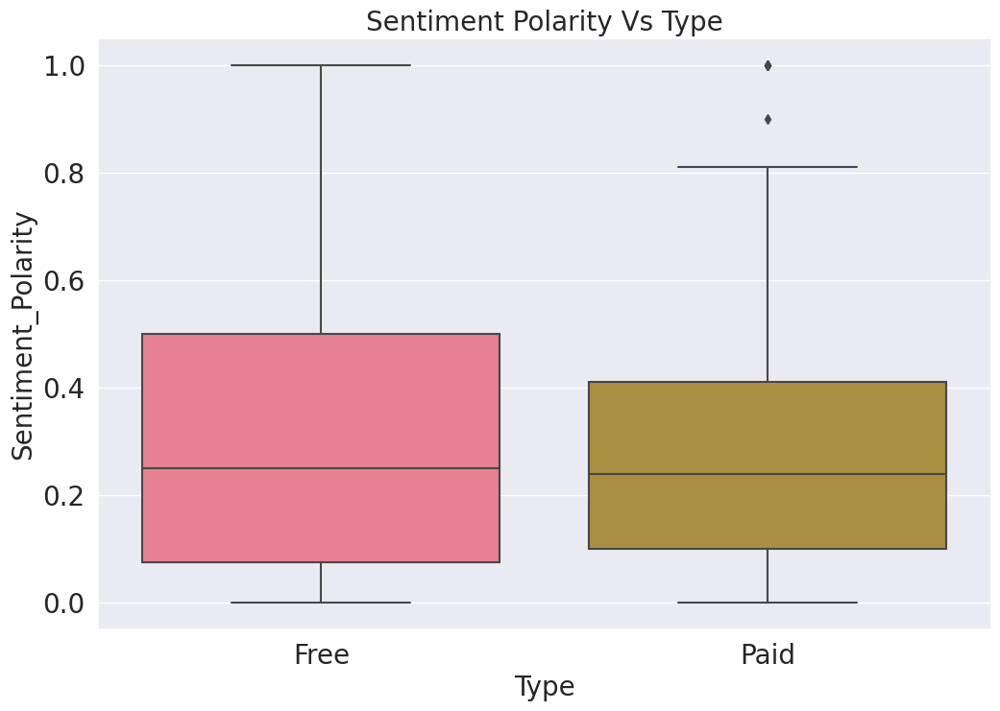

In [241]:
#Sentiment ploarity value counts
sentimentalpolarity_apps = apps_reviews.groupby(['Type'])['Sentiment_Polarity'].count()
#Plot the figure with labels
fig, ax = plt.subplots()
fig.set_size_inches(12, 8)
ax = sns.boxplot(x = 'Type', y = 'Sentiment_Polarity', data = apps_reviews)
ax.set_title('Sentiment Polarity Vs Type',fontsize=20)
plt.show()

### Game analysis

In [242]:
# filtering the data to game category
Permission = Permission[Permission['Main Category'] == 'Game']

In [243]:
font = {'family' : 'normal',
        'weight' : 2,
        'size'   : 15}
plt.rcParams['axes.facecolor'] = 'white'
plt.rc('font', **font)
plt.rc('axes', labelsize=17, titlesize=20)
Permission['App Age'] = Permission.LU_year - Permission.Released_year

findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.
findfont: Font family ['normal'] not found. Falling back to DejaVu Sans.


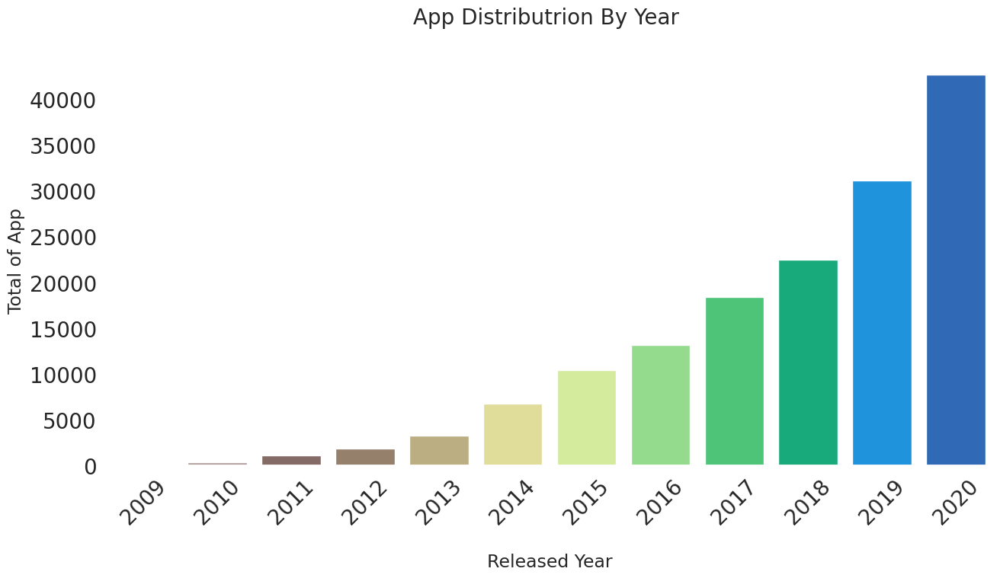

In [244]:
# setting the size of the figure for the plot
plt.figure(figsize=(15,7))
# generate count plot 
sns.countplot(data=Permission[Permission.Released_year != 2021],
             x='Released_year',palette="terrain_r")
# rotating the labes on x - axis
plt.xticks(rotation=45)
# y label
plt.ylabel('Total of App')
# title of the plot
plt.title('App Distributrion By Year \n')
# x label
plt.xlabel('\nReleased Year')
# display the plot
plt.show()

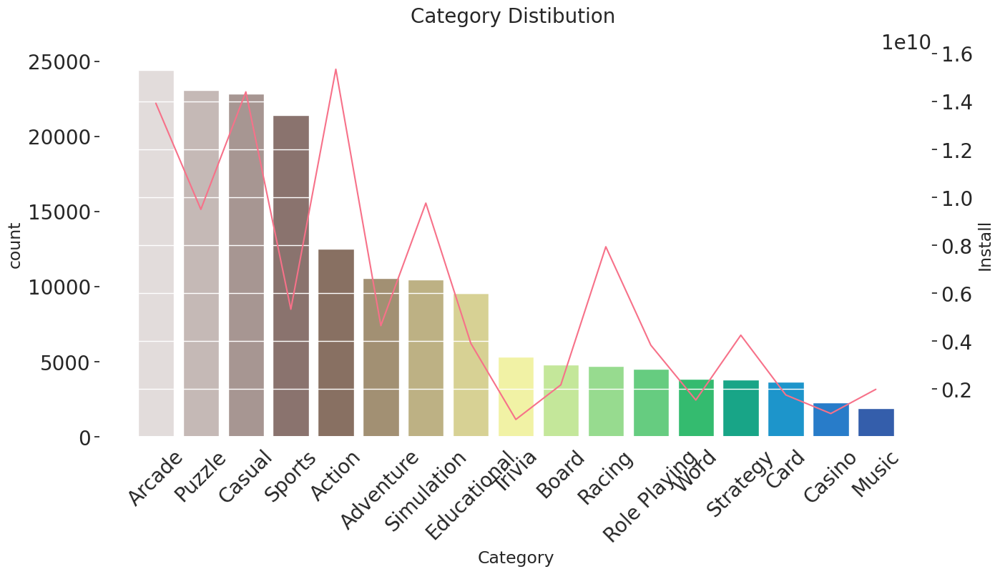

In [245]:
# set the size of the figure for the plot
plt.figure(figsize=(15,7))
# generate count plot
sns.countplot(data=Permission, x='Category', order=Permission.Category.value_counts().index , palette="terrain_r")
# rotating x axis labels
plt.xticks(rotation=45)
# plot a graph on top on another graph
plt.twinx()
# group by category and installations
dataplot = Permission.groupby('Category')['Install'].sum().loc[list(Permission.Category.value_counts().index)]
# generate the lineplot
sns.lineplot(data=dataplot.reset_index(),x='Category',y='Install')
# rotate x lables
plt.xticks(rotation=45)
# title of the plot
plt.title('Category Distibution \n')
plt.show()

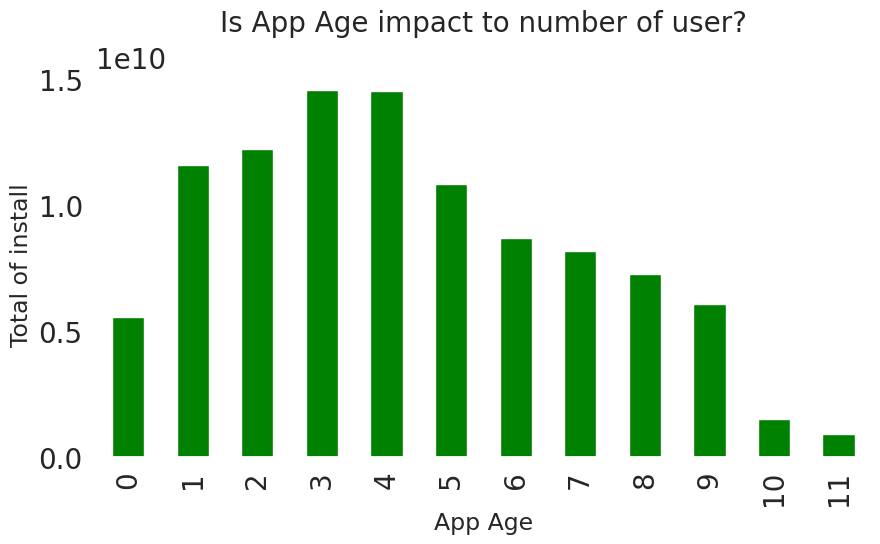

In [246]:
# set the size of the figure for the plot
plt.figure(figsize=(10,5))
# group by app age and then take sum of installs then plot the values
Permission.groupby('App Age')['Install'].sum().plot(kind='bar',
                                                    xlabel = 'App Age',
                                                    ylabel = 'Total of install',color='green')
# title of the plot
plt.title('Is App Age impact to number of user?\n')
# display the plot
plt.show()

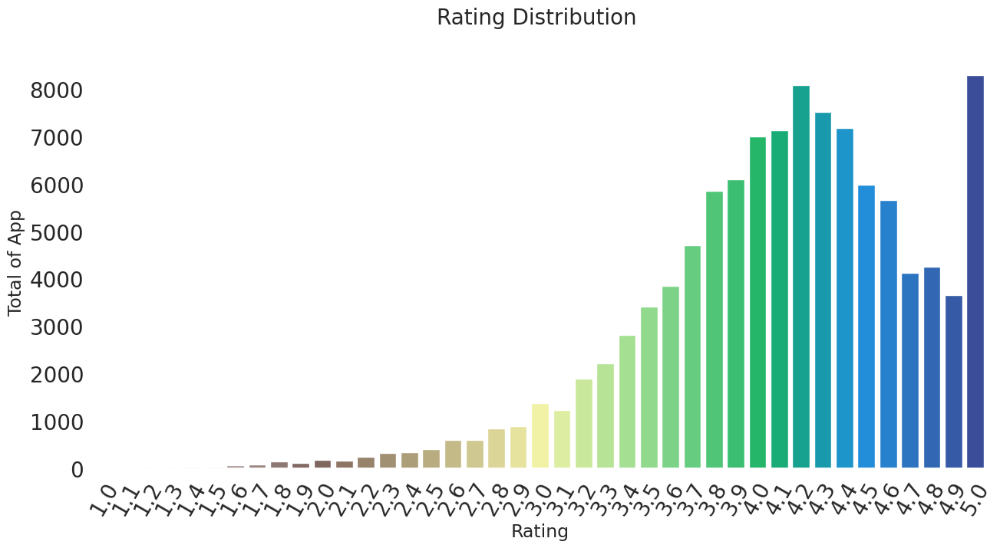

In [247]:
# set the size of the figure for the plot
plt.figure(figsize=(15,7))
# Generate count plot
sns.countplot(data=Permission[Permission.Rating != 0],x='Rating',palette="terrain_r")
# rotate x axis labels
plt.xticks(rotation=60)
# y axis label
plt.ylabel('Total of App')
# title for the plot
plt.title('Rating Distribution \n')
# display plot
plt.show()

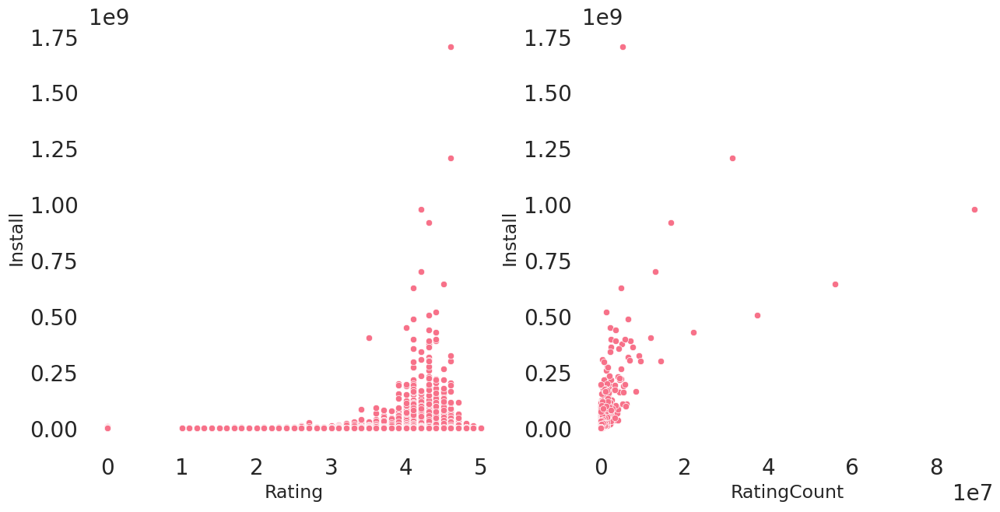

In [248]:
# set the size of the figure for the plot
plt.figure(figsize=(15,7))
# font = {'family' : 'normal',
#         'weight' : 2,
#         'size'   : 10}
# setting plot
plt.rc('font', **font)        
# plt.rc('axes', labelsize=15, titlesize=17)
# creating subplot with m*n grid with plot at position p
plt.subplot(121)
# generate the scatter plot
sns.scatterplot(x="Rating", y="Install" , sizes=(0, 30), data=Permission);
# setting position for the scatter plot 
plt.subplot(122)
# generate the scatter plot
sns.scatterplot(data=Permission, x='RatingCount', y='Install')
# display plot
plt.show()

In [283]:
list(Permission.columns)

['App Id',
 'App',
 'Main Category',
 'Category',
 'Rating',
 'RatingCount',
 'Install',
 'Price',
 'Size',
 'Develop_Id',
 'Released',
 'Last_Updated',
 'Content Rating',
 'Ad_Supported',
 'In_App_Purchases',
 'Editors_Choice',
 'Released_day',
 'Released_month',
 'Released_year',
 'LU_day',
 'LU_month',
 'LU_year',
 'App Age',
 'Install Per Year',
 'Type',
 'PriceRange',
 'RatingType',
 'InstallRange']

In [284]:
Install_Cat_Model=Permission
list(Permission.columns)

['App Id',
 'App',
 'Main Category',
 'Category',
 'Rating',
 'RatingCount',
 'Install',
 'Price',
 'Size',
 'Develop_Id',
 'Released',
 'Last_Updated',
 'Content Rating',
 'Ad_Supported',
 'In_App_Purchases',
 'Editors_Choice',
 'Released_day',
 'Released_month',
 'Released_year',
 'LU_day',
 'LU_month',
 'LU_year',
 'App Age',
 'Install Per Year',
 'Type',
 'PriceRange',
 'RatingType',
 'InstallRange']

In [252]:
# Below we care using pd.factorize, astype(int) to change the features into numeric values for the model
# because model doesnt accept any string formates into it

In [285]:
Install_Cat_Model['Category'] = pd.factorize(Install_Cat_Model['Category'])[0].astype(int)

Install_Cat_Model['Type'] = np.where(Install_Cat_Model['Free'] == True,'Free','Paid')
Install_Cat_Model.drop(['Free'],inplace=True,axis=1)

Install_Cat_Model['Type'] = pd.factorize(Install_Cat_Model['Type'])[0].astype(int)
Install_Cat_Model['Content Rating'] = pd.factorize(Install_Cat_Model['Content Rating'])[0].astype(int)
Install_Cat_Model['Ad_Supported'] = pd.factorize(Install_Cat_Model['Ad_Supported'])[0].astype(int)
Install_Cat_Model['Editors_Choice'] = pd.factorize(Install_Cat_Model['Editors_Choice'])[0].astype(int)
Install_Cat_Model['In_App_Purchases'] = pd.factorize(Install_Cat_Model['In_App_Purchases'])[0].astype(int)

Install_Cat_Model['PriceRange'] = pd.cut(Install_Cat_Model['Price'],bins=[0,0.19,9.99,29.99,410],labels=['Free','Low','Mid','High'],include_lowest=True)
#dummies = pd.get_dummies(df['PriceRange'],prefix='Price')
#df = df.join(dummies)
Install_Cat_Model['PriceRange'].value_counts()


#Reason to add/build a new column which catergories the column which you wanna predict is to reduced the load on the model so that it can
# can work on points/boundaries wich we set... instead of making every pointer to a boundary.
# also help us in mapping confusion matrix to evaluate the model better


#You can remove this if you want to, because we dont have much use of this "RatingType" causing I think we dropped it later.

#only reason we are making different data frame for the installs_range and rating_range is to keep it clean and less confusing 

Install_Cat_Model['RatingType'] = 'NoRating'
Install_Cat_Model.loc[(Install_Cat_Model['RatingCount'] > 0) & (Install_Cat_Model['RatingCount'] <= 500000.0),'RatingType'] = 'Up to 500K'
#Install_Cat_Model.loc[(Install_Cat_Model['RatingCount'] > 10000) & (Install_Cat_Model['RatingCount'] <= 500000.0),'RatingType'] = 'Between 10K and 500K'
Install_Cat_Model.loc[(Install_Cat_Model['RatingCount'] > 500000) & (Install_Cat_Model['RatingCount'] <= 138557570.0),'RatingType'] = 'More than 500K'
Install_Cat_Model.RatingType.value_counts()

Install_Cat_Model['RatingType'] = pd.factorize(Install_Cat_Model['RatingType'])[0].astype(int)
Install_Cat_Model['PriceRange'] = pd.factorize(Install_Cat_Model['PriceRange'])[0].astype(int)

In [286]:
#Install_Cat_Model['InstallRange'] = '0-100000'
Install_Cat_Model.loc[(Install_Cat_Model['Install'] >= 0) & (Install_Cat_Model['Install'] <= 10000000),'InstallRange'] = '0-10000000'
#Install_Cat_Model.loc[(Install_Cat_Model['Install'] > 1000000) & (Install_Cat_Model['Install'] <= 10000000),'InstallRange'] = '1000000-10000000'
Install_Cat_Model.loc[(Install_Cat_Model['Install'] > 10000000) & (Install_Cat_Model['Install'] <= 1000000000),'InstallRange'] = '10000000-1000000000'
#Install_Cat_Model.loc[(Install_Cat_Model['Install'] > 100000000) & (Install_Cat_Model['Install'] <= 1000000000),'InstallRange'] = '100000000-1000000000'
Install_Cat_Model.loc[(Install_Cat_Model['Install'] > 1000000000) & (Install_Cat_Model['Install'] <= 10000000000),'InstallRange'] = '1000000000-10000000000'

Install_Cat_Model.InstallRange.value_counts()

Install_Cat_Model['InstallRange'] = pd.factorize(Install_Cat_Model['InstallRange'])[0].astype(int)

In [287]:
Install_Cat_Model.InstallRange.value_counts()
RatingCount_Cat_Model = Install_Cat_Model

In [288]:
# X is your features list
# Y is your target Variable what you are trying to predict

# when you know what you are trying to predict then it is called as supervised learning (do change if this doesnt make sense or 
# if it is not correct)

#Note: Never Put the column that you are trying predict or something that is closly/directly related to it.. in feature (i.e "x").
# If you are trying to predict ratingtype and you keep it in features(i.e 'x') they model might get 100% accuray while is false 
# or incorrect way to build a model

# there are other concepts like over fiting and under fiting of the model to get more accuracy (need to explore if required or interested)
X = Install_Cat_Model.drop(['App','Size','Released' ,'Type','Last_Updated','Released_day',
 'Released_month',
 'Released_year',
 'LU_day',
 'LU_month',
 'LU_year',
 'App Age',
 'Install Per Year','App Id'],axis=1)
#y = dfm['RatingType'].values
y = Install_Cat_Model['InstallRange'].values

#'RatingCount'
#'RatingType'

In [289]:
# this might through error but it will about the column which is not present, so what we can do is remove the column from the
# below list so that it wont through error or exception
# To check the list of columns/features available you can always look up with this "list(X.columns)". so that you will know what 
# are present and what are not there.

#Note: Don't try to run this line twice because in the first run it will remove the columns and next time it will throw error 
#saying that it cant find the column

X = X.drop(['RatingType','InstallRange','Develop_Id','Main Category','Install','RatingCount'],axis=1)

In [290]:
list(X.columns)

['Category',
 'Rating',
 'Price',
 'Content Rating',
 'Ad_Supported',
 'In_App_Purchases',
 'Editors_Choice',
 'PriceRange']

In [291]:


number = preprocessing.LabelEncoder()
#X['Install'] = number.fit_transform(X.Install)

scaler = StandardScaler()
#X['Install'] = scaler.fit_transform(X[['Install']])

# This is method can be used to pass in the column and convert them to numeric values so the model wont throw erorr.
# As we alread converted the data in to numeric, this is not necessary at the momment

#from sklearn import preprocessing
#def convert(data):
    #number = preprocessing.LabelEncoder()
    #data['Employer_Name'] = number.fit_transform(data.Employer_Name)
    #data['Source'] = number.fit_transform(data.Source)
    #data=data.fillna(-999)
    #return data

In [292]:
# For reference below are the features that present when i ran the model
# if you dont get same rsults when you run it, just try to keeps the features i.e "X" as below and try it
#['Category','Rating','Price','Content Rating','Ad_Supported','In_App_Purchases','Editors_Choice','PriceRange']

In [293]:
#Here we are splitting the code into train data and test data using "train_test_split"
# (X,y) (features, traget) 
# stratify this is to preserve the proportion of target as in original dataset below
# we have "stratify=y", that means in train & test datasets the target proportion
# below method returns 70:30 split (Train:Test) because we have set test_size=0.3, 
# i.e the test_size is to determine the split proportion
# random_state is to set the randomness of the train:test generation each time the slipt function runs
# if we set 0 every it will be the same but if we change it. it will produce %randomness in the produced set 

X_train,X_test,y_train,y_test = train_test_split(X,y,stratify=y,test_size=0.3,random_state=20)

X_train.shape,X_test.shape,y_train.shape,y_test.shape

((118939, 8), (50974, 8), (118939,), (50974,))

Accuracy = 98.99 %


(array([0, 1, 2]),
 [Text(0, 0, '1M'), Text(1, 0, '1-10M'), Text(2, 0, '10M-1B')])

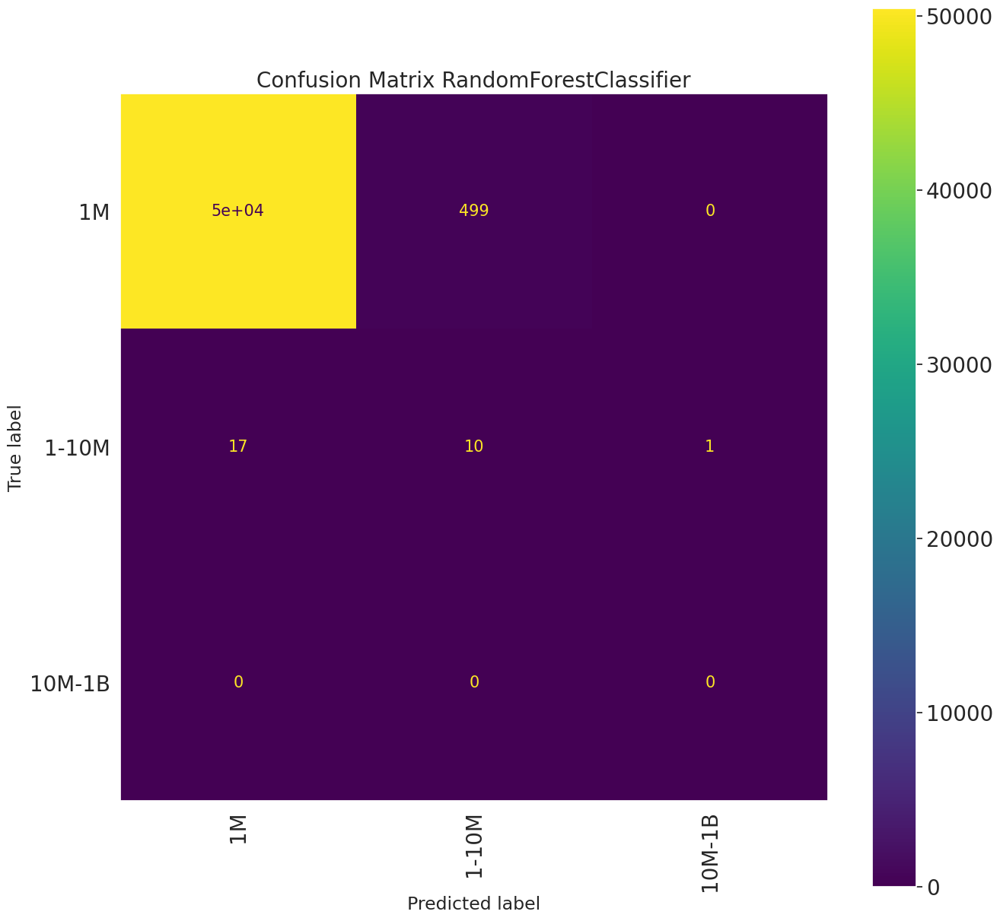

In [294]:
# A simple RandomForestClassifier without any parameter tuning
rf_model = RandomForestClassifier()
rf_model.fit(X_train,y_train)
y_pred = rf_model.predict(X_test)
rf_acc = accuracy_score(y_pred,y_test)*100
print("Accuracy =",round(rf_acc,2),"%")
cm = confusion_matrix(y_pred,y_test)

#Install_lbl= ['0-100000','100000-1000000','1000000-10000000','10000000-100000000','100000000-1000000000','1000000000-10000000000']
Install_lbl=['1M','1-10M','10M-1B']

cmd = ConfusionMatrixDisplay(cm,display_labels =['1M','1-10M','10M-1B'])
fig, ax = plt.subplots(figsize=(15,15));

plt.title("Confusion Matrix RandomForestClassifier")
cmd.plot(ax=ax);
plt.grid(False)
plt.xticks(rotation=90)

In [295]:
# If a question comes up what is parameter tuning or what are the parameters that can be tuned?
# List of parameters that can be tuned - learning_rate = 0.05, max_depth = 8, n_estimators = 400, verbose =1
# input values can be changed as per requirement which might increase or reduce the time taken to get prediction from the model
# We can do paramter tuning using gridsearchcv method from sklearn which at the end gives you best parameter which will help the tunning
# Example we can give a list of parameters and after running through all those thing "gridsearchcv" lets us know the 
# best parameters based on accurary or F1-score or what ever metric we choose. 
# param_grid = {
#    "learning_rate": [0.01,0.025, 0.05],
#    "max_depth":[5,8,10],
#    "n_estimators":[25, 50, 100],
#    "verbose":[1]
#    }

In [266]:
# Report

# This is to print out the report which will gives use other metrics like precision, f1-score, support scores 
# which will help us evaluate the model

target_names = Install_lbl
cr = classification_report(y_test,y_pred,target_names = target_names)
print("Classification Report for RandomForestClassifier")
print(cr)

Classification Report for RandomForestClassifier
              precision    recall  f1-score   support

          1M       0.99      1.00      0.99     50464
       1-10M       0.37      0.02      0.04       509
      10M-1B       0.00      0.00      0.00         1

    accuracy                           0.99     50974
   macro avg       0.45      0.34      0.34     50974
weighted avg       0.98      0.99      0.99     50974



Accuracy = 99.0 %


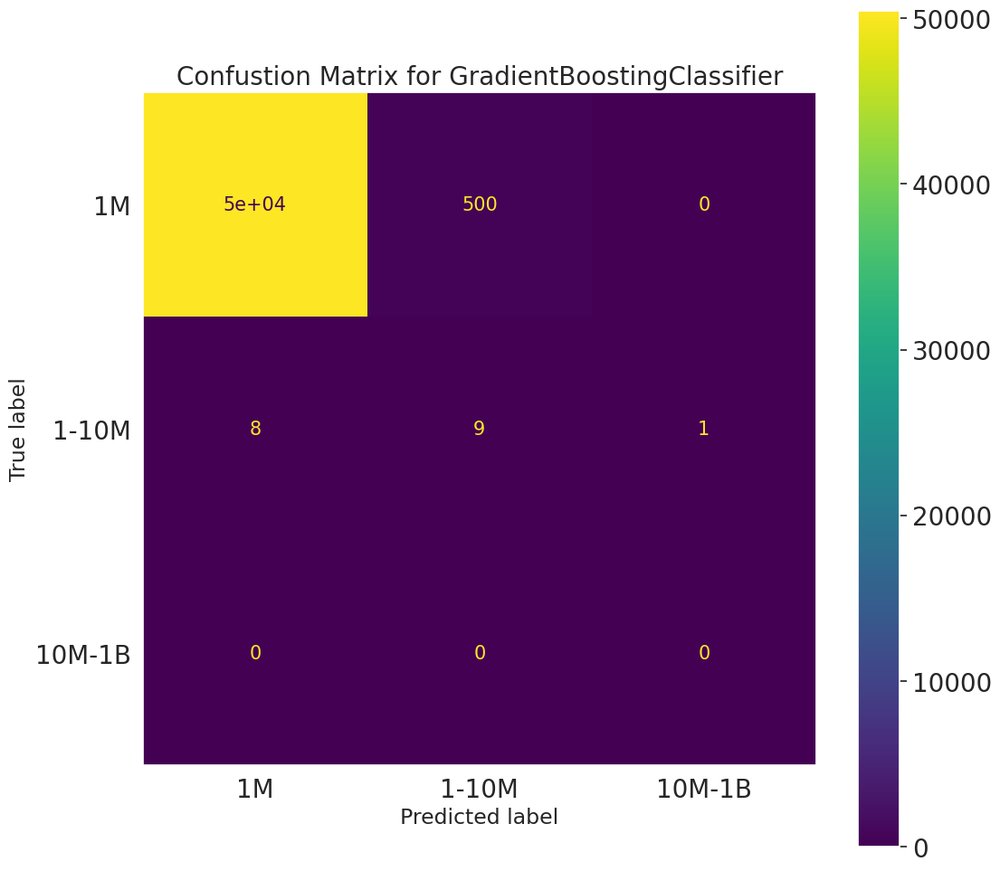

In [296]:
#Note : once a model is built (i.e "x" & "Y") we need to use the same for all the different classifiers. We should not change them
# so that we can compared and say we are not just relaying on single calssifer we are using multiple and we can compare their accuracy

#GradientBoostingClassifier


gb_model = GradientBoostingClassifier()
gb_model.fit(X_train,y_train)
y_pred = gb_model.predict(X_test)
gb_acc = accuracy_score(y_pred,y_test)*100
print("Accuracy =",round(gb_acc,2),"%")
cm = confusion_matrix(y_pred,y_test)

cmd = ConfusionMatrixDisplay(cm,display_labels =Install_lbl)
fig, ax = plt.subplots(figsize=(12,12));
plt.title("Confustion Matrix for GradientBoostingClassifier")
cmd.plot(ax=ax);
plt.grid(False)

In [297]:
#Report #Run time -3minutes:47seconds

target_names = Install_lbl
cr = classification_report(y_test,y_pred,target_names = target_names)
print("Classification Report for RandomForestClassifier")
print(cr)

Classification Report for RandomForestClassifier
              precision    recall  f1-score   support

          1M       0.99      1.00      0.99     50464
       1-10M       0.50      0.02      0.03       509
      10M-1B       0.00      0.00      0.00         1

    accuracy                           0.99     50974
   macro avg       0.50      0.34      0.34     50974
weighted avg       0.99      0.99      0.99     50974



LogisticRegression_accuracy: 0.9899948993604583


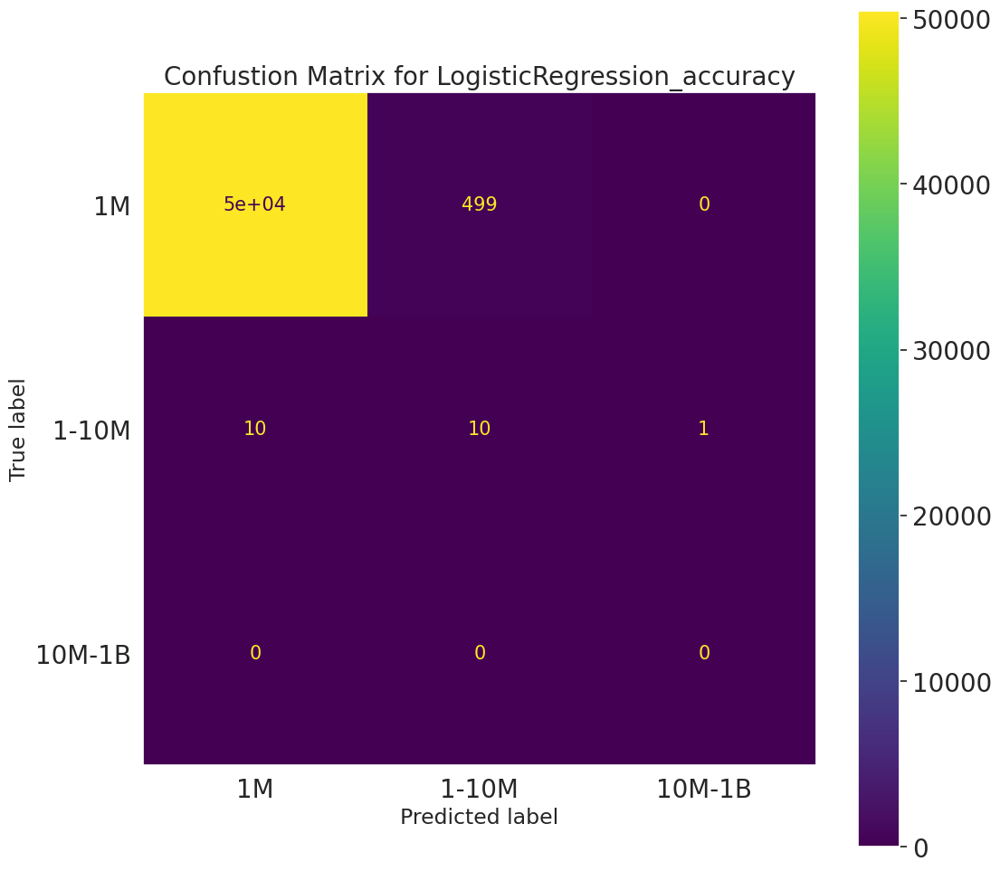

In [298]:
# LogisticRegression

lr_c=LogisticRegression(random_state=0)
lr_c.fit(X_train,y_train)
lr_pred=lr_c.predict(X_test)
lr_cm=confusion_matrix(lr_pred,y_test)
#cm = confusion_matrix(y_pred,y_test)

cmd = ConfusionMatrixDisplay(lr_cm,display_labels =Install_lbl)
fig, ax = plt.subplots(figsize=(12,12));
plt.title("Confustion Matrix for LogisticRegression_accuracy")
cmd.plot(ax=ax);
plt.grid(False)
lr_ac=accuracy_score(lr_pred, y_test)
print('LogisticRegression_accuracy:',lr_ac)

In [299]:
# Report #Run time - 25sec

target_names = Install_lbl
cr = classification_report(y_test,y_pred,target_names = target_names)
print("Classification Report for LogisticRegression")
print(cr)

Classification Report for LogisticRegression
              precision    recall  f1-score   support

          1M       0.99      1.00      0.99     50464
       1-10M       0.50      0.02      0.03       509
      10M-1B       0.00      0.00      0.00         1

    accuracy                           0.99     50974
   macro avg       0.50      0.34      0.34     50974
weighted avg       0.99      0.99      0.99     50974



In [300]:
list(RatingCount_Cat_Model.columns)

['App Id',
 'App',
 'Main Category',
 'Category',
 'Rating',
 'RatingCount',
 'Install',
 'Price',
 'Size',
 'Develop_Id',
 'Released',
 'Last_Updated',
 'Content Rating',
 'Ad_Supported',
 'In_App_Purchases',
 'Editors_Choice',
 'Released_day',
 'Released_month',
 'Released_year',
 'LU_day',
 'LU_month',
 'LU_year',
 'App Age',
 'Install Per Year',
 'Type',
 'PriceRange',
 'RatingType',
 'InstallRange']

In [301]:
# X is your features list
# Y is your target Variable what you are trying to predict

# when you know what you are trying to predict then it is called as supervised learning (do change if this doesnt make sense or 
# if it is not correct)

#Note: Never Put the column that you are trying predict or something that is closly/directly related to it.. in feature (i.e "x").
# If you are trying to predict ratingtype and you keep it in features(i.e 'x') they model might get 100% accuray while is false 
# or incorrect way to build a model

# there are other concepts like over fiting and under fiting of the model to get more accuracy (need to explore if required or interested)

X1 = RatingCount_Cat_Model.drop(['App','Size','Released' ,'Type','Last_Updated','Released_day',
 'Released_month',
 'Released_year',
 'LU_day',
 'LU_month',
 'LU_year',
 'App Age',
 'Install Per Year','App Id','RatingCount',
'RatingType'],axis=1)
y1 = RatingCount_Cat_Model['RatingType'].values

In [302]:
X1 = X1.drop(['Develop_Id','Main Category'],axis=1) # Droped the column "Main Category" because it is categorical variable which is string
# and model cant accept these kind of elemets in.
list(X1.columns)

['Category',
 'Rating',
 'Install',
 'Price',
 'Content Rating',
 'Ad_Supported',
 'In_App_Purchases',
 'Editors_Choice',
 'PriceRange',
 'InstallRange']

In [303]:
# Below commented part i.e LabelEncoder() and StandardScaler is to make the data of a column to 
# fit into model by converting them to numeric values if something in the column has string. 
# Below methods (LabelEncoder(),StandardScaler()) can be used to in case of any error occurs saying "String...."

In [304]:
X1 = X1.drop(['Rating'],axis=1)
number = preprocessing.LabelEncoder()
#X['Category'] = number.fit_transform(X.Category)

scaler = StandardScaler()
X1['Install'] = scaler.fit_transform(X1[['Install']])


# This is method can be used to pass in the column and convert them to numeric values so the model wont throw erorr.
# As we alread converted the data in to numeric, this is not necessary at the momment

#from sklearn import preprocessing
#def convert(data):
    #number = preprocessing.LabelEncoder()
    #data['Employer_Name'] = number.fit_transform(data.Employer_Name)
    #data['Source'] = number.fit_transform(data.Source)
    #data=data.fillna(-999)
    #return data

In [305]:
#Here we are splitting the code into train data and test data using "train_test_split"
# (X,y) (features, traget) 
# stratify this is to preserve the proportion of target as in original dataset below
# we have "stratify=y", that means in train & test datasets the target proportion
# below method returns 70:30 split (Train:Test) because we have set test_size=0.3, 
# i.e the test_size is to determine the split proportion
# random_state is to set the randomness of the train:test generation each time the slipt function runs
# if we set 0 every it will be the same but if we change it. it will produce %randomness in the produced set 
X_train,X_test,y_train,y_test = train_test_split(X1,y1,stratify=y,test_size=0.3,random_state=20)

X_train.shape,X_test.shape,y_train.shape,y_test.shape

((118939, 9), (50974, 9), (118939,), (50974,))

Accuracy = 79.72 %


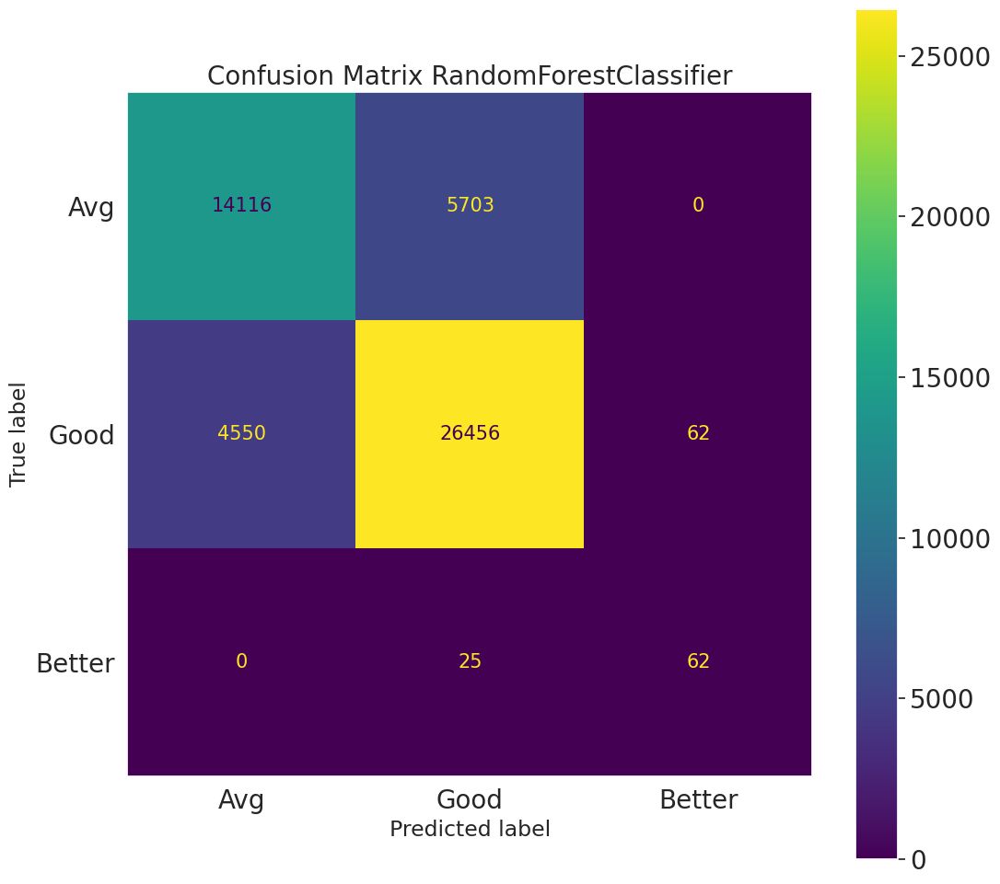

In [306]:
# A simple RandomForestClassifier without any parameter tuning

rf_model = RandomForestClassifier()
rf_model.fit(X_train,y_train)
y_pred = rf_model.predict(X_test)
rf_acc = accuracy_score(y_pred,y_test)*100 # Acurracy Score
print("Accuracy =",round(rf_acc,2),"%") # Acurracy 
cm = confusion_matrix(y_pred,y_test)

cmd = ConfusionMatrixDisplay(cm,display_labels =['Avg','Good','Better'])
fig, ax = plt.subplots(figsize=(12,12));
plt.title("Confusion Matrix RandomForestClassifier")
cmd.plot(ax=ax);
plt.grid(False)

In [307]:
# If a question comes up what is parameter tuning or what are the parameters that can be tuned?
# List of parameters that can be tuned - learning_rate = 0.05, max_depth = 8, n_estimators = 400, verbose =1
# input values can be changed as per requirement which might increase or reduce the time taken to get prediction from the model
# We can do paramter tuning using gridsearchcv method from sklearn which at the end gives you best parameter which will help the tunning
# Example we can give a list of parameters and after running through all those thing "gridsearchcv" lets us know the 
# best parameters based on accurary or F1-score or what ever metric we choose. 
# param_grid = {
#    "learning_rate": [0.01,0.025, 0.05],
#    "max_depth":[5,8,10],
#    "n_estimators":[25, 50, 100],
#    "verbose":[1]
#    }

In [308]:
# This is to print out the report which will gives use other metrics like precision, f1-score, support scores 
# which will help us evaluate the model

target_names = ['Avg','Good','Better']
cr = classification_report(y_test,y_pred,target_names = target_names)
print("Classification Report for RandomForestClassifier")
print(cr)

Classification Report for RandomForestClassifier
              precision    recall  f1-score   support

         Avg       0.71      0.76      0.73     18666
        Good       0.85      0.82      0.84     32184
      Better       0.71      0.50      0.59       124

    accuracy                           0.80     50974
   macro avg       0.76      0.69      0.72     50974
weighted avg       0.80      0.80      0.80     50974



Accuracy = 83.36 %


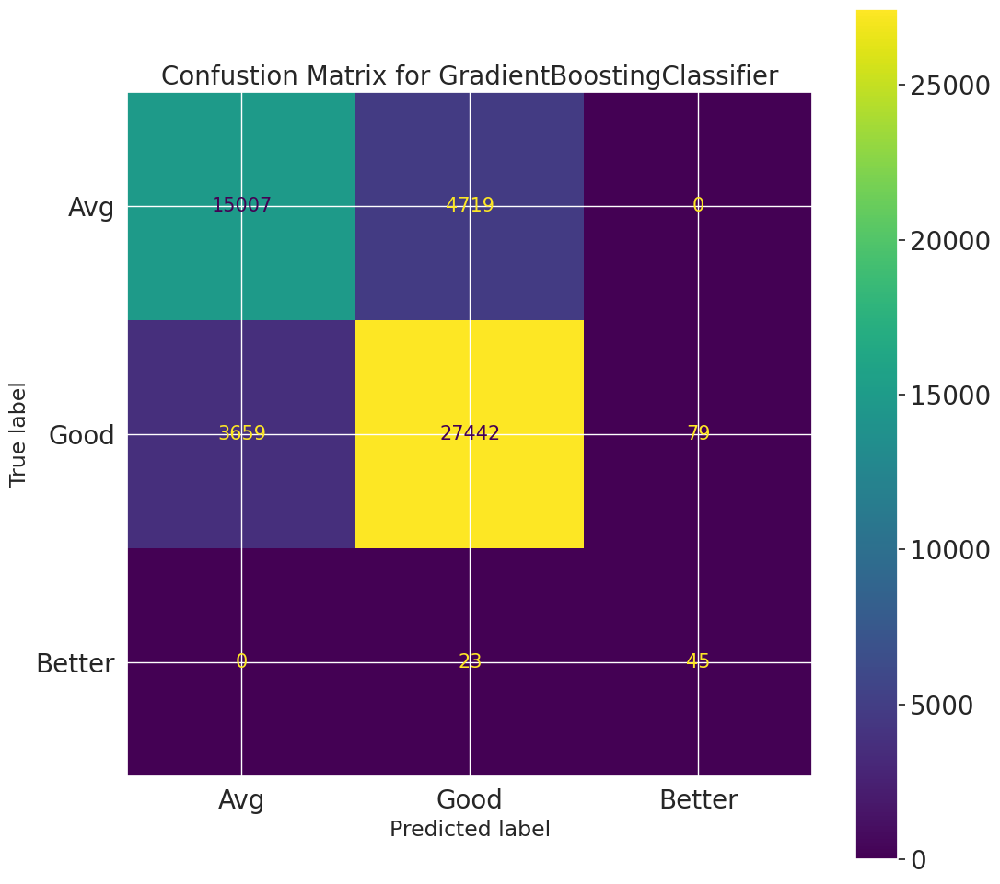

In [309]:
#Note : once a model is built (i.e "x" & "Y") we need to use the same for all the different classifiers. We should not change them
# so that we can compared and say we are not just relaying on single calssifer we are using multiple and we can compare their accuracy

#GradientBoostingClassifier

gb_model = GradientBoostingClassifier()
gb_model.fit(X_train,y_train)
y_pred = gb_model.predict(X_test)
gb_acc = accuracy_score(y_pred,y_test)*100
print("Accuracy =",round(gb_acc,2),"%")
cm = confusion_matrix(y_pred,y_test)
X_Tick_List=['Avg','Good','Better']
cmd = ConfusionMatrixDisplay(cm,display_labels =['Avg','Good','Better'])
fig, ax = plt.subplots(figsize=(12,12));
plt.title("Confustion Matrix for GradientBoostingClassifier")
cmd.plot(ax=ax);


In [310]:
# Report

target_names = ['Avg','Good','Better']
cr = classification_report(y_test,y_pred,target_names = X_Tick_List)
print("Classification Report for GradientBoostingClassifier")
print(cr)

Classification Report for GradientBoostingClassifier
              precision    recall  f1-score   support

         Avg       0.76      0.80      0.78     18666
        Good       0.88      0.85      0.87     32184
      Better       0.66      0.36      0.47       124

    accuracy                           0.83     50974
   macro avg       0.77      0.67      0.71     50974
weighted avg       0.84      0.83      0.83     50974



LogisticRegression_accuracy: 0.65684466590811


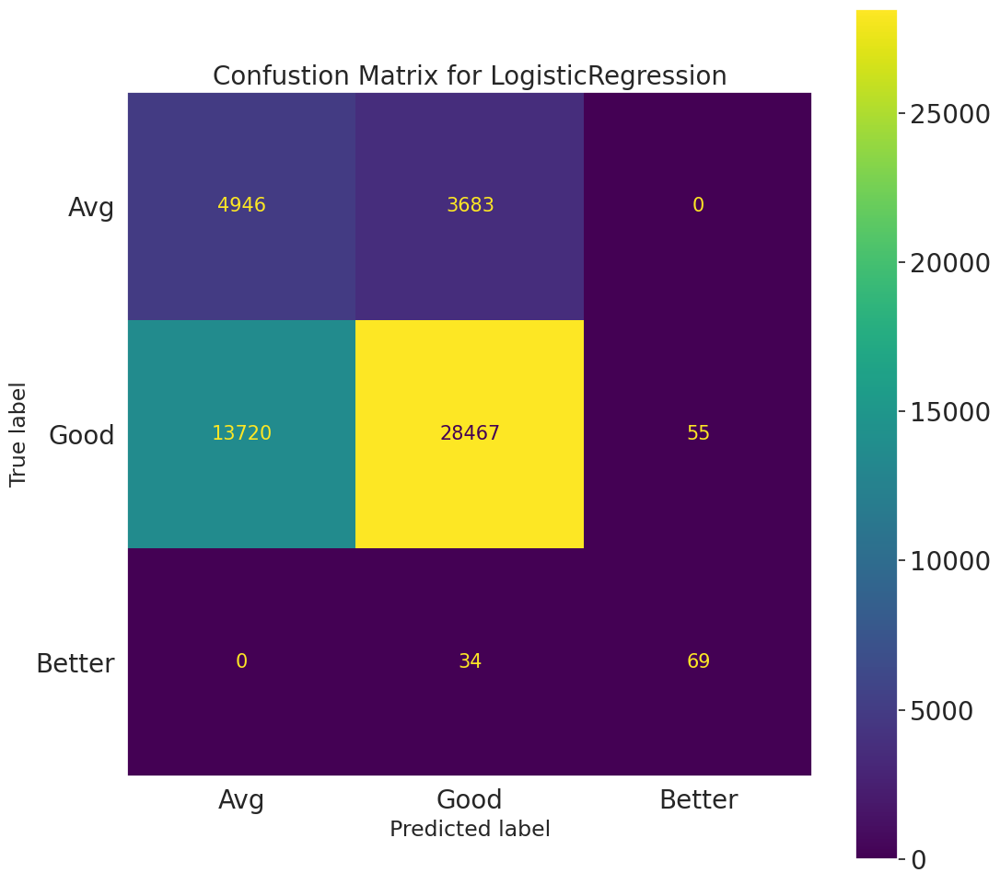

In [311]:
# LogisticRegression

lr_c=LogisticRegression(random_state=0)
lr_c.fit(X_train,y_train)
lr_pred=lr_c.predict(X_test)
lr_cm=confusion_matrix(lr_pred,y_test)
#cm = confusion_matrix(y_pred,y_test)

cmd = ConfusionMatrixDisplay(lr_cm,display_labels =['Avg','Good','Better'])
fig, ax = plt.subplots(figsize=(12,12));
plt.title("Confustion Matrix for LogisticRegression")
cmd.plot(ax=ax);
plt.grid(False)
lr_ac=accuracy_score(lr_pred, y_test)
print('LogisticRegression_accuracy:',lr_ac)

In [312]:
# Report

target_names = ['Avg','Good','Better']
cr = classification_report(y_test,y_pred,target_names = X_Tick_List)
print("Classification Report for LogisticRegression")
print(cr)

Classification Report for LogisticRegression
              precision    recall  f1-score   support

         Avg       0.76      0.80      0.78     18666
        Good       0.88      0.85      0.87     32184
      Better       0.66      0.36      0.47       124

    accuracy                           0.83     50974
   macro avg       0.77      0.67      0.71     50974
weighted avg       0.84      0.83      0.83     50974

